In [5]:
import numpy as np
import time
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split
import torch.optim as optim
import matplotlib.pyplot as plt
import sys, os

project_root = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
sys.path.append(project_root)

from Resources.Model import Model_v27
from Resources.Game import *


### Initializing shared game stats
##### Only once st the start

In [6]:
stats = torch.Tensor([0, 0, 0, 0]) # batch index, white wins, black wins, draws
torch.save(stats, '/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27_2/stats')

##### Initialize Model

In [10]:
model = Model_v27()
model_saves = os.listdir('../Monte Carlo/Model Saves MC v27_2')
if len(model_saves) > 0:
    newest_model = max(int(i[6:-8]) for i in model_saves)
    latest_batch_index = newest_model
    model.load_state_dict(torch.load('../Monte Carlo/Model Saves MC v27_2/model_{}_batches'.format(newest_model)))
criterion = nn.MSELoss()

# error_hist =  []
# latest_batch_index = 0

error_hist = torch.load('./error_hist MC v27_2')

batches:  220


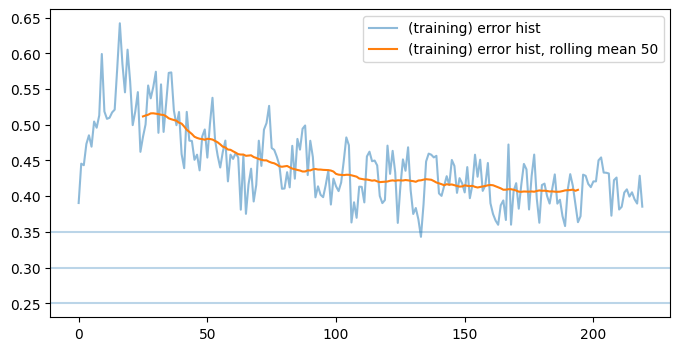

batches:  221
batches:  222
batches:  223
batches:  224
batches:  225
batches:  226
batches:  227
batches:  228
batches:  229
batches:  230


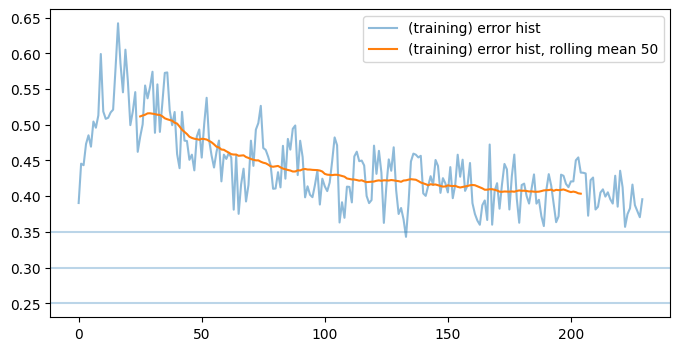

batches:  231
batches:  232
batches:  233
batches:  234
batches:  235
batches:  236
batches:  237
batches:  238
batches:  239
batches:  240


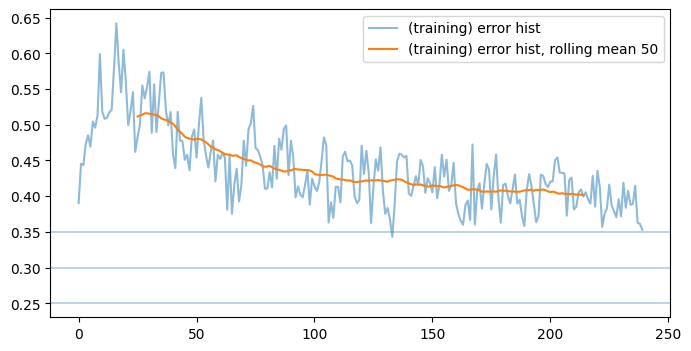

batches:  241
batches:  242
batches:  243
batches:  244
batches:  245
batches:  246
batches:  247
batches:  248
batches:  249
batches:  250


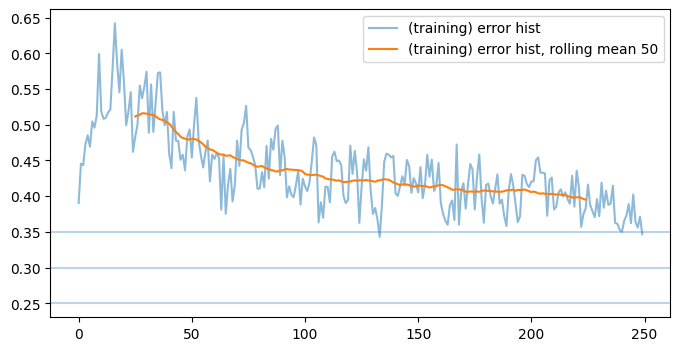

batches:  251
batches:  252
batches:  253
batches:  254
batches:  255
batches:  256
batches:  257
batches:  258
batches:  259
batches:  260


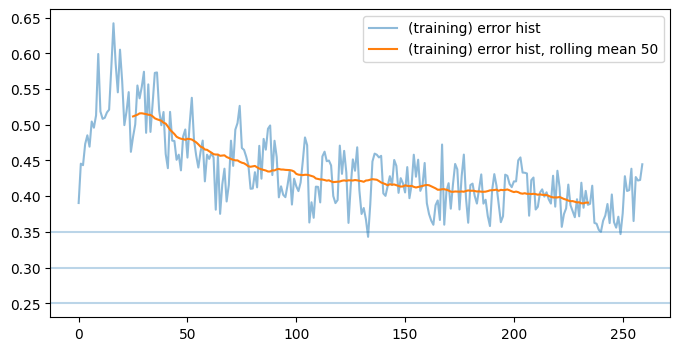

batches:  261
batches:  262
batches:  263
batches:  264
batches:  265
batches:  266
batches:  267
batches:  268
batches:  269
batches:  270


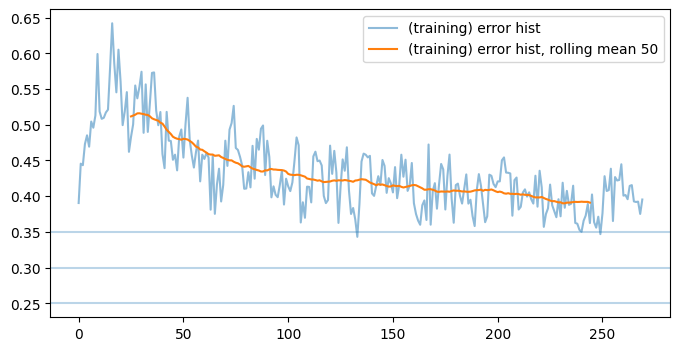

batches:  271
batches:  272
batches:  273
batches:  274
batches:  275
batches:  276
batches:  277
batches:  278
batches:  279
batches:  280


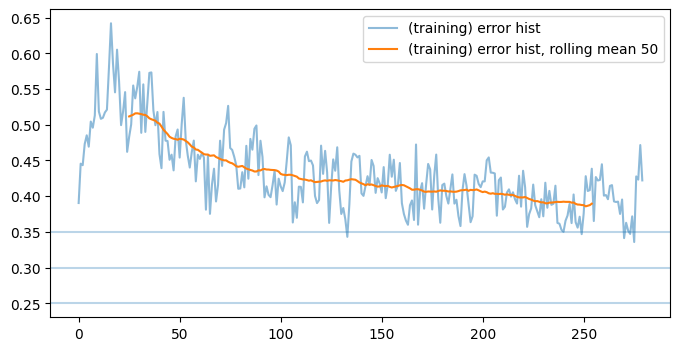

batches:  281
batches:  282
batches:  283
batches:  284
batches:  285
batches:  286
batches:  287
batches:  288
batches:  289
batches:  290


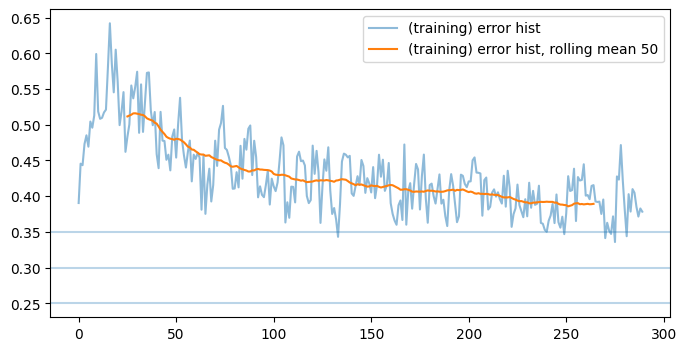

batches:  291
batches:  292
batches:  293
batches:  294
batches:  295
batches:  296
batches:  297
batches:  298
batches:  299
batches:  300


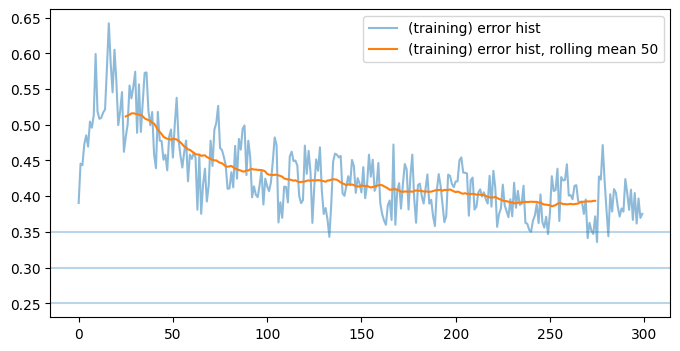

batches:  301
batches:  302
batches:  303
batches:  304
batches:  305
batches:  306
batches:  307
batches:  308
batches:  309
batches:  310


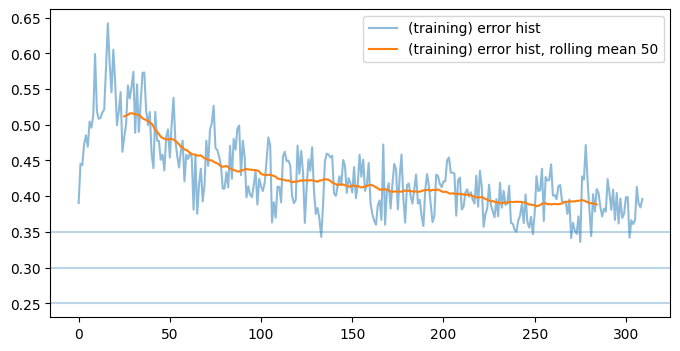

batches:  311
batches:  312
batches:  313
batches:  314
batches:  315
batches:  316
batches:  317
batches:  318
batches:  319
batches:  320


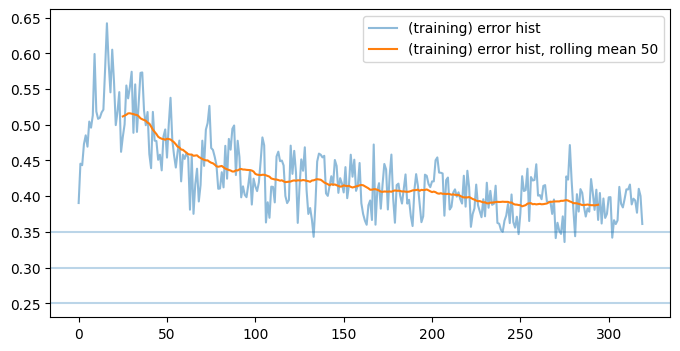

batches:  321
batches:  322
batches:  323
batches:  324
batches:  325
batches:  326
batches:  327
batches:  328
batches:  329
batches:  330


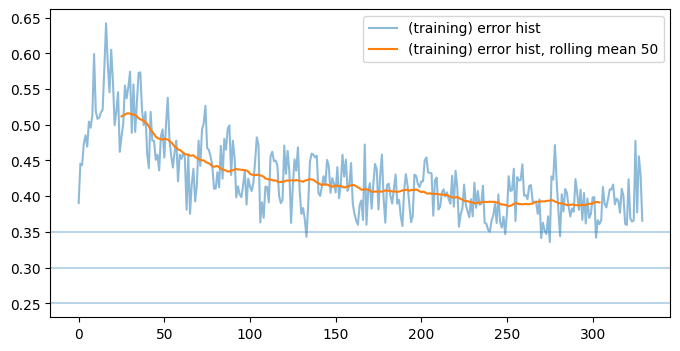

batches:  331
batches:  332
batches:  333
batches:  334
batches:  335
batches:  336
batches:  337
batches:  338
batches:  339
batches:  340


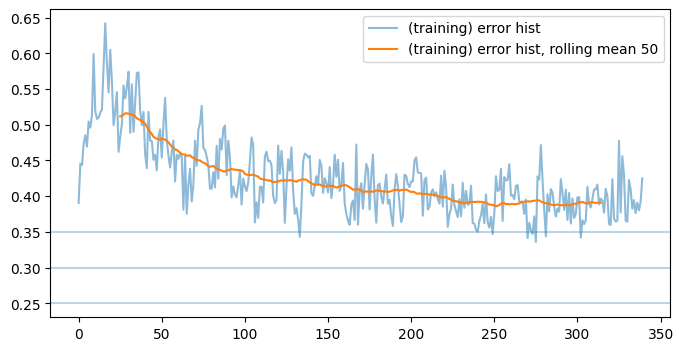

batches:  341
batches:  342
batches:  343
batches:  344
batches:  345
batches:  346
batches:  347
batches:  348
batches:  349
batches:  350


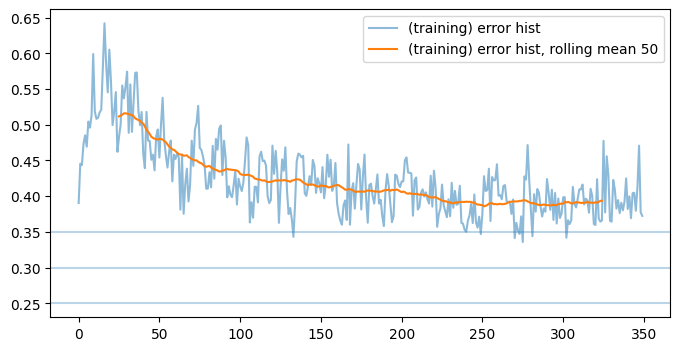

batches:  351
batches:  352
batches:  353
batches:  354
batches:  355
batches:  356
batches:  357
batches:  358
batches:  359
batches:  360


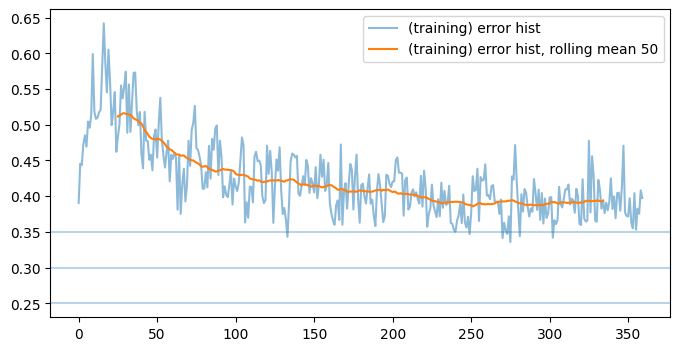

batches:  361
batches:  362
batches:  363
batches:  364
batches:  365
batches:  366
batches:  367
batches:  368
batches:  369
batches:  370


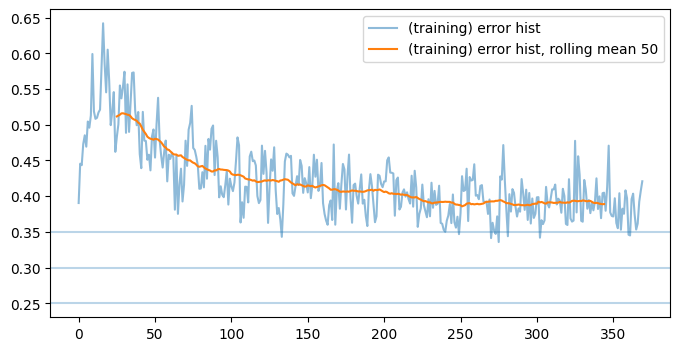

batches:  371
batches:  372
batches:  373
batches:  374
batches:  375
batches:  376
batches:  377
batches:  378
batches:  379
batches:  380


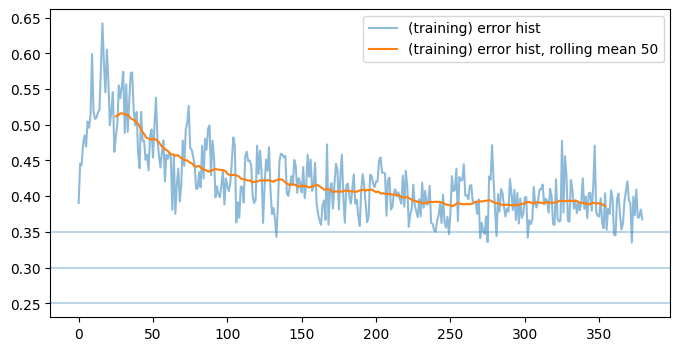

batches:  381
batches:  382
batches:  383
batches:  384
batches:  385
batches:  386
batches:  387
batches:  388
batches:  389
batches:  390


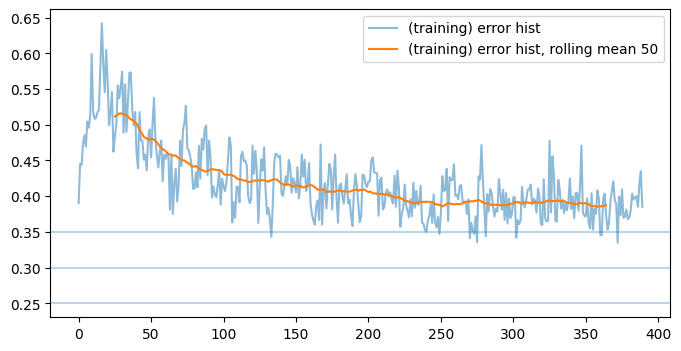

batches:  391
batches:  392
batches:  393
batches:  394
batches:  395
batches:  396
batches:  397
batches:  398
batches:  399
batches:  400


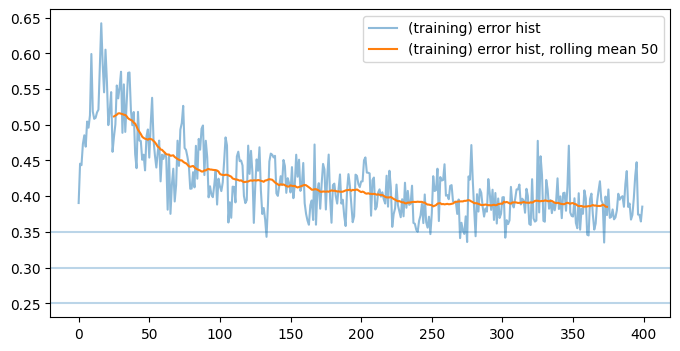

batches:  401
batches:  402
batches:  403
batches:  404
batches:  405
batches:  406
batches:  407
batches:  408
batches:  409
batches:  410


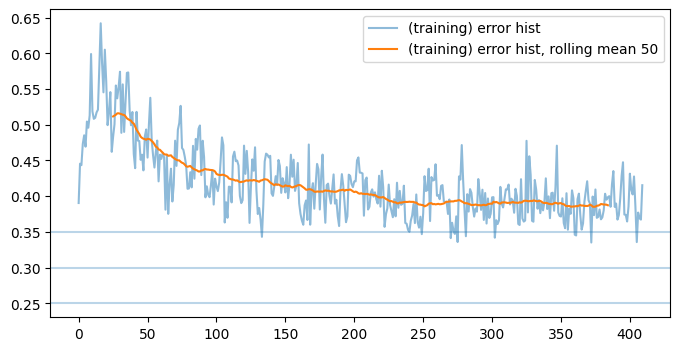

batches:  411
batches:  412
batches:  413
batches:  414
batches:  415
batches:  416
batches:  417
batches:  418
batches:  419
batches:  420


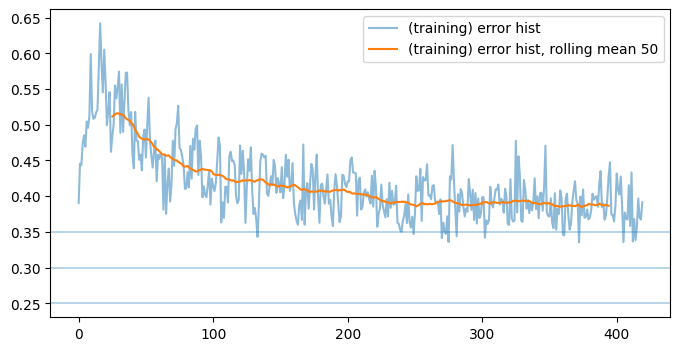

batches:  421
batches:  422
batches:  423
batches:  424
batches:  425
batches:  426
batches:  427
batches:  428
batches:  429
batches:  430


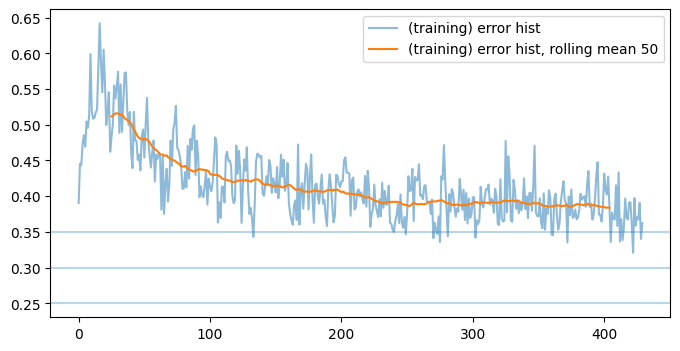

batches:  431
batches:  432
batches:  433
batches:  434
batches:  435
batches:  436
batches:  437
batches:  438
batches:  439
batches:  440


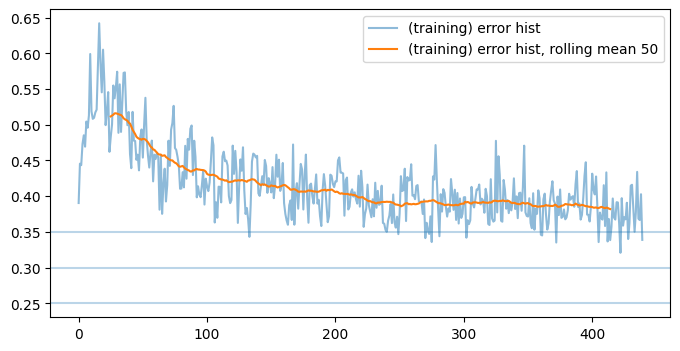

batches:  441
batches:  442
batches:  443
batches:  444
batches:  445
batches:  446
batches:  447
batches:  448
batches:  449
batches:  450


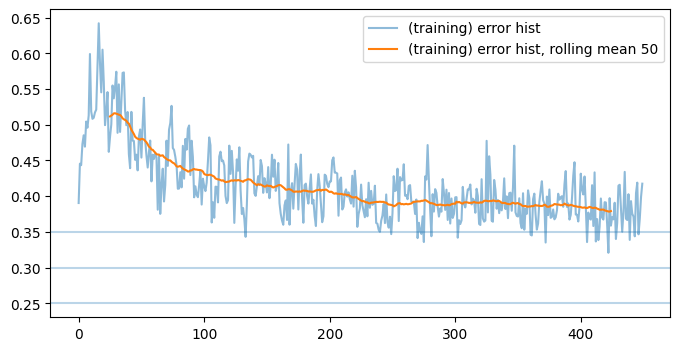

batches:  451
batches:  452
batches:  453
batches:  454
batches:  455
batches:  456
batches:  457
batches:  458
batches:  459
batches:  460


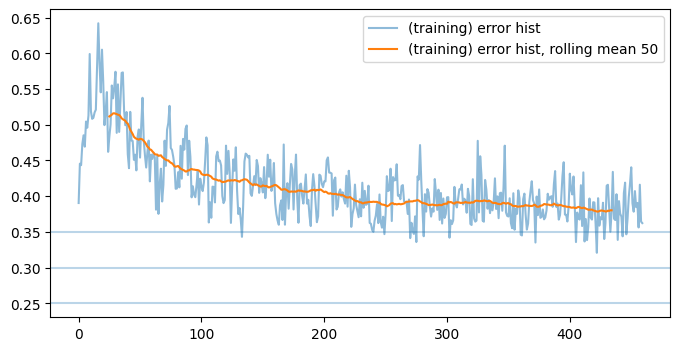

batches:  461
batches:  462
batches:  463
batches:  464
batches:  465
batches:  466
batches:  467
batches:  468
batches:  469
batches:  470


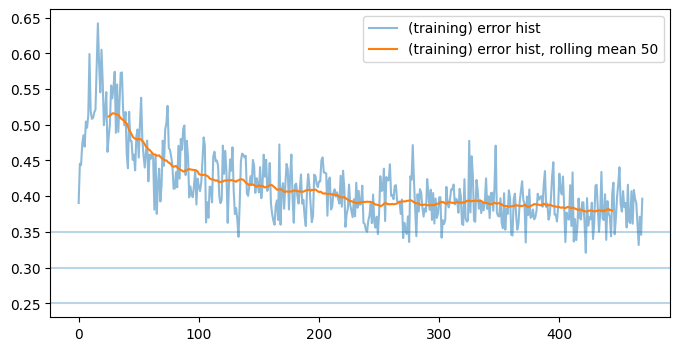

batches:  471
batches:  472
batches:  473
batches:  474
batches:  475
batches:  476
batches:  477
batches:  478
batches:  479
batches:  480


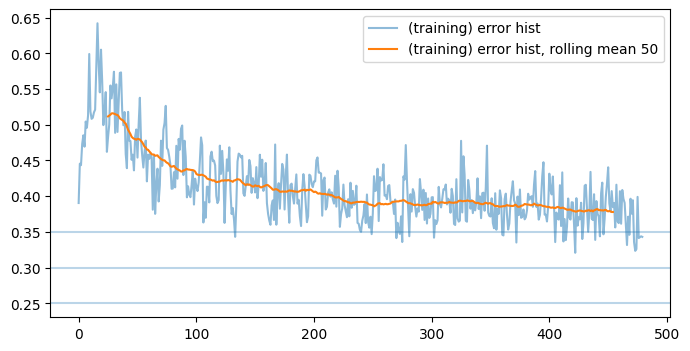

batches:  481
batches:  482
batches:  483
batches:  484
batches:  485
batches:  486
batches:  487
batches:  488
batches:  489
batches:  490


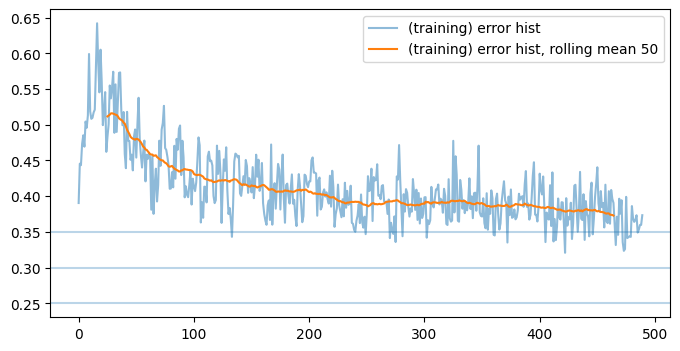

batches:  491
batches:  492
batches:  493
batches:  494
batches:  495
batches:  496
batches:  497
batches:  498
batches:  499
batches:  500


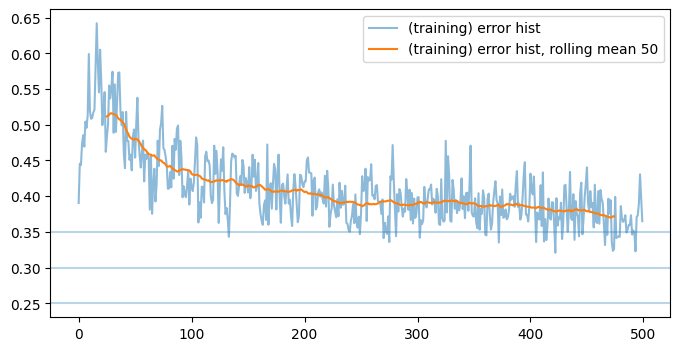

batches:  501
batches:  502
batches:  503
batches:  504
batches:  505
batches:  506
batches:  507
batches:  508
batches:  509
batches:  510


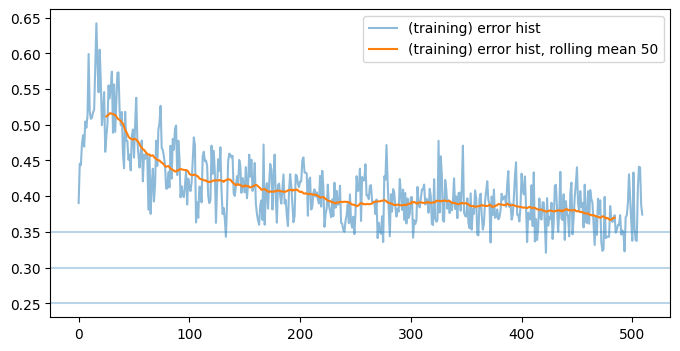

batches:  511
batches:  512
batches:  513
batches:  514
batches:  515
batches:  516
batches:  517
batches:  518
batches:  519
batches:  520


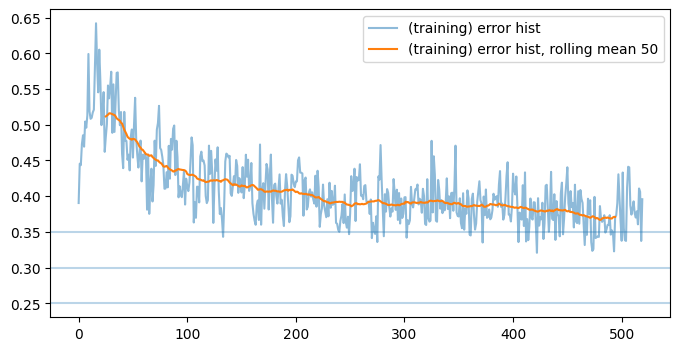

batches:  521
batches:  522
batches:  523
batches:  524
batches:  525
batches:  526
batches:  527
batches:  528
batches:  529
batches:  530


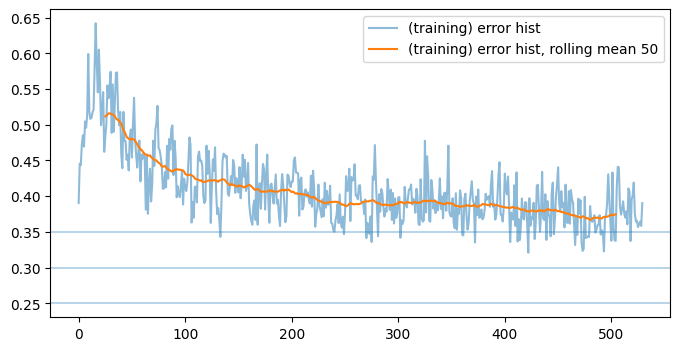

batches:  531
batches:  532
batches:  533
batches:  534
batches:  535
batches:  536
batches:  537
batches:  538
batches:  539
batches:  540


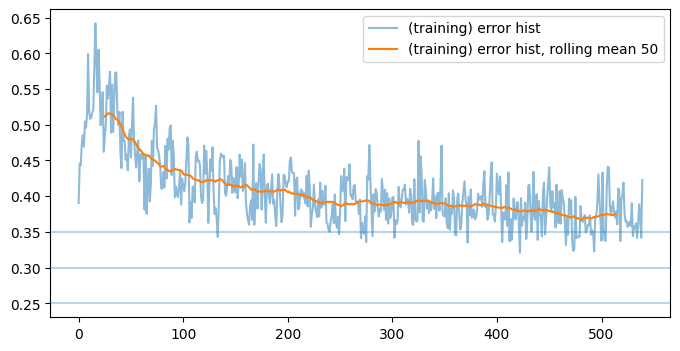

batches:  541
batches:  542
batches:  543
batches:  544
batches:  545
batches:  546
batches:  547
batches:  548
batches:  549
batches:  550


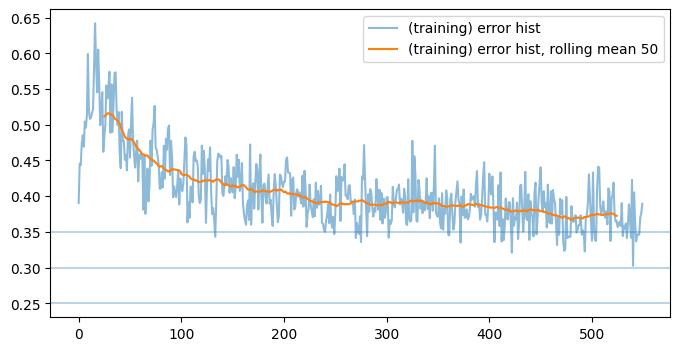

batches:  551
batches:  552
batches:  553
batches:  554
batches:  555
batches:  556
batches:  557
batches:  558
batches:  559
batches:  560


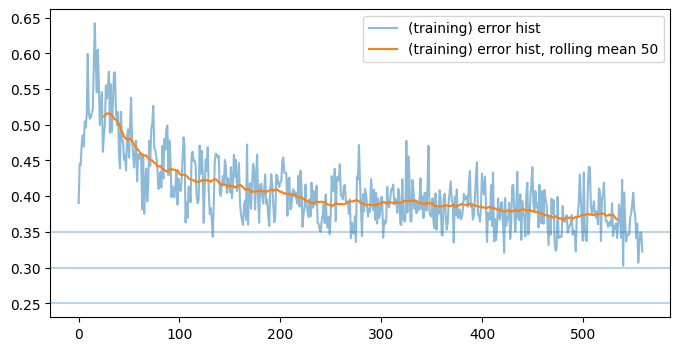

batches:  561
batches:  562
batches:  563
batches:  564
batches:  565
batches:  566
batches:  567
batches:  568
batches:  569
batches:  570


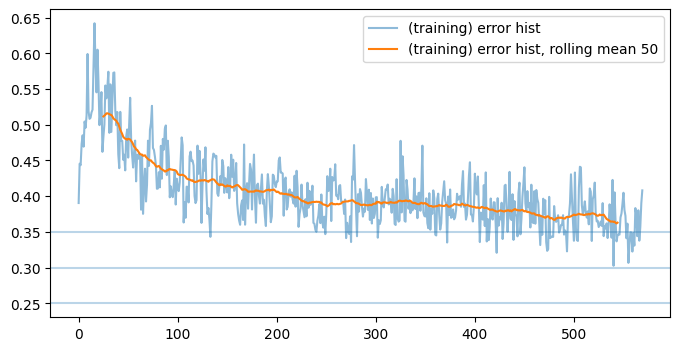

batches:  571
batches:  572
batches:  573
batches:  574
batches:  575
batches:  576
batches:  577
batches:  578
batches:  579
batches:  580


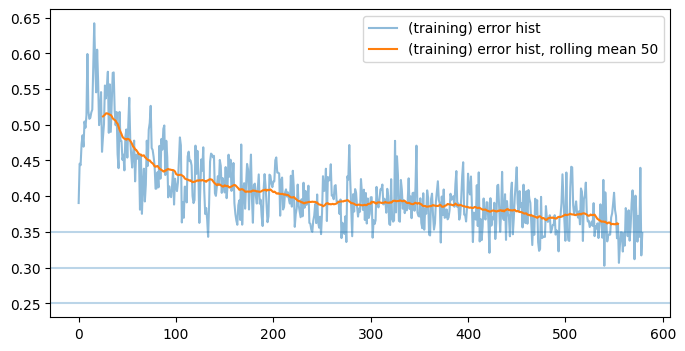

batches:  581
batches:  582
batches:  583
batches:  584
batches:  585
batches:  586
batches:  587
batches:  588
batches:  589
batches:  590


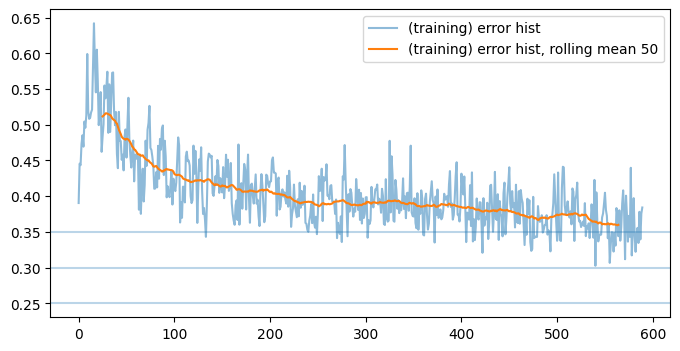

batches:  591
batches:  592
batches:  593
batches:  594
batches:  595
batches:  596
batches:  597
batches:  598
batches:  599
batches:  600


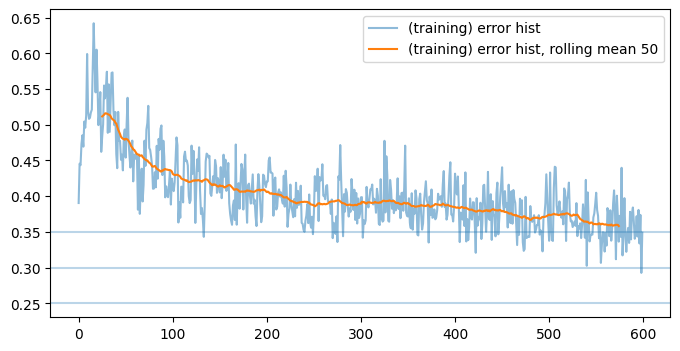

batches:  601
batches:  602
batches:  603
batches:  604
batches:  605
batches:  606
batches:  607
batches:  608
batches:  609
batches:  610


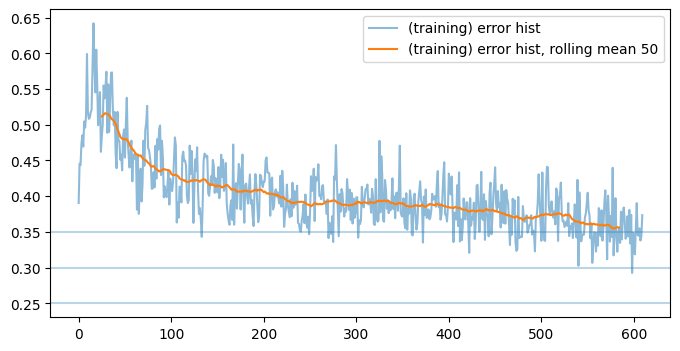

batches:  611
batches:  612
batches:  613
batches:  614
batches:  615
batches:  616
batches:  617
batches:  618
batches:  619
batches:  620


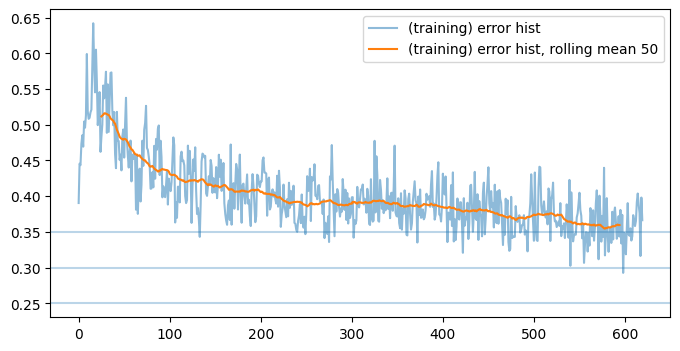

batches:  621
batches:  622
batches:  623
batches:  624
batches:  625
batches:  626
batches:  627
batches:  628
batches:  629
batches:  630


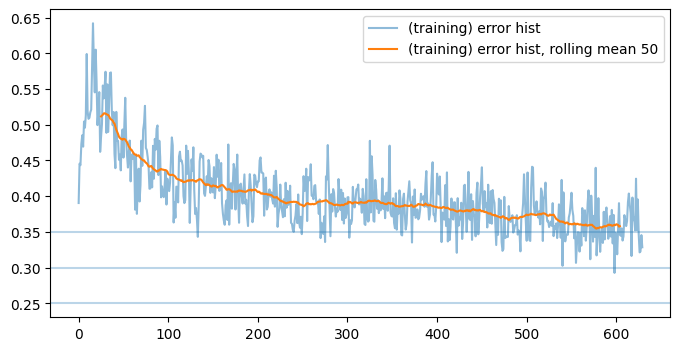

batches:  631
batches:  632
batches:  633
batches:  634
batches:  635
batches:  636
batches:  637
batches:  638
batches:  639
batches:  640


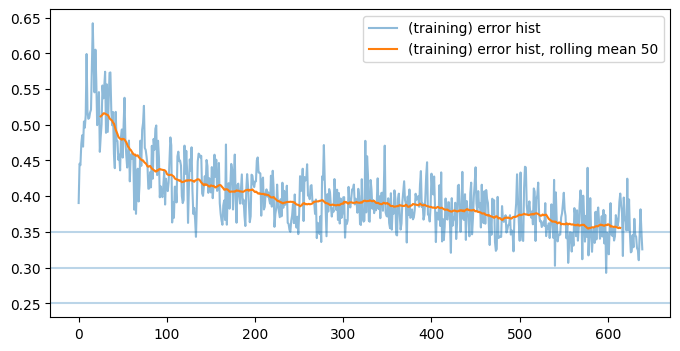

batches:  641
batches:  642
batches:  643
batches:  644
batches:  645
batches:  646
batches:  647
batches:  648
batches:  649
batches:  650


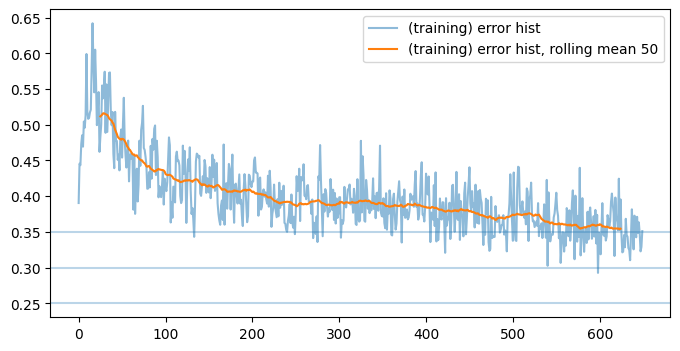

batches:  651
batches:  652
batches:  653
batches:  654
batches:  655
batches:  656
batches:  657
batches:  658
batches:  659
batches:  660


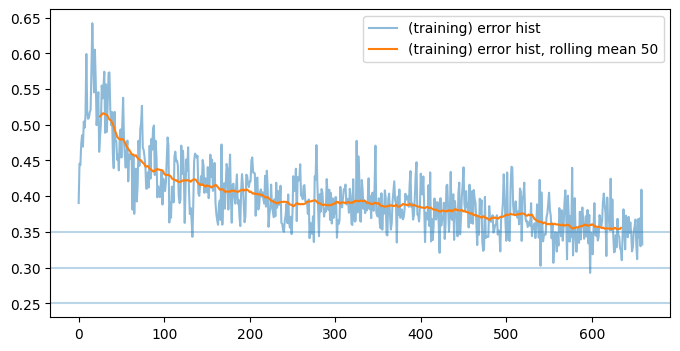

batches:  661
batches:  662
batches:  663
batches:  664
batches:  665
batches:  666
batches:  667
batches:  668
batches:  669
batches:  670


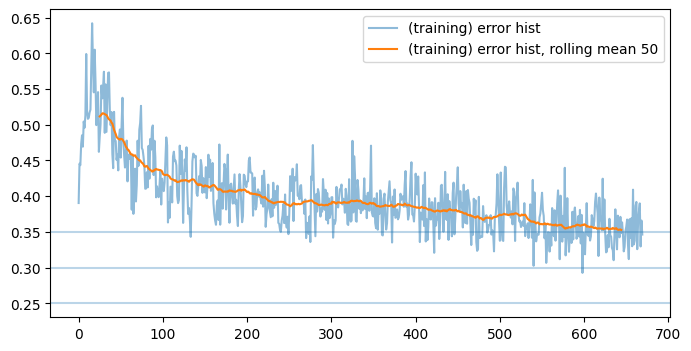

batches:  671
batches:  672
batches:  673
batches:  674
batches:  675
batches:  676
batches:  677
batches:  678
batches:  679
batches:  680


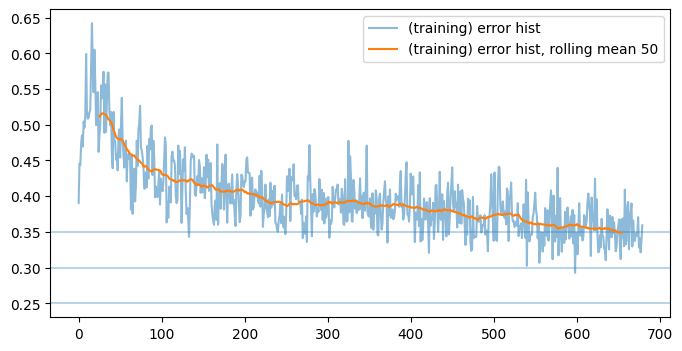

batches:  681
batches:  682
batches:  683
batches:  684
batches:  685
batches:  686
batches:  687
batches:  688
batches:  689
batches:  690


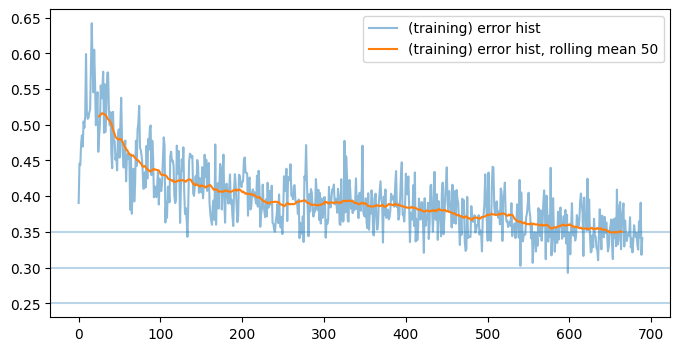

batches:  691
batches:  692
batches:  693
batches:  694
batches:  695
batches:  696
batches:  697
batches:  698
batches:  699
batches:  700


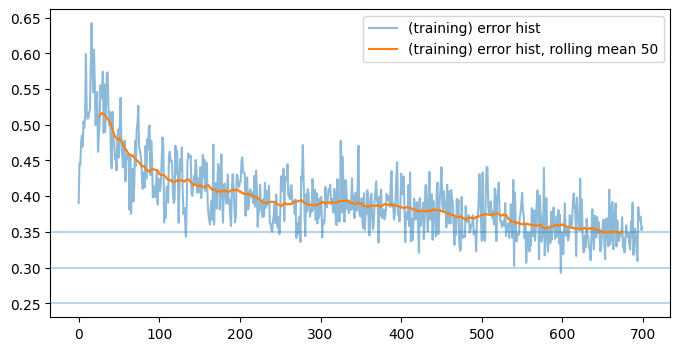

batches:  701
batches:  702
batches:  703
batches:  704
batches:  705
batches:  706
batches:  707
batches:  708
batches:  709
batches:  710


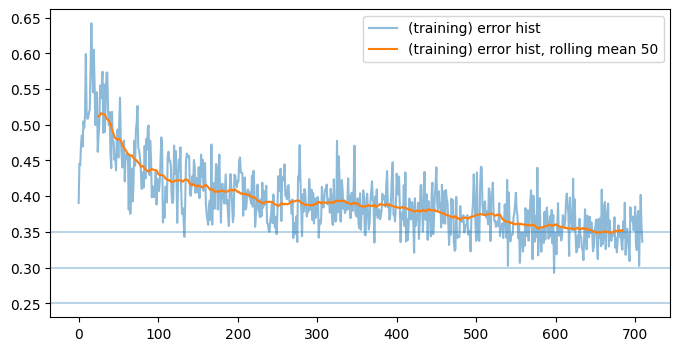

batches:  711
batches:  712
batches:  713
batches:  714
batches:  715
batches:  716
batches:  717
batches:  718
batches:  719
batches:  720


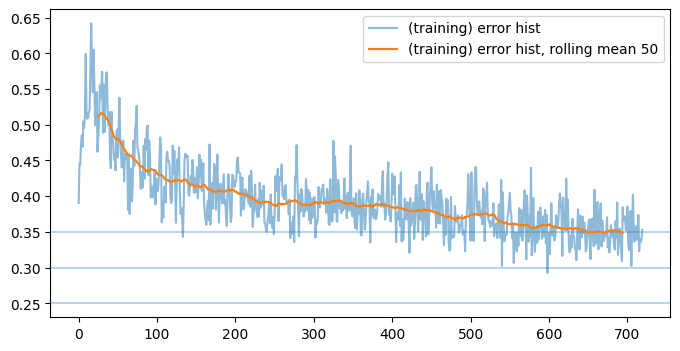

batches:  721
batches:  722
batches:  723
batches:  724
batches:  725
batches:  726
batches:  727
batches:  728
batches:  729
batches:  730


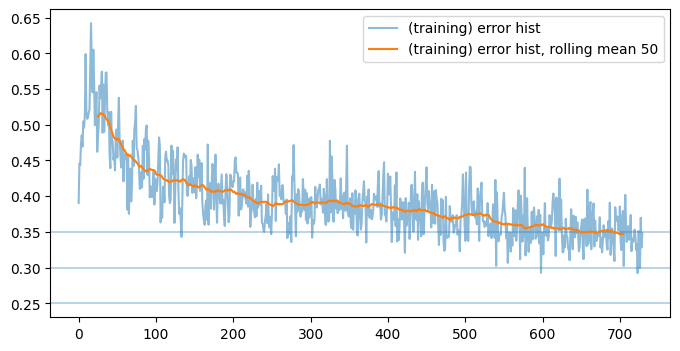

batches:  731
batches:  732
batches:  733
batches:  734
batches:  735
batches:  736
batches:  737
batches:  738
batches:  739
batches:  740


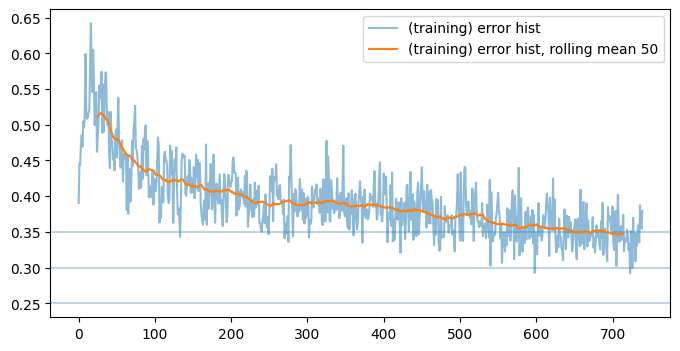

batches:  741
batches:  742
batches:  743
batches:  744
batches:  745
batches:  746
batches:  747
batches:  748
batches:  749
batches:  750


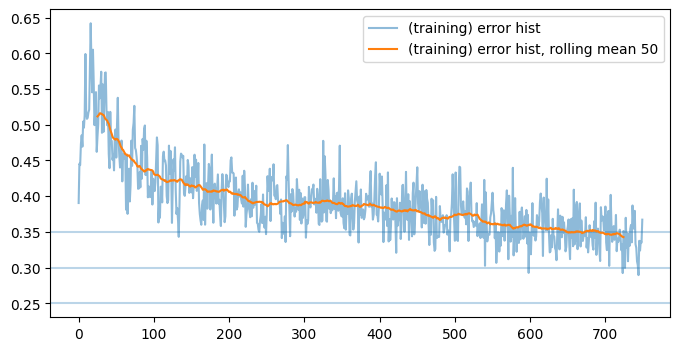

batches:  751
batches:  752
batches:  753
batches:  754
batches:  755
batches:  756
batches:  757
batches:  758
batches:  759
batches:  760


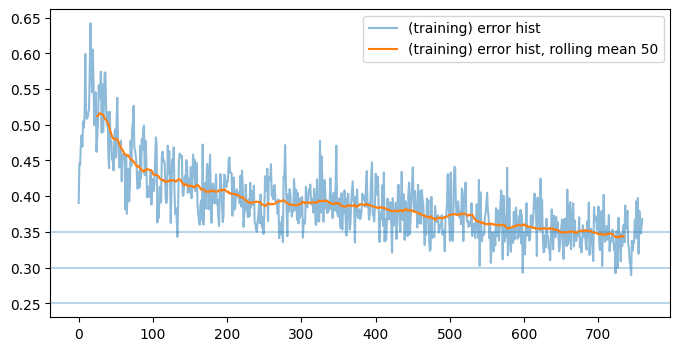

batches:  761
batches:  762
batches:  763
batches:  764
batches:  765
batches:  766
batches:  767
batches:  768
batches:  769
batches:  770


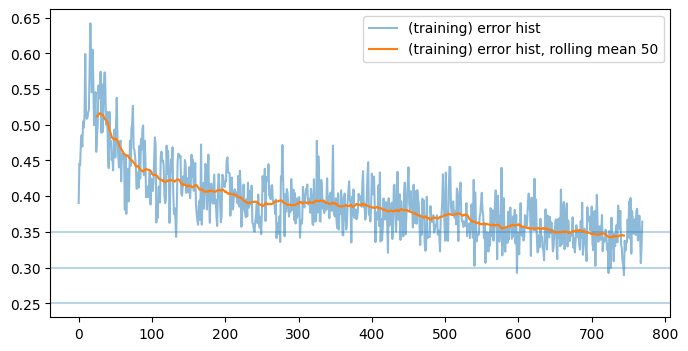

batches:  771
batches:  772
batches:  773
batches:  774
batches:  775
batches:  776
batches:  777
batches:  778
batches:  779
batches:  780


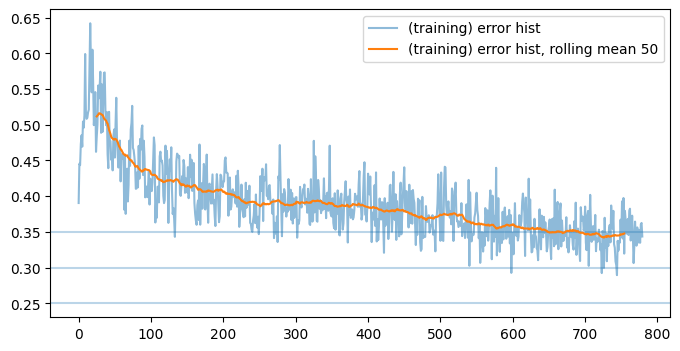

batches:  781
batches:  782
batches:  783
batches:  784
batches:  785
batches:  786
batches:  787
batches:  788
batches:  789
batches:  790


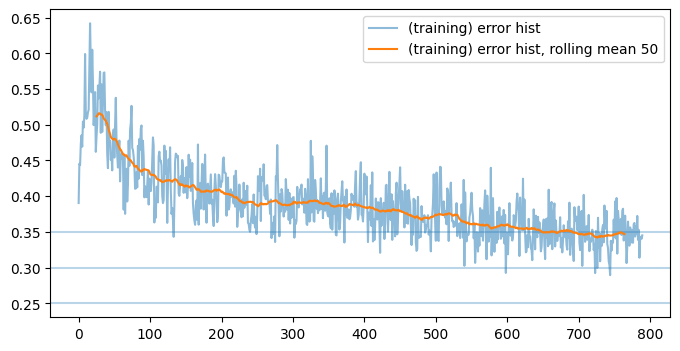

batches:  791
batches:  792
batches:  793
batches:  794
batches:  795
batches:  796
batches:  797
batches:  798
batches:  799
batches:  800


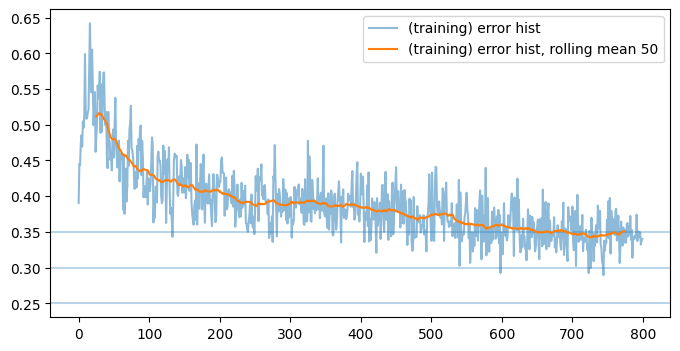

batches:  801
batches:  802
batches:  803
batches:  804
batches:  805
batches:  806
batches:  807
batches:  808
batches:  809
batches:  810


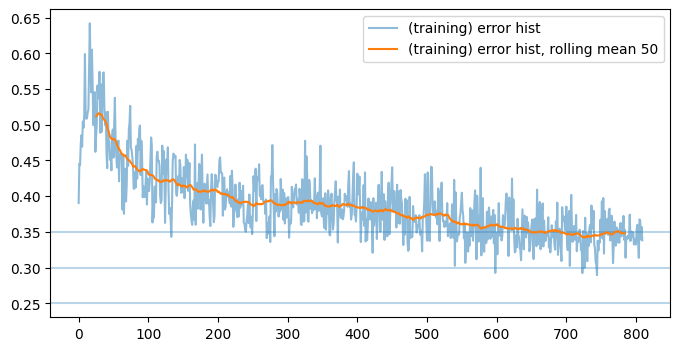

batches:  811
batches:  812
batches:  813
batches:  814
batches:  815
batches:  816
batches:  817
batches:  818
batches:  819
batches:  820


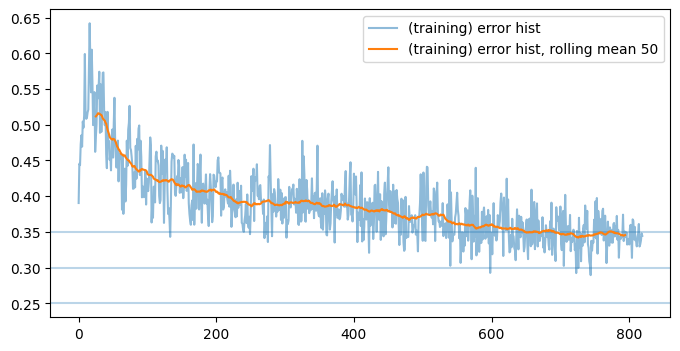

batches:  821
batches:  822
batches:  823
batches:  824
batches:  825
batches:  826
batches:  827
batches:  828
batches:  829
batches:  830


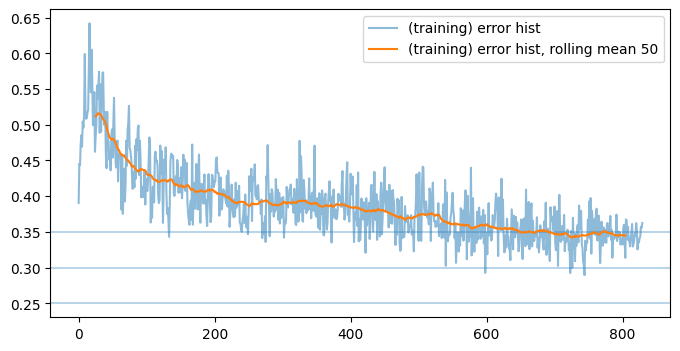

batches:  831
batches:  832
batches:  833
batches:  834
batches:  835
batches:  836
batches:  837
batches:  838
batches:  839
batches:  840


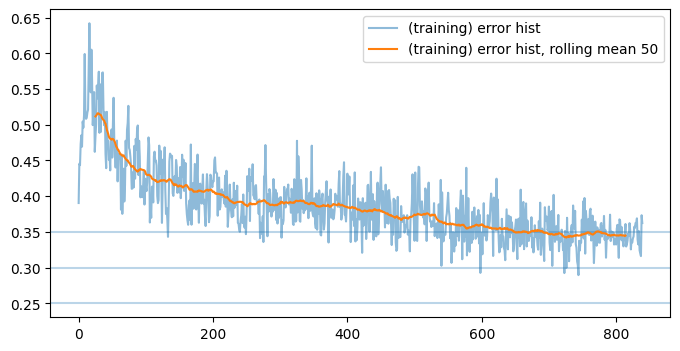

batches:  841
batches:  842
batches:  843
batches:  844
batches:  845
batches:  846
batches:  847
batches:  848
batches:  849
batches:  850


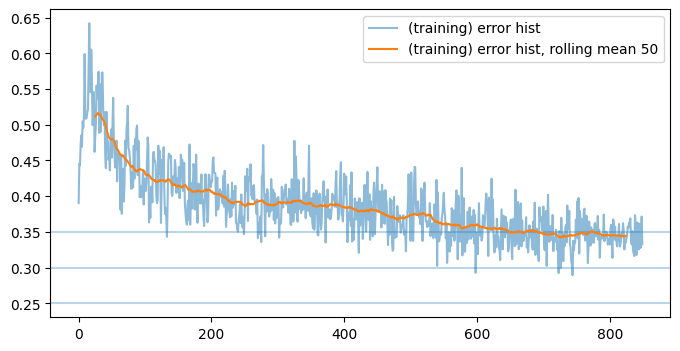

batches:  851
batches:  852
batches:  853
batches:  854
batches:  855
batches:  856
batches:  857
batches:  858
batches:  859
batches:  860


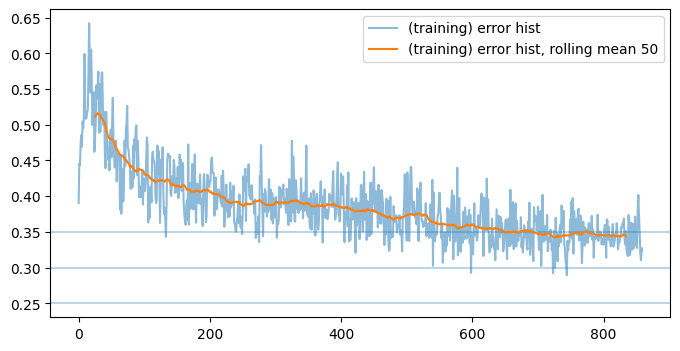

batches:  861
batches:  862
batches:  863
batches:  864
batches:  865
batches:  866
batches:  867
batches:  868
batches:  869
batches:  870


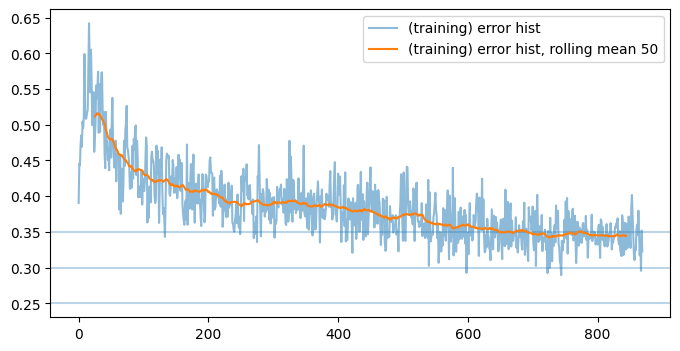

batches:  871
batches:  872
batches:  873
batches:  874
batches:  875
batches:  876
batches:  877
batches:  878
batches:  879
batches:  880


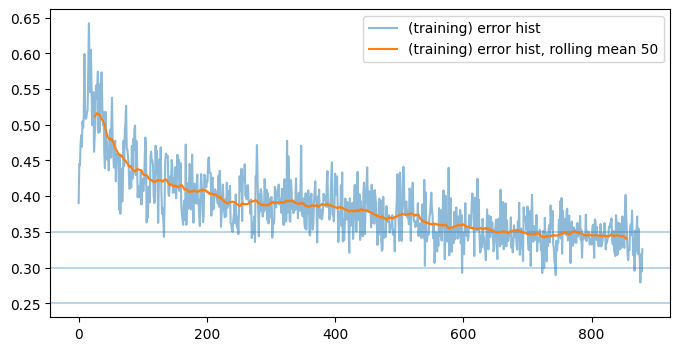

batches:  881
batches:  882
batches:  883
batches:  884
batches:  885
batches:  886
batches:  887
batches:  888
batches:  889
batches:  890


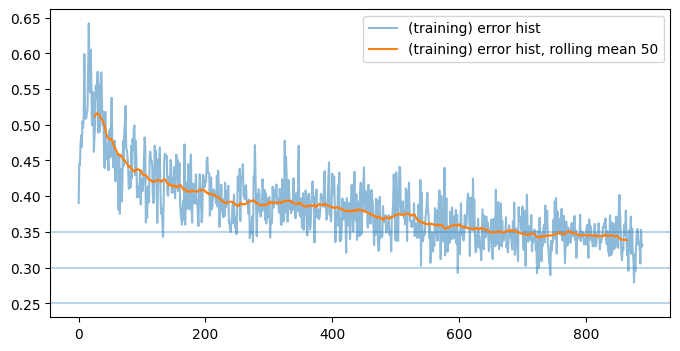

batches:  891
batches:  892
batches:  893
batches:  894
batches:  895
batches:  896
batches:  897
batches:  898
batches:  899
batches:  900


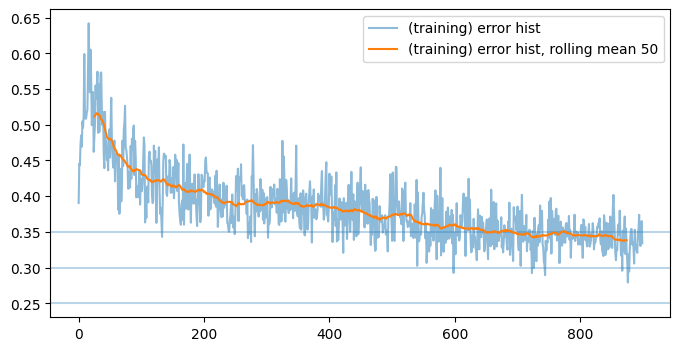

batches:  901
batches:  902
batches:  903
batches:  904
batches:  905
batches:  906
batches:  907
batches:  908
batches:  909
batches:  910


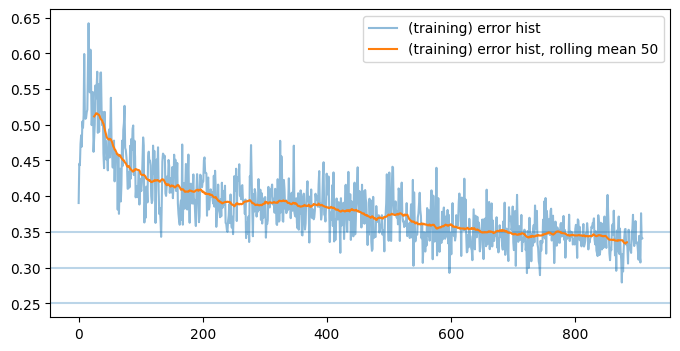

batches:  911
batches:  912
batches:  913
batches:  914
batches:  915
batches:  916
batches:  917
batches:  918
batches:  919
batches:  920


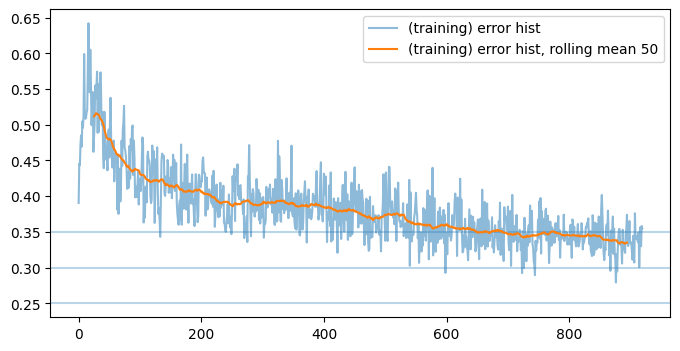

batches:  921
batches:  922
batches:  923
batches:  924
batches:  925
batches:  926
batches:  927
batches:  928
batches:  929
batches:  930


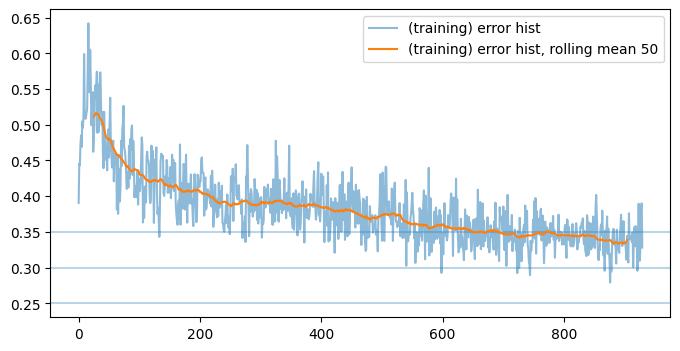

batches:  931
batches:  932
batches:  933
batches:  934
batches:  935
batches:  936
batches:  937
batches:  938
batches:  939
batches:  940


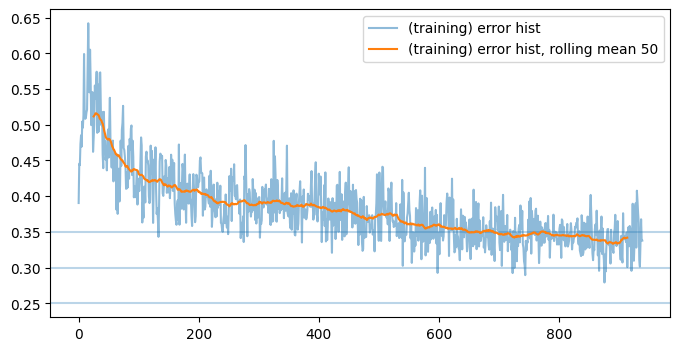

batches:  941
batches:  942
batches:  943
batches:  944
batches:  945
batches:  946
batches:  947
batches:  948
batches:  949
batches:  950


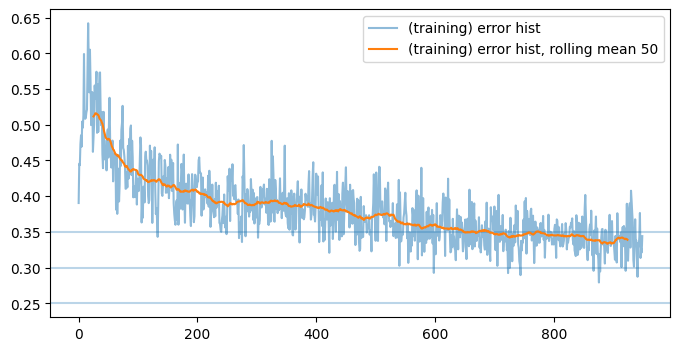

batches:  951
batches:  952
batches:  953
batches:  954
batches:  955
batches:  956
batches:  957
batches:  958
batches:  959
batches:  960


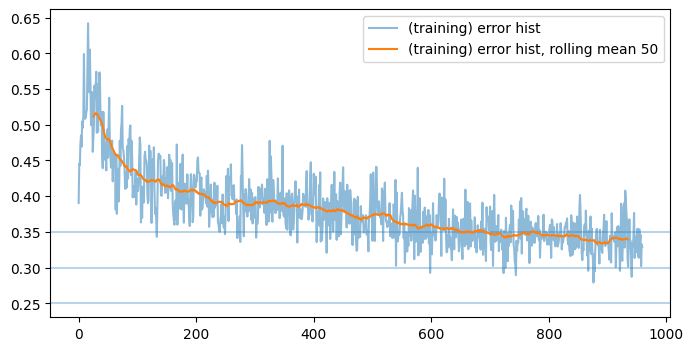

batches:  961
batches:  962
batches:  963
batches:  964
batches:  965
batches:  966
batches:  967
batches:  968
batches:  969
batches:  970


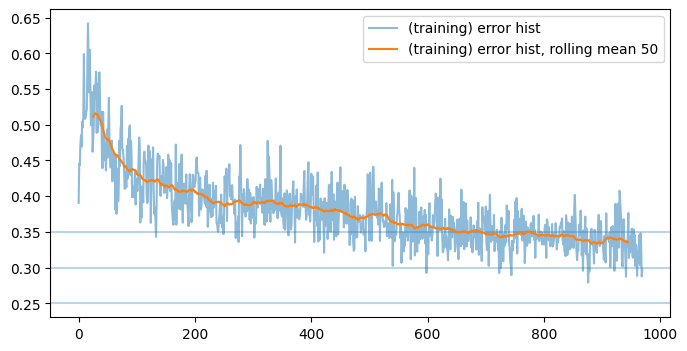

batches:  971
batches:  972
batches:  973
batches:  974
batches:  975
batches:  976
batches:  977
batches:  978
batches:  979
batches:  980


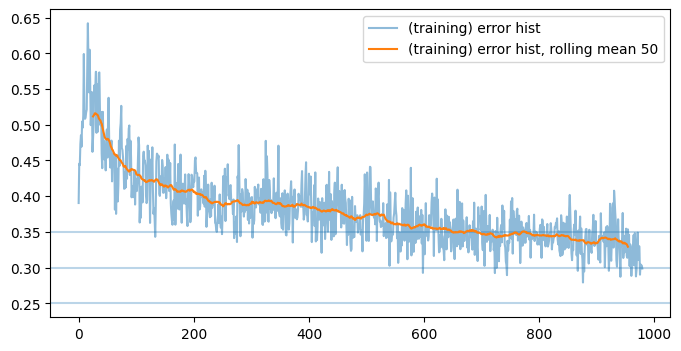

batches:  981
batches:  982
batches:  983
batches:  984
batches:  985
batches:  986
batches:  987
batches:  988
batches:  989
batches:  990


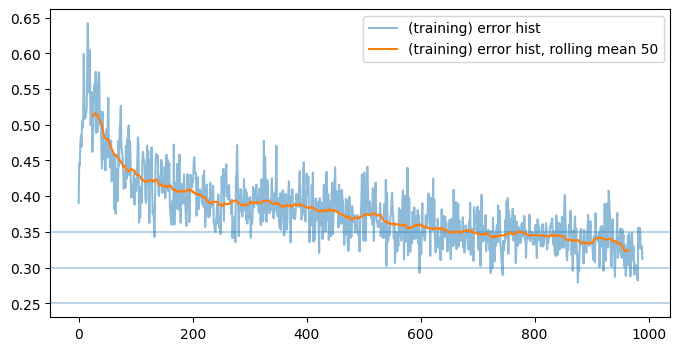

batches:  991
batches:  992
batches:  993
batches:  994
batches:  995
batches:  996
batches:  997
batches:  998
batches:  999
batches:  1000


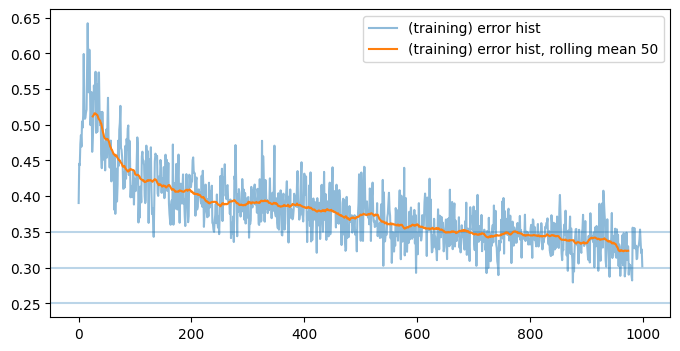

batches:  1001
batches:  1002
batches:  1003
batches:  1004
batches:  1005
batches:  1006
batches:  1007
batches:  1008
batches:  1009
batches:  1010


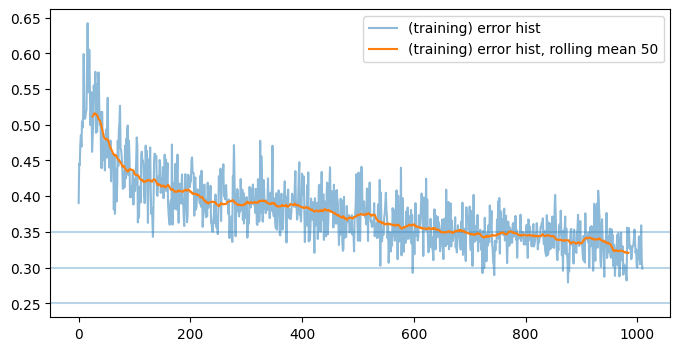

batches:  1011
batches:  1012
batches:  1013
batches:  1014
batches:  1015
batches:  1016
batches:  1017
batches:  1018
batches:  1019
batches:  1020


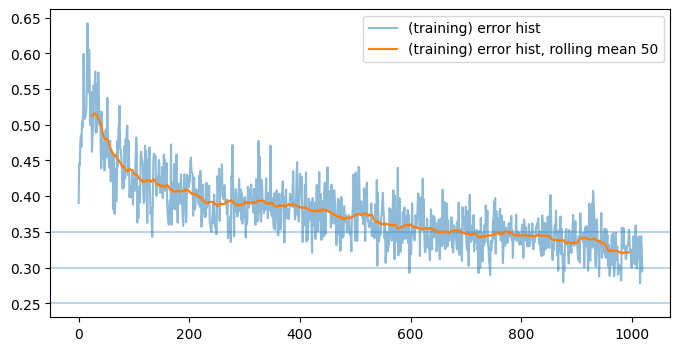

batches:  1021
batches:  1022
batches:  1023
batches:  1024
batches:  1025
batches:  1026
batches:  1027
batches:  1028
batches:  1029
batches:  1030


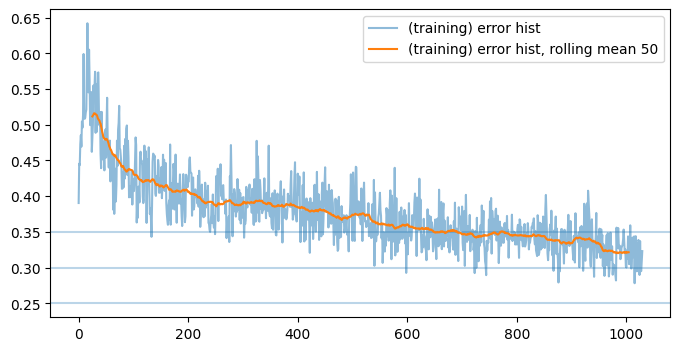

batches:  1031
batches:  1032
batches:  1033
batches:  1034
batches:  1035
batches:  1036
batches:  1037
batches:  1038
batches:  1039
batches:  1040


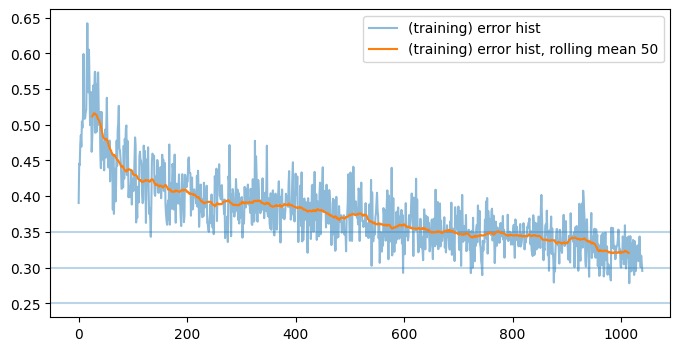

batches:  1041
batches:  1042
batches:  1043
batches:  1044
batches:  1045
batches:  1046
batches:  1047
batches:  1048
batches:  1049
batches:  1050


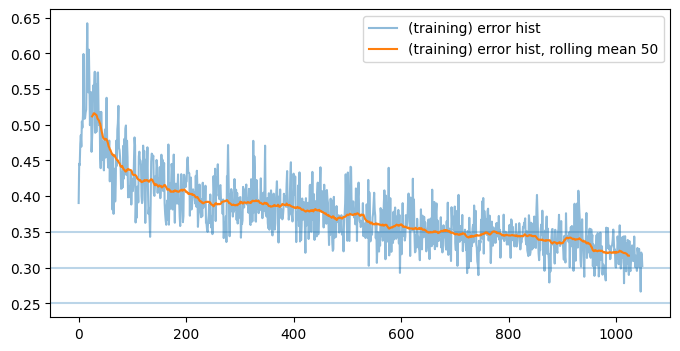

batches:  1051
batches:  1052
batches:  1053
batches:  1054
batches:  1055
batches:  1056
batches:  1057
batches:  1058
batches:  1059
batches:  1060


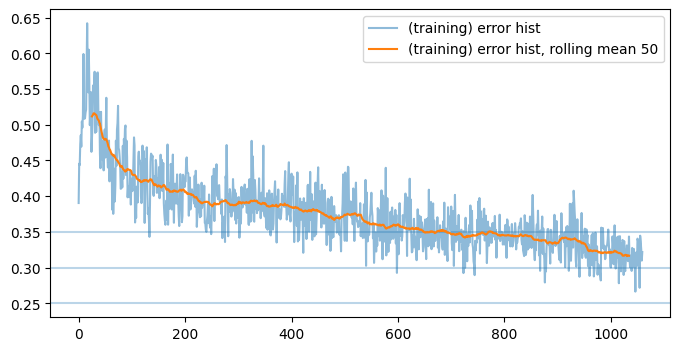

batches:  1061
batches:  1062
batches:  1063
batches:  1064
batches:  1065
batches:  1066
batches:  1067
batches:  1068
batches:  1069
batches:  1070


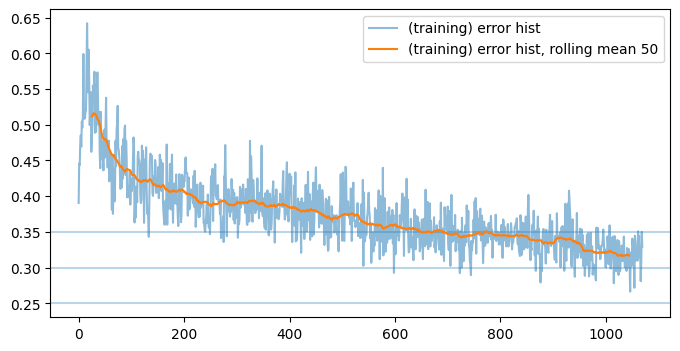

batches:  1071
batches:  1072
batches:  1073
batches:  1074
batches:  1075
batches:  1076
batches:  1077
batches:  1078
batches:  1079
batches:  1080


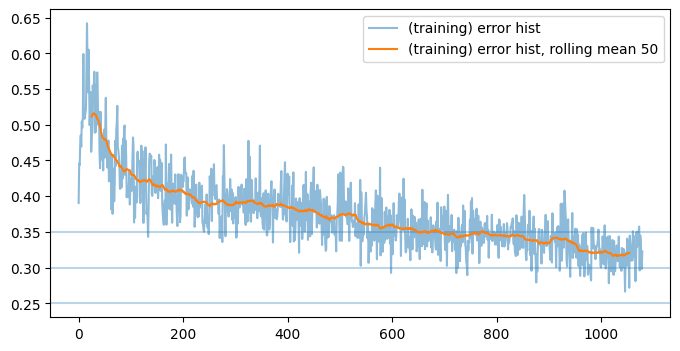

batches:  1081
batches:  1082
batches:  1083
batches:  1084
batches:  1085
batches:  1086
batches:  1087
batches:  1088
batches:  1089
batches:  1090


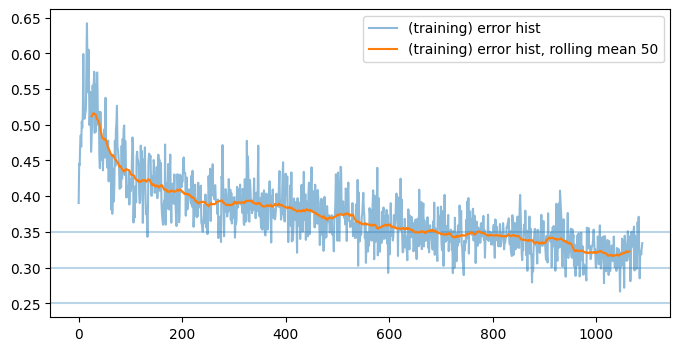

batches:  1091
batches:  1092
batches:  1093
batches:  1094
batches:  1095
batches:  1096
batches:  1097
batches:  1098
batches:  1099
batches:  1100


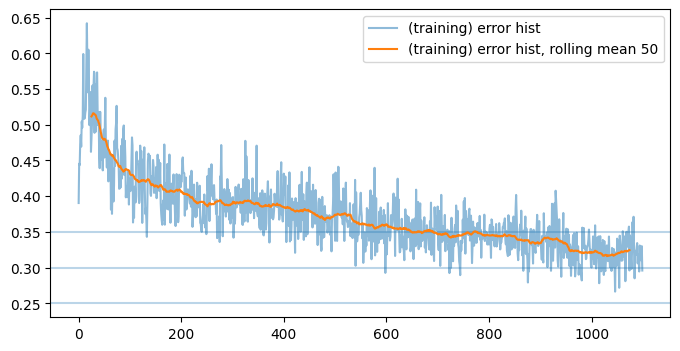

batches:  1101
batches:  1102
batches:  1103
batches:  1104
batches:  1105
batches:  1106
batches:  1107
batches:  1108
batches:  1109
batches:  1110


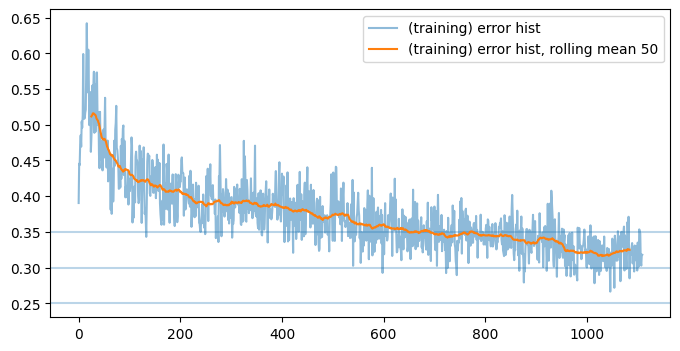

batches:  1111
batches:  1112
batches:  1113
batches:  1114
batches:  1115
batches:  1116
batches:  1117
batches:  1118
batches:  1119
batches:  1120


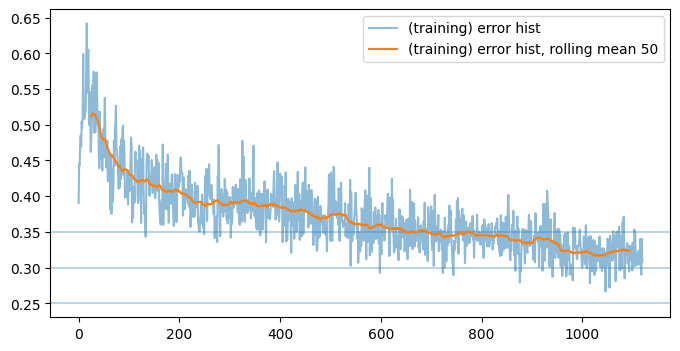

batches:  1121
batches:  1122
batches:  1123
batches:  1124
batches:  1125
batches:  1126
batches:  1127
batches:  1128
batches:  1129
batches:  1130


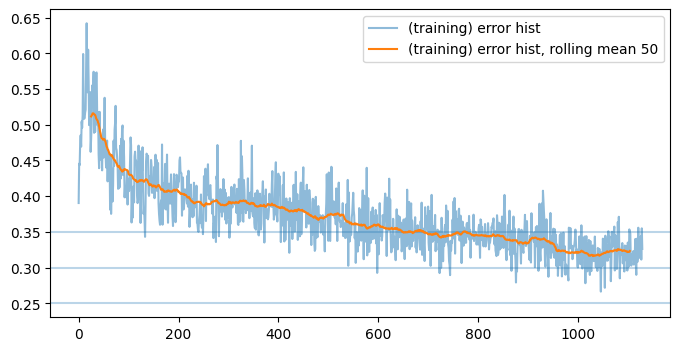

batches:  1131
batches:  1132
batches:  1133
batches:  1134
batches:  1135
batches:  1136
batches:  1137
batches:  1138
batches:  1139
batches:  1140


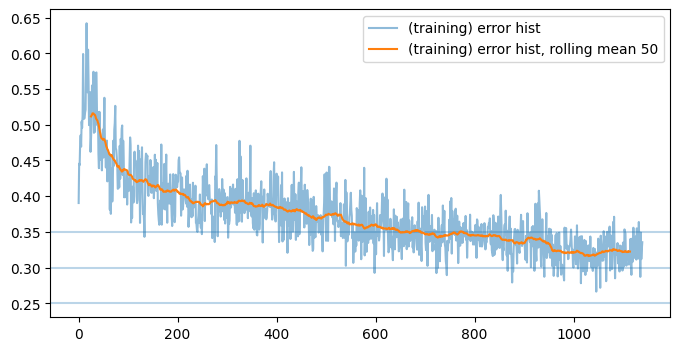

batches:  1141
batches:  1142
batches:  1143
batches:  1144
batches:  1145
batches:  1146
batches:  1147
batches:  1148
batches:  1149
batches:  1150


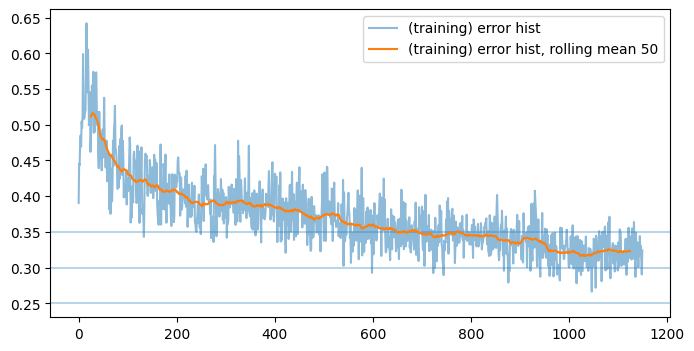

batches:  1151
batches:  1152
batches:  1153
batches:  1154
batches:  1155
batches:  1156
batches:  1157
batches:  1158
batches:  1159
batches:  1160


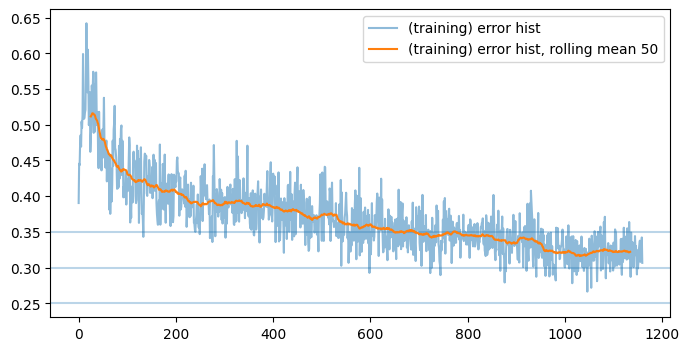

batches:  1161
batches:  1162
batches:  1163
batches:  1164
batches:  1165
batches:  1166
batches:  1167
batches:  1168
batches:  1169
batches:  1170


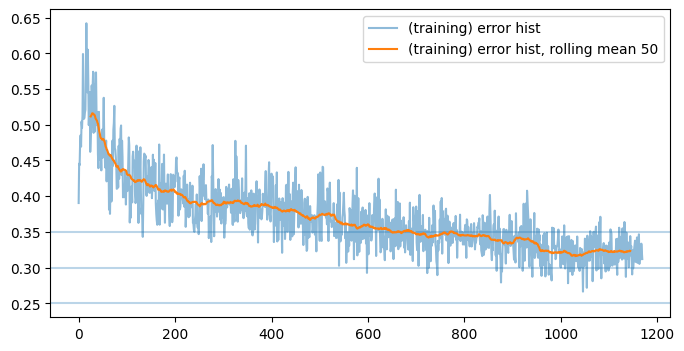

batches:  1171
batches:  1172
batches:  1173
batches:  1174
batches:  1175
batches:  1176
batches:  1177
batches:  1178
batches:  1179
batches:  1180


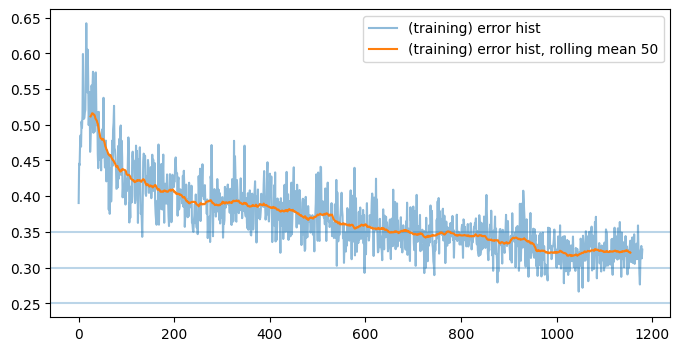

batches:  1181
batches:  1182
batches:  1183
batches:  1184
batches:  1185
batches:  1186
batches:  1187
batches:  1188
batches:  1189
batches:  1190


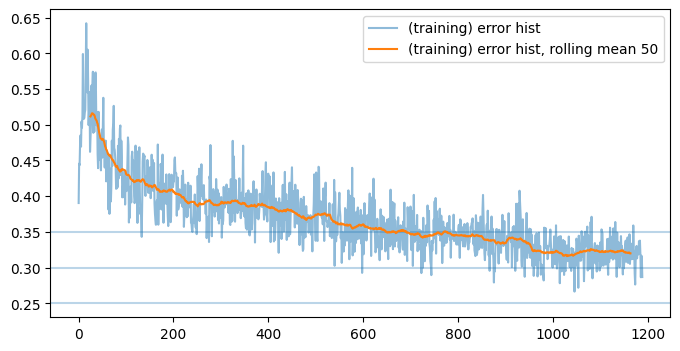

batches:  1191
batches:  1192
batches:  1193
batches:  1194
batches:  1195
batches:  1196
batches:  1197
batches:  1198
batches:  1199
batches:  1200


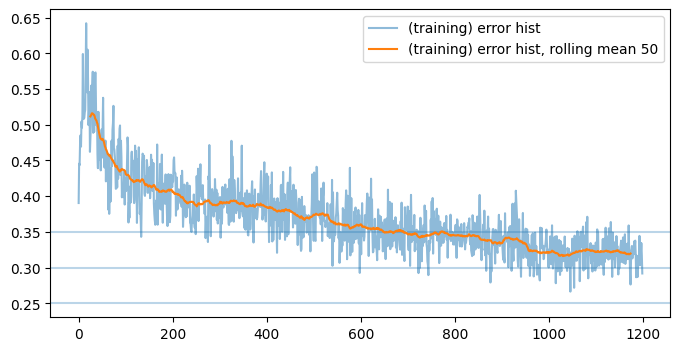

batches:  1201
batches:  1202
batches:  1203
batches:  1204
batches:  1205
batches:  1206
batches:  1207
batches:  1208
batches:  1209
batches:  1210


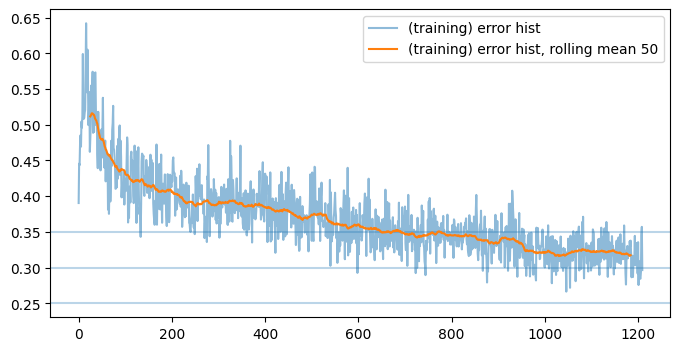

batches:  1211
batches:  1212
batches:  1213
batches:  1214
batches:  1215
batches:  1216
batches:  1217
batches:  1218
batches:  1219
batches:  1220


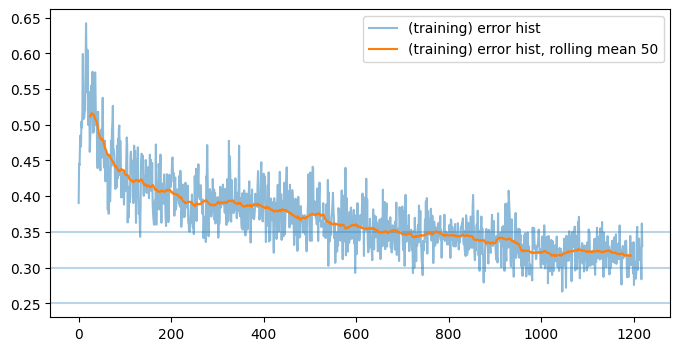

batches:  1221
batches:  1222
batches:  1223
batches:  1224
batches:  1225
batches:  1226
batches:  1227
batches:  1228
batches:  1229
batches:  1230


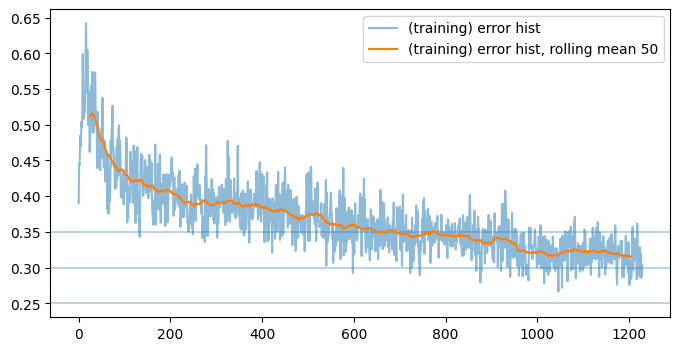

batches:  1231
batches:  1232
batches:  1233
batches:  1234
batches:  1235
batches:  1236
batches:  1237
batches:  1238
batches:  1239
batches:  1240


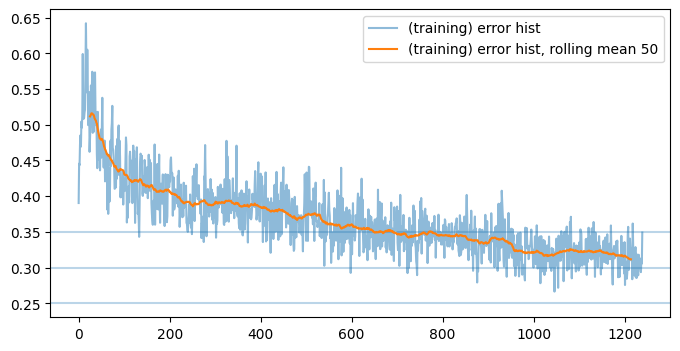

batches:  1241
batches:  1242
batches:  1243
batches:  1244
batches:  1245
batches:  1246
batches:  1247
batches:  1248
batches:  1249
batches:  1250


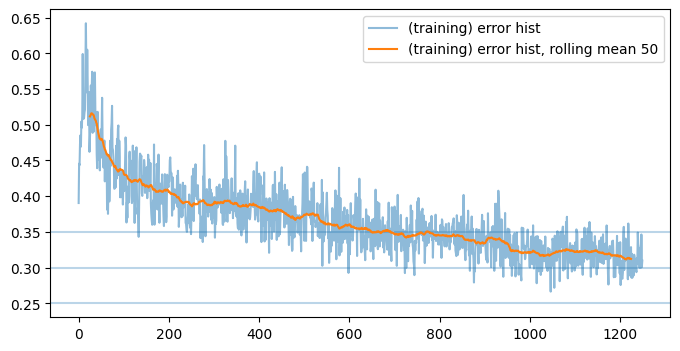

batches:  1251
batches:  1252
batches:  1253
batches:  1254
batches:  1255
batches:  1256
batches:  1257
batches:  1258
batches:  1259
batches:  1260


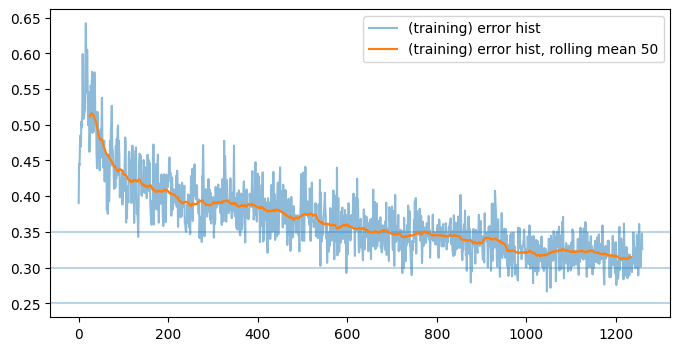

batches:  1261
batches:  1262
batches:  1263
batches:  1264
batches:  1265
batches:  1266
batches:  1267
batches:  1268
batches:  1269
batches:  1270


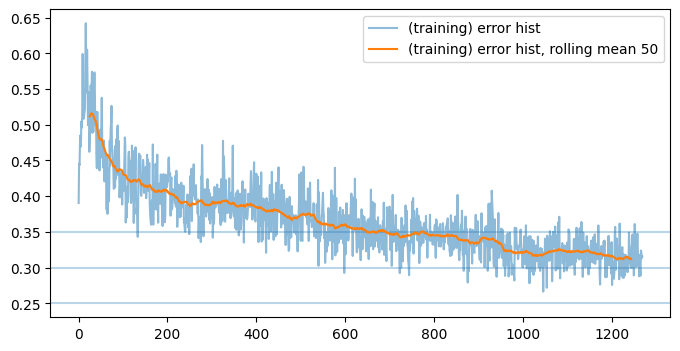

batches:  1271
batches:  1272
batches:  1273
batches:  1274
batches:  1275
batches:  1276
batches:  1277
batches:  1278
batches:  1279
batches:  1280


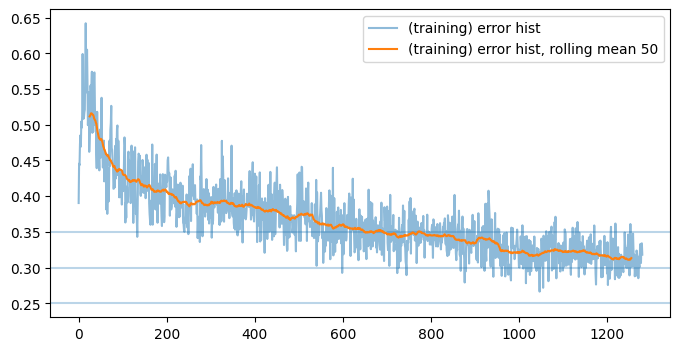

batches:  1281
batches:  1282
batches:  1283
batches:  1284
batches:  1285
batches:  1286
batches:  1287
batches:  1288
batches:  1289
batches:  1290


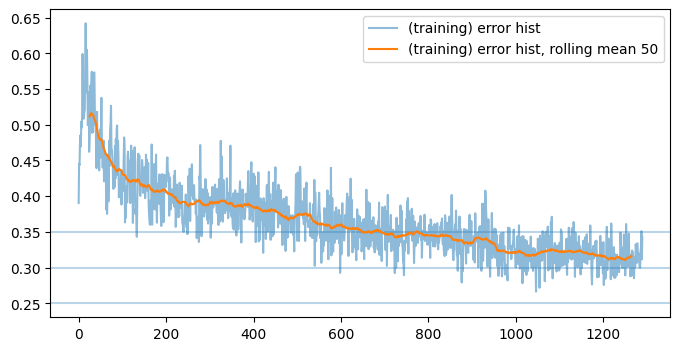

batches:  1291
batches:  1292
batches:  1293
batches:  1294
batches:  1295
batches:  1296
batches:  1297
batches:  1298
batches:  1299
batches:  1300


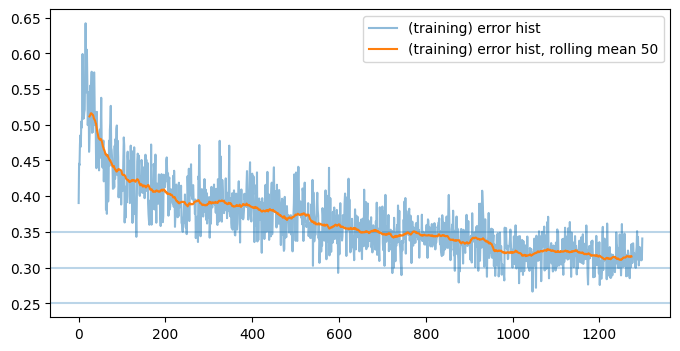

batches:  1301
batches:  1302
batches:  1303
batches:  1304
batches:  1305
batches:  1306
batches:  1307
batches:  1308
batches:  1309
batches:  1310


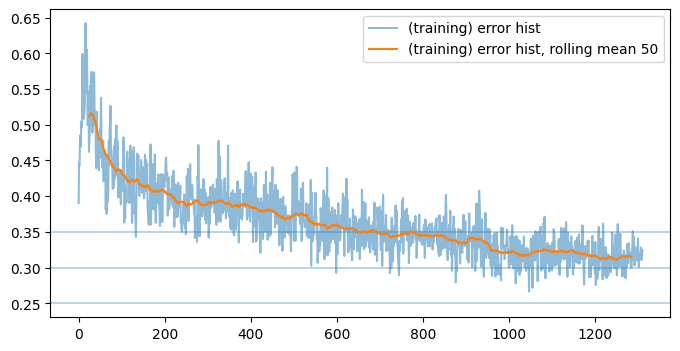

batches:  1311
batches:  1312
batches:  1313
batches:  1314
batches:  1315
batches:  1316
batches:  1317
batches:  1318
batches:  1319
batches:  1320


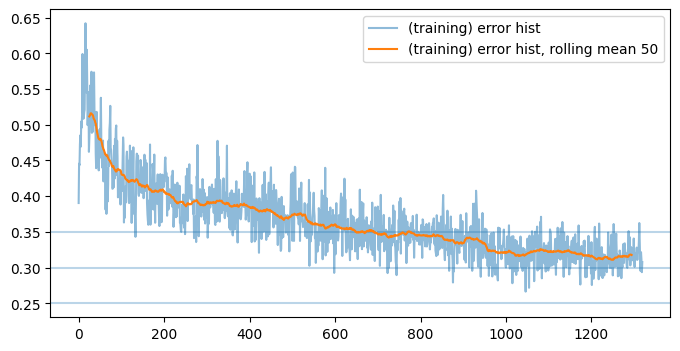

batches:  1321
batches:  1322
batches:  1323
batches:  1324
batches:  1325
batches:  1326
batches:  1327
batches:  1328
batches:  1329
batches:  1330


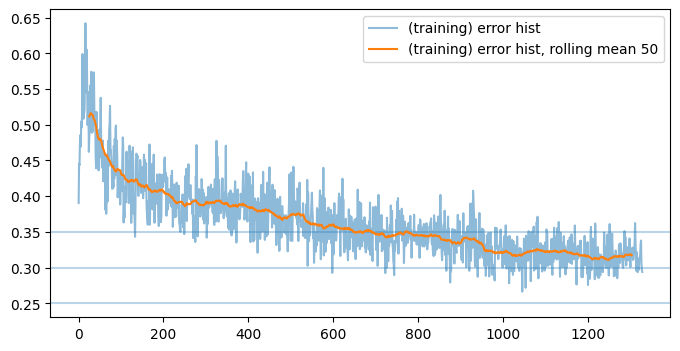

batches:  1331
batches:  1332
batches:  1333
batches:  1334
batches:  1335
batches:  1336
batches:  1337
batches:  1338
batches:  1339
batches:  1340


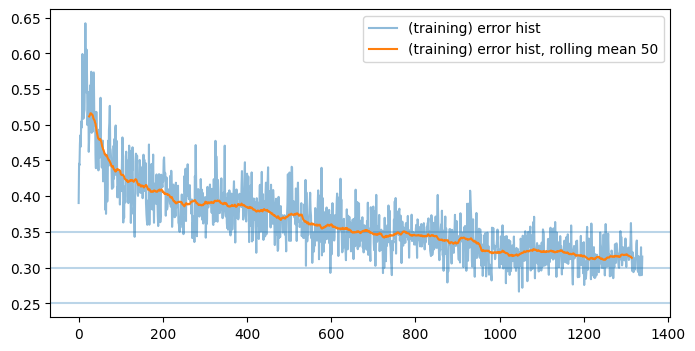

batches:  1341
batches:  1342
batches:  1343
batches:  1344
batches:  1345
batches:  1346
batches:  1347
batches:  1348
batches:  1349
batches:  1350


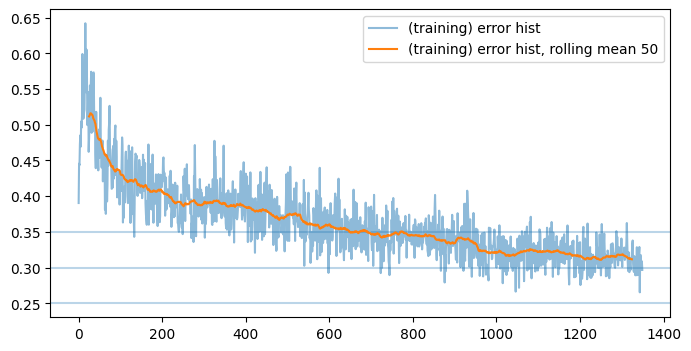

batches:  1351
batches:  1352
batches:  1353
batches:  1354
batches:  1355
batches:  1356
batches:  1357
batches:  1358
batches:  1359
batches:  1360


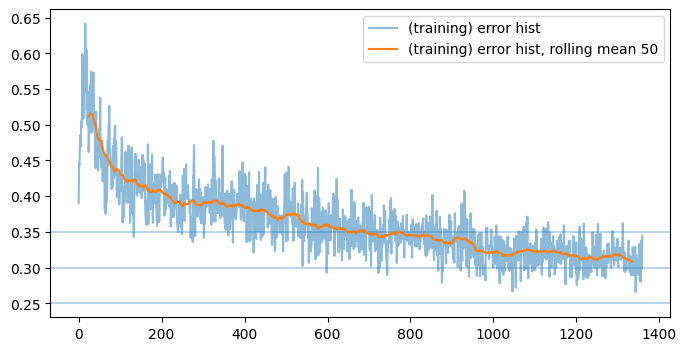

batches:  1361
batches:  1362
batches:  1363
batches:  1364
batches:  1365
batches:  1366
batches:  1367
batches:  1368
batches:  1369
batches:  1370


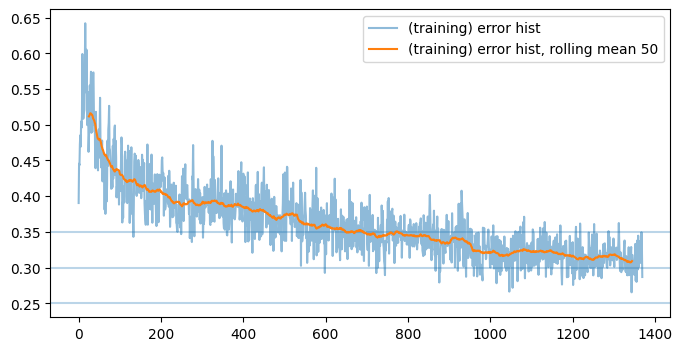

batches:  1371
batches:  1372
batches:  1373
batches:  1374
batches:  1375
batches:  1376
batches:  1377
batches:  1378
batches:  1379
batches:  1380


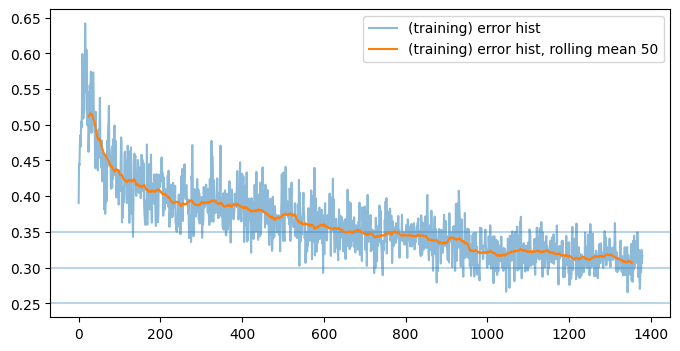

batches:  1381
batches:  1382
batches:  1383
batches:  1384
batches:  1385
batches:  1386
batches:  1387
batches:  1388
batches:  1389
batches:  1390


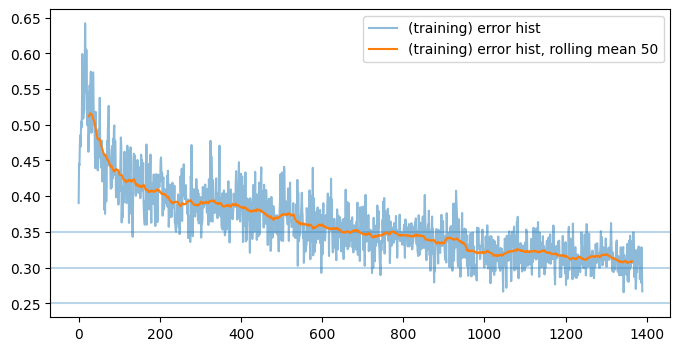

batches:  1391
batches:  1392
batches:  1393
batches:  1394
batches:  1395
batches:  1396
batches:  1397
batches:  1398
batches:  1399
batches:  1400


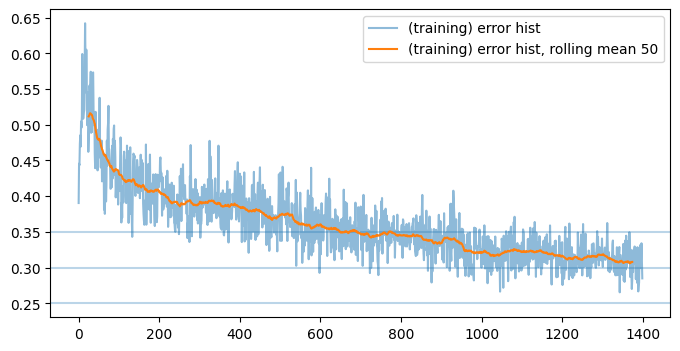

batches:  1401
batches:  1402
batches:  1403
batches:  1404
batches:  1405
batches:  1406
batches:  1407
batches:  1408
batches:  1409
batches:  1410


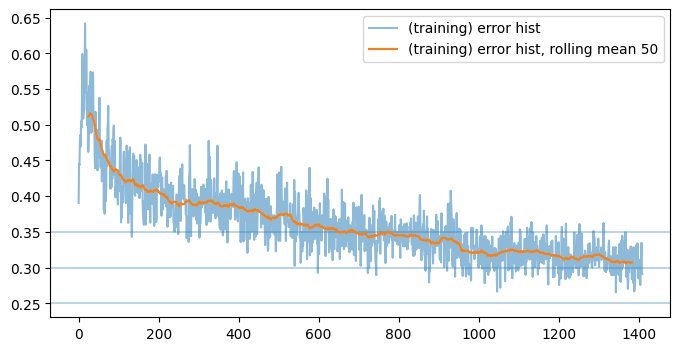

batches:  1411
batches:  1412
batches:  1413
batches:  1414
batches:  1415
batches:  1416
batches:  1417
batches:  1418
batches:  1419
batches:  1420


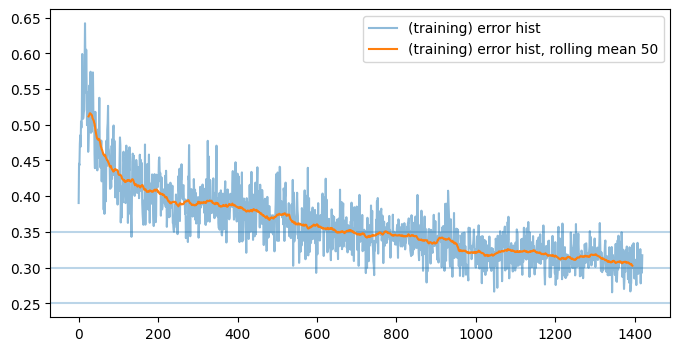

batches:  1421
batches:  1422
batches:  1423
batches:  1424
batches:  1425
batches:  1426
batches:  1427
batches:  1428
batches:  1429
batches:  1430


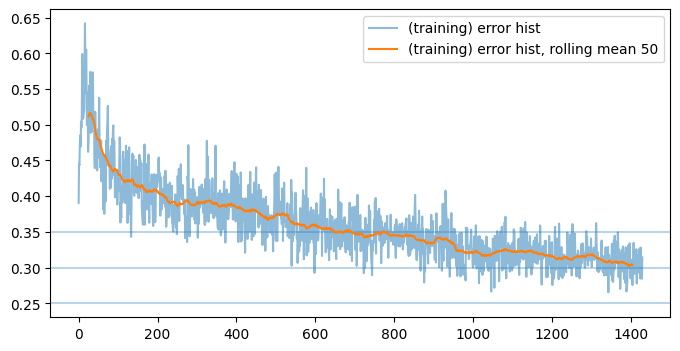

batches:  1431
batches:  1432
batches:  1433
batches:  1434
batches:  1435
batches:  1436
batches:  1437
batches:  1438
batches:  1439
batches:  1440


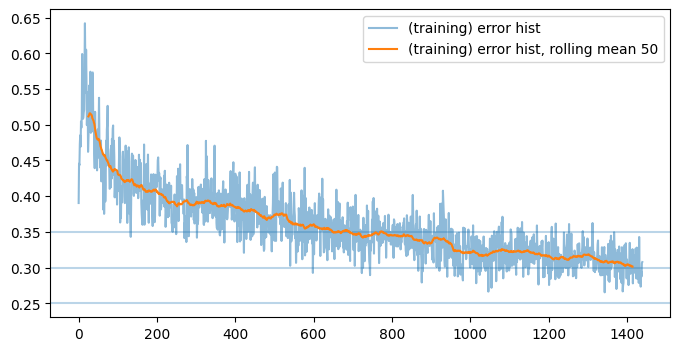

batches:  1441
batches:  1442
batches:  1443
batches:  1444
batches:  1445
batches:  1446
batches:  1447
batches:  1448
batches:  1449
batches:  1450


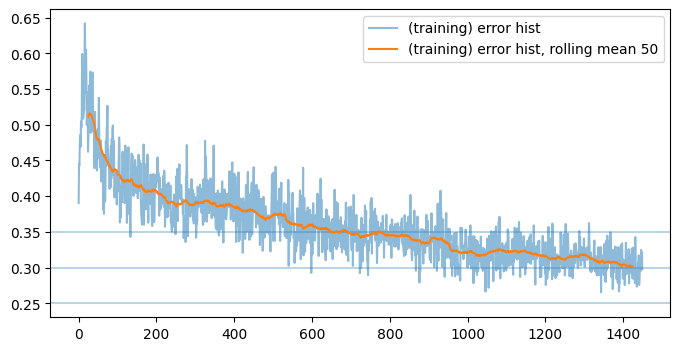

batches:  1451
batches:  1452
batches:  1453
batches:  1454
batches:  1455
batches:  1456
batches:  1457
batches:  1458
batches:  1459
batches:  1460


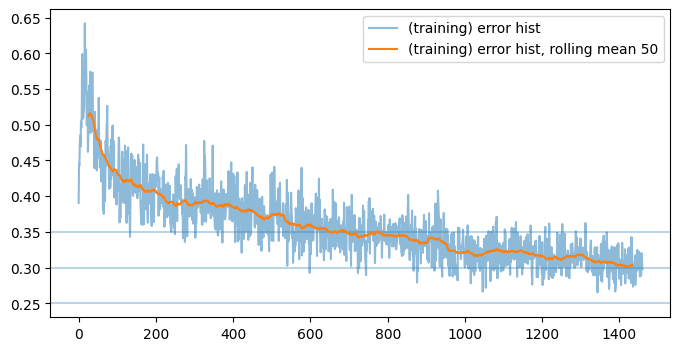

batches:  1461
batches:  1462
batches:  1463
batches:  1464
batches:  1465
batches:  1466
batches:  1467
batches:  1468
batches:  1469
batches:  1470


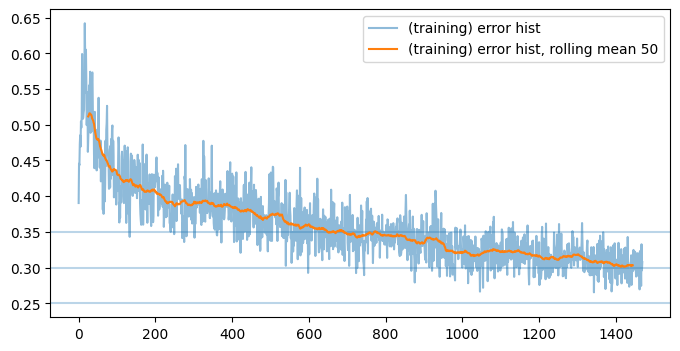

batches:  1471
batches:  1472
batches:  1473
batches:  1474
batches:  1475
batches:  1476
batches:  1477
batches:  1478
batches:  1479
batches:  1480


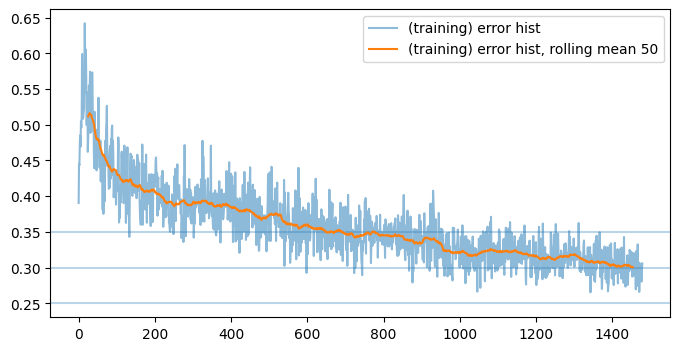

batches:  1481
batches:  1482
batches:  1483
batches:  1484
batches:  1485
batches:  1486
batches:  1487
batches:  1488
batches:  1489
batches:  1490


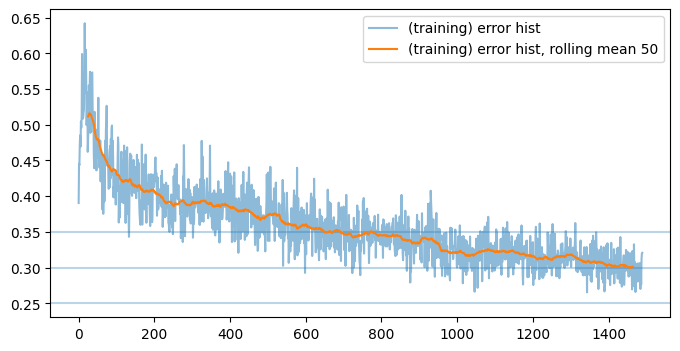

batches:  1491
batches:  1492
batches:  1493
batches:  1494
batches:  1495
batches:  1496
batches:  1497
batches:  1498
batches:  1499
batches:  1500


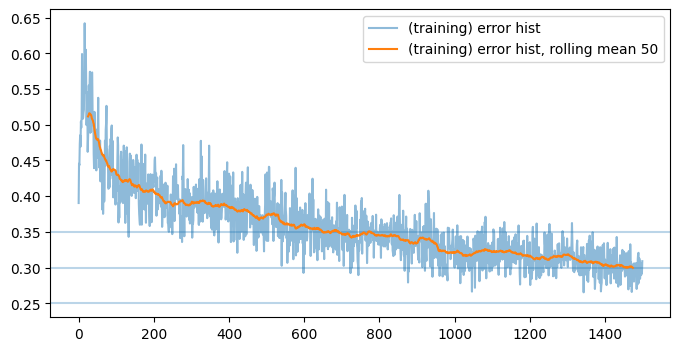

batches:  1501
batches:  1502
batches:  1503
batches:  1504
batches:  1505
batches:  1506
batches:  1507
batches:  1508
batches:  1509
batches:  1510


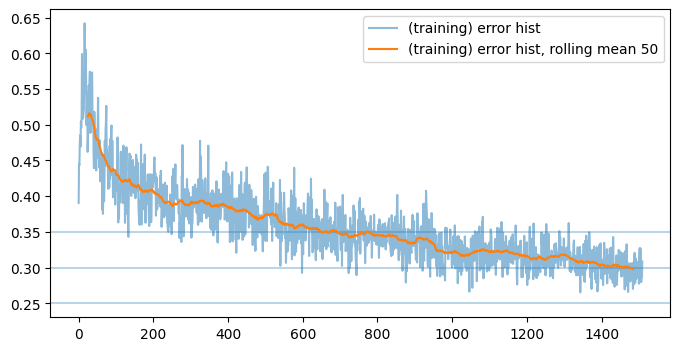

batches:  1511
batches:  1512
batches:  1513
batches:  1514
batches:  1515
batches:  1516
batches:  1517
batches:  1518
batches:  1519
batches:  1520


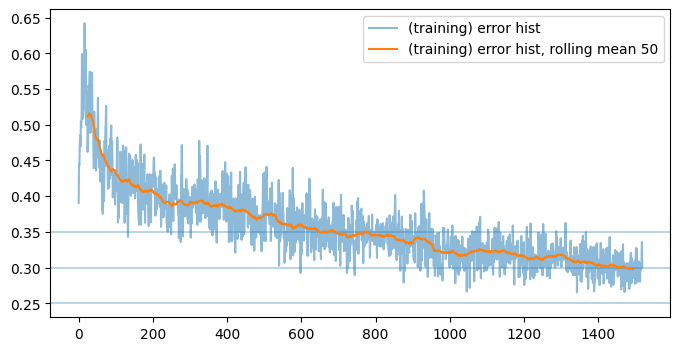

batches:  1521
batches:  1522
batches:  1523
batches:  1524
batches:  1525
batches:  1526
batches:  1527
batches:  1528
batches:  1529
batches:  1530


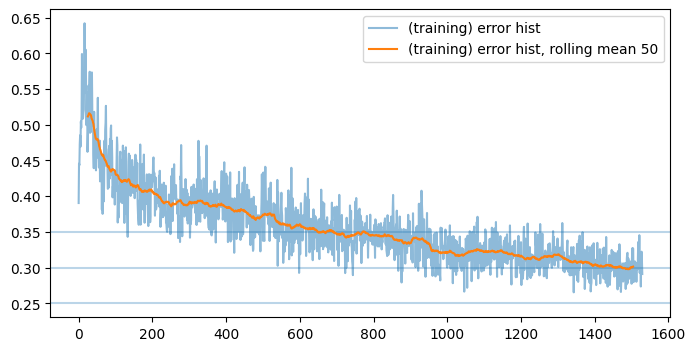

batches:  1531
batches:  1532
batches:  1533
batches:  1534
batches:  1535
batches:  1536
batches:  1537
batches:  1538
batches:  1539
batches:  1540


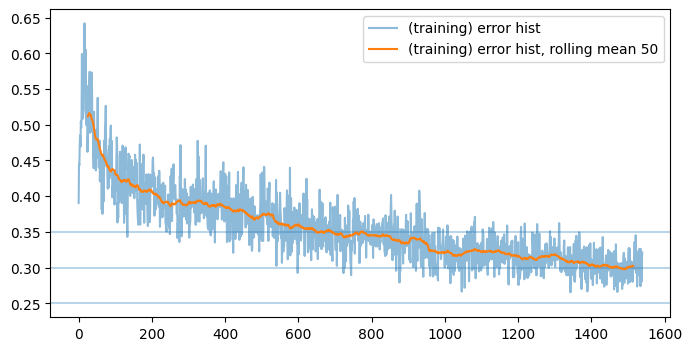

batches:  1541
batches:  1542
batches:  1543
batches:  1544
batches:  1545
batches:  1546
batches:  1547
batches:  1548
batches:  1549
batches:  1550


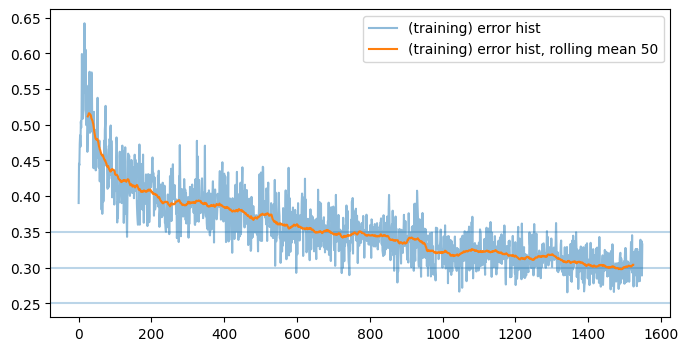

batches:  1551
batches:  1552
batches:  1553
batches:  1554
batches:  1555
batches:  1556
batches:  1557
batches:  1558
batches:  1559
batches:  1560


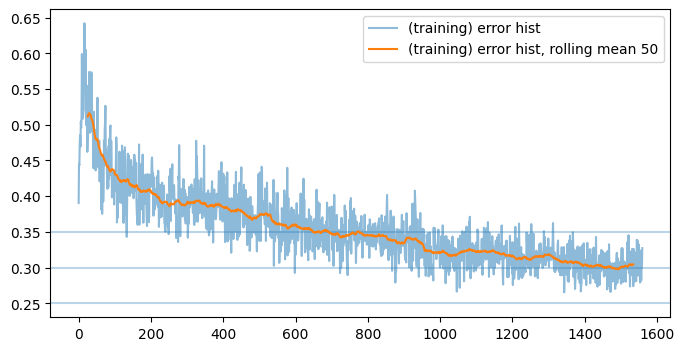

batches:  1561
batches:  1562
batches:  1563
batches:  1564
batches:  1565
batches:  1566
batches:  1567
batches:  1568
batches:  1569
batches:  1570


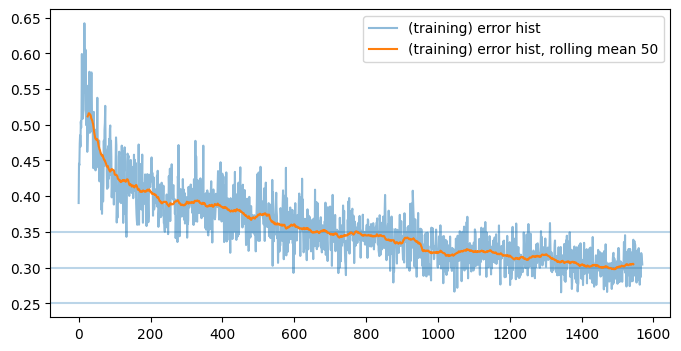

batches:  1571
batches:  1572
batches:  1573
batches:  1574
batches:  1575
batches:  1576
batches:  1577
batches:  1578
batches:  1579
batches:  1580


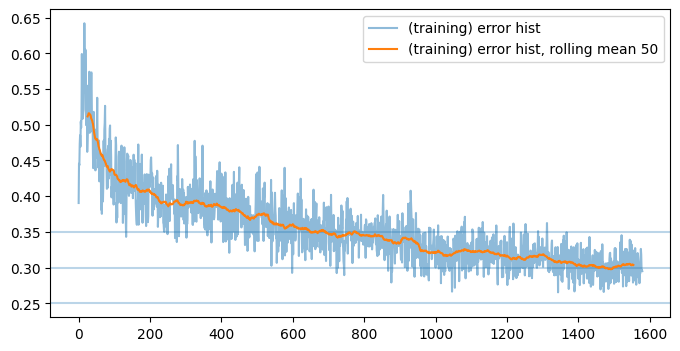

batches:  1581
batches:  1582
batches:  1583
batches:  1584
batches:  1585
batches:  1586
batches:  1587
batches:  1588
batches:  1589
batches:  1590


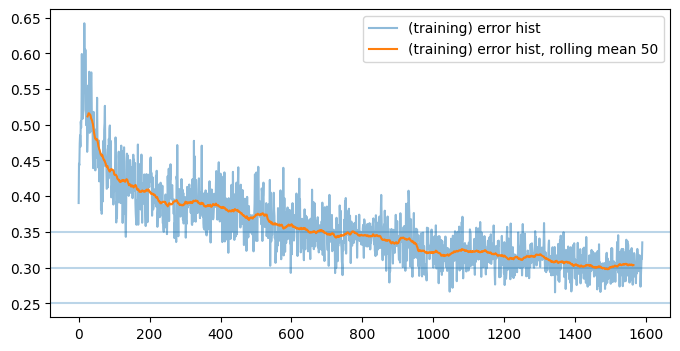

batches:  1591
batches:  1592
batches:  1593
batches:  1594
batches:  1595
batches:  1596
batches:  1597
batches:  1598
batches:  1599
batches:  1600


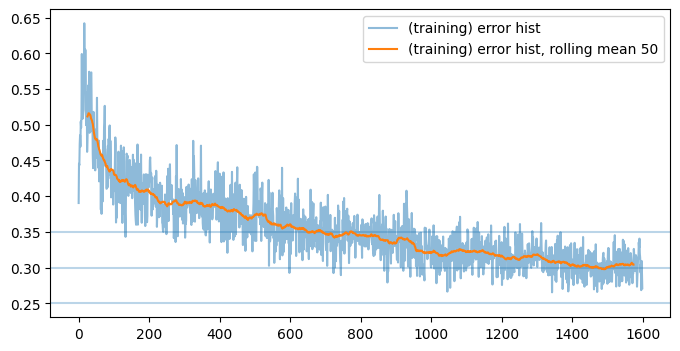

batches:  1601
batches:  1602
batches:  1603
batches:  1604
batches:  1605
batches:  1606
batches:  1607
batches:  1608
batches:  1609
batches:  1610


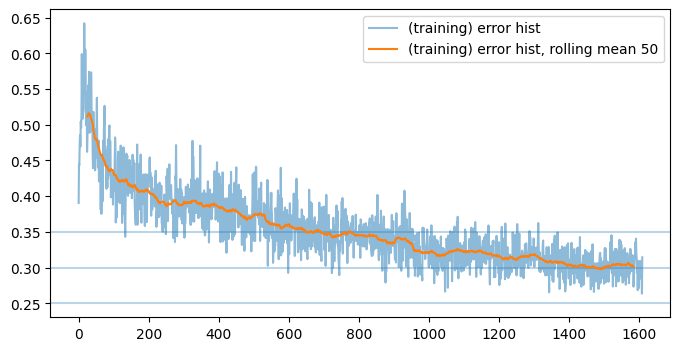

batches:  1611
batches:  1612
batches:  1613
batches:  1614
batches:  1615
batches:  1616
batches:  1617
batches:  1618
batches:  1619
batches:  1620


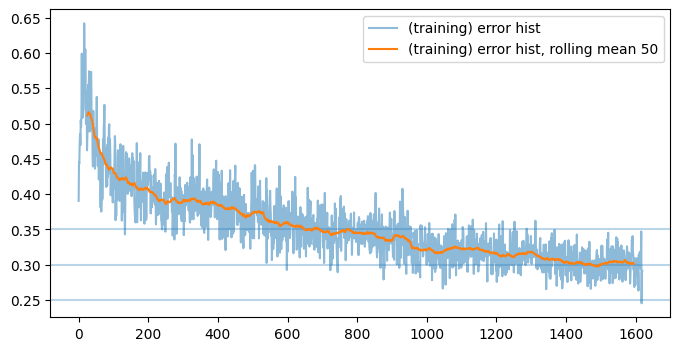

batches:  1621
batches:  1622
batches:  1623
batches:  1624
batches:  1625
batches:  1626
batches:  1627
batches:  1628
batches:  1629
batches:  1630


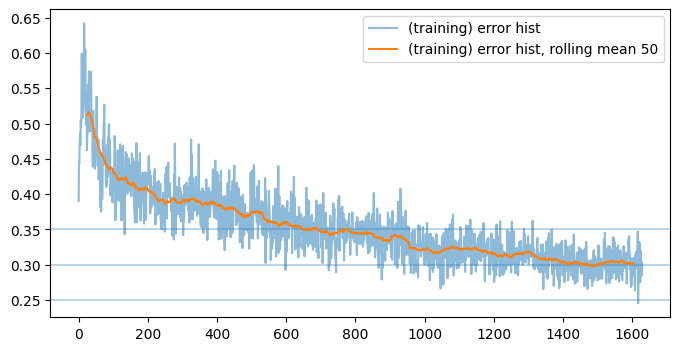

batches:  1631
batches:  1632
batches:  1633
batches:  1634
batches:  1635
batches:  1636
batches:  1637
batches:  1638
batches:  1639
batches:  1640


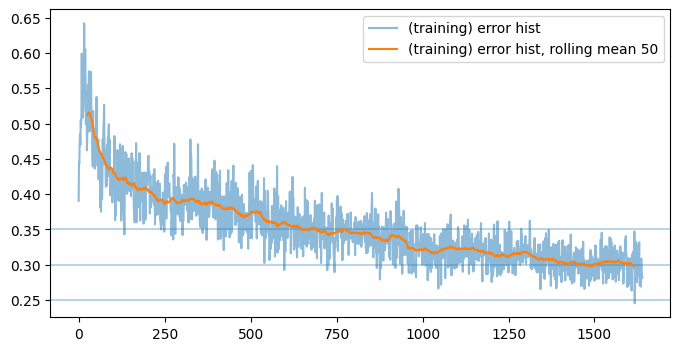

batches:  1641
batches:  1642
batches:  1643
batches:  1644
batches:  1645
batches:  1646
batches:  1647
batches:  1648
batches:  1649
batches:  1650


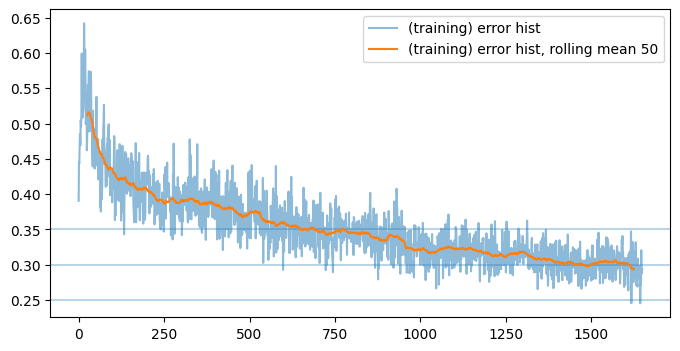

batches:  1651
batches:  1652
batches:  1653
batches:  1654
batches:  1655
batches:  1656
batches:  1657
batches:  1658
batches:  1659
batches:  1660


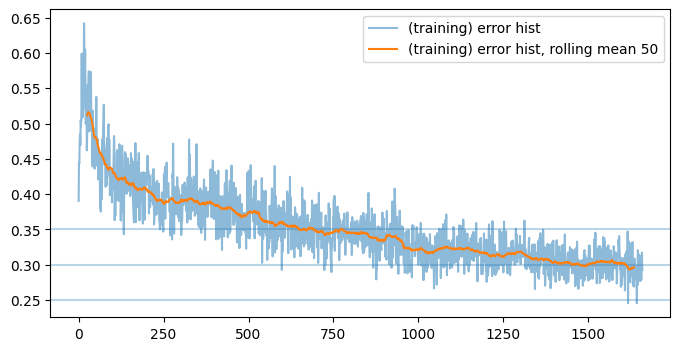

batches:  1661
batches:  1662
batches:  1663
batches:  1664
batches:  1665
batches:  1666
batches:  1667
batches:  1668
batches:  1669
batches:  1670


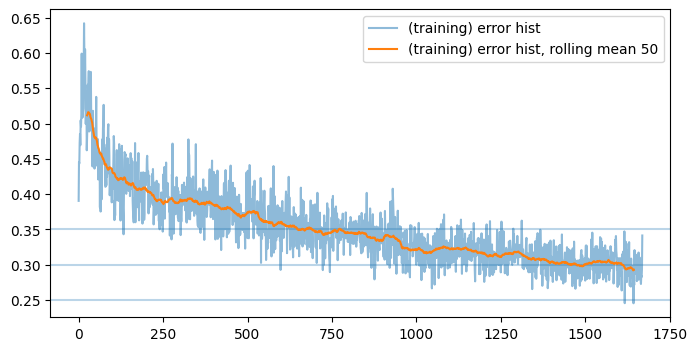

batches:  1671
batches:  1672
batches:  1673
batches:  1674
batches:  1675
batches:  1676
batches:  1677
batches:  1678
batches:  1679
batches:  1680


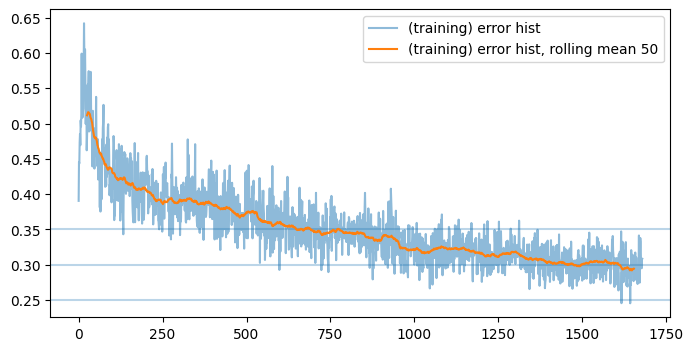

batches:  1681
batches:  1682
batches:  1683
batches:  1684
batches:  1685
batches:  1686
batches:  1687
batches:  1688
batches:  1689
batches:  1690


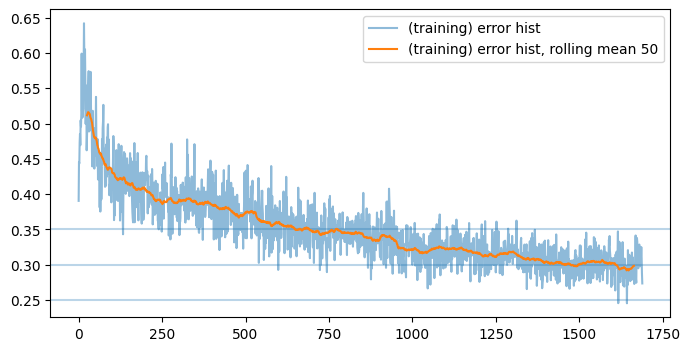

batches:  1691
batches:  1692
batches:  1693
batches:  1694
batches:  1695
batches:  1696
batches:  1697
batches:  1698
batches:  1699
batches:  1700


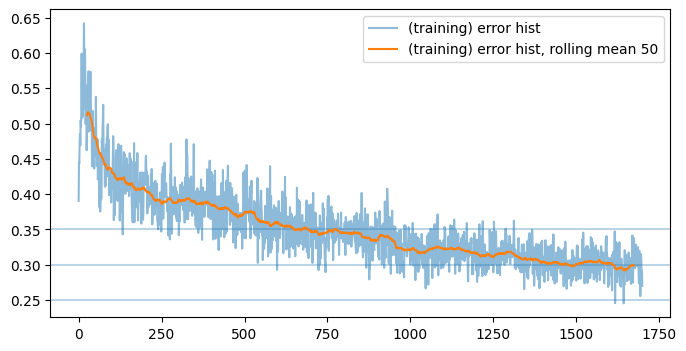

batches:  1701
batches:  1702
batches:  1703
batches:  1704
batches:  1705
batches:  1706
batches:  1707
batches:  1708
batches:  1709
batches:  1710


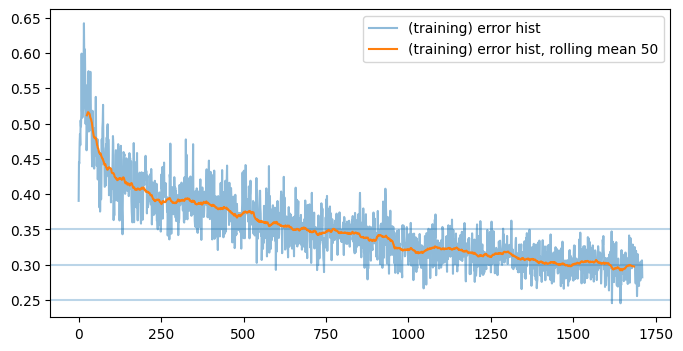

batches:  1711
batches:  1712
batches:  1713
batches:  1714
batches:  1715
batches:  1716
batches:  1717
batches:  1718
batches:  1719
batches:  1720


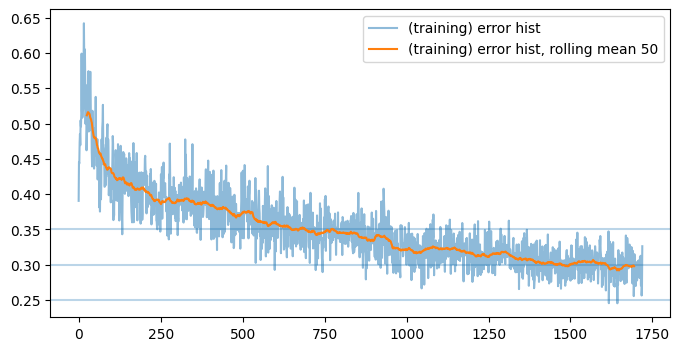

batches:  1721
batches:  1722
batches:  1723
batches:  1724
batches:  1725
batches:  1726
batches:  1727
batches:  1728
batches:  1729
batches:  1730


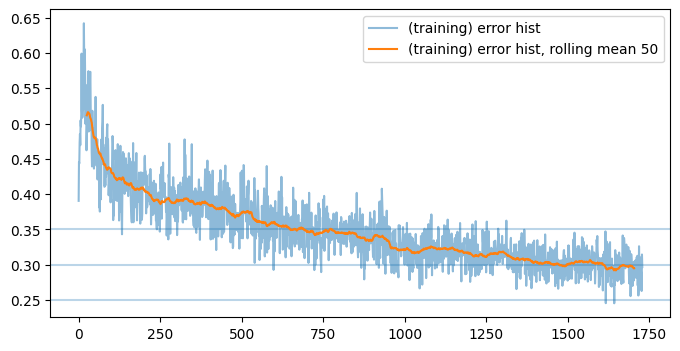

batches:  1731
batches:  1732
batches:  1733
batches:  1734
batches:  1735
batches:  1736
batches:  1737
batches:  1738
batches:  1739
batches:  1740


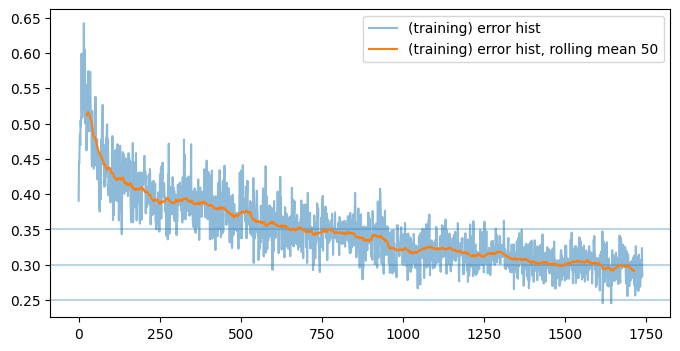

batches:  1741
batches:  1742
batches:  1743
batches:  1744
batches:  1745
batches:  1746
batches:  1747
batches:  1748
batches:  1749
batches:  1750


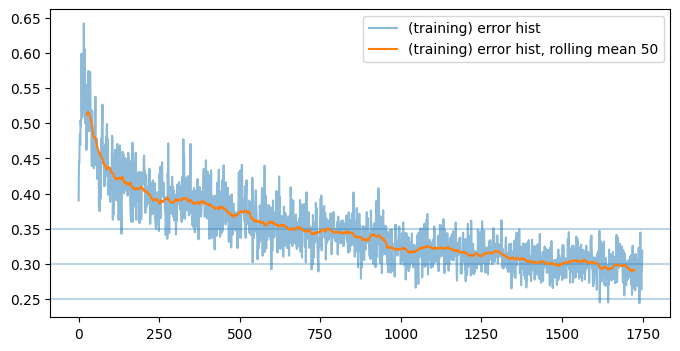

batches:  1751
batches:  1752
batches:  1753
batches:  1754
batches:  1755
batches:  1756
batches:  1757
batches:  1758
batches:  1759
batches:  1760


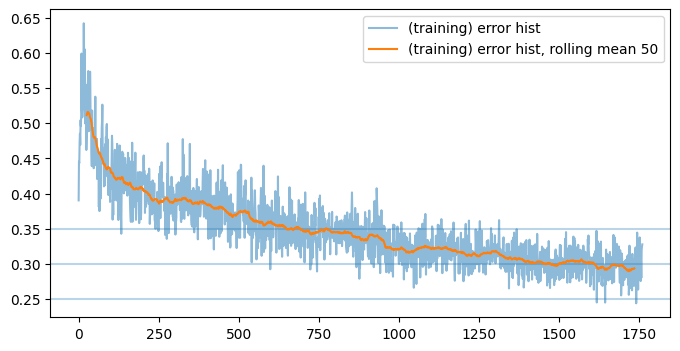

batches:  1761
batches:  1762
batches:  1763
batches:  1764
batches:  1765
batches:  1766
batches:  1767
batches:  1768
batches:  1769
batches:  1770


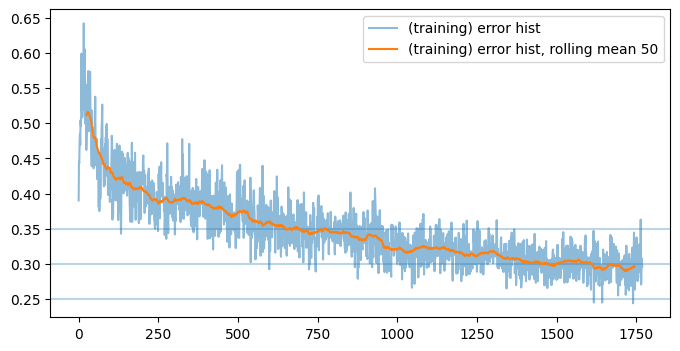

batches:  1771
batches:  1772
batches:  1773
batches:  1774
batches:  1775
batches:  1776
batches:  1777
batches:  1778
batches:  1779
batches:  1780


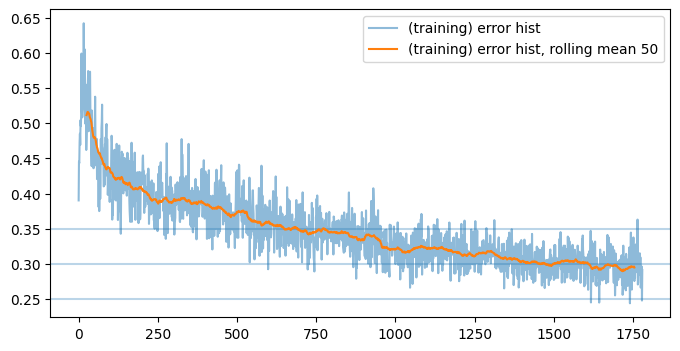

batches:  1781
batches:  1782
batches:  1783
batches:  1784
batches:  1785
batches:  1786
batches:  1787
batches:  1788
batches:  1789
batches:  1790


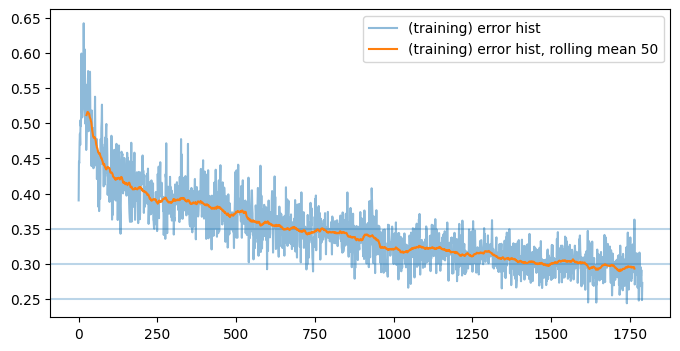

batches:  1791
batches:  1792
batches:  1793
batches:  1794
batches:  1795
batches:  1796
batches:  1797
batches:  1798
batches:  1799
batches:  1800


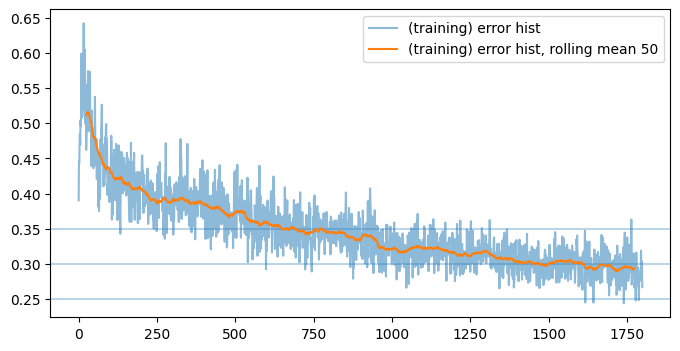

batches:  1801
batches:  1802
batches:  1803
batches:  1804
batches:  1805
batches:  1806
batches:  1807
batches:  1808
batches:  1809
batches:  1810


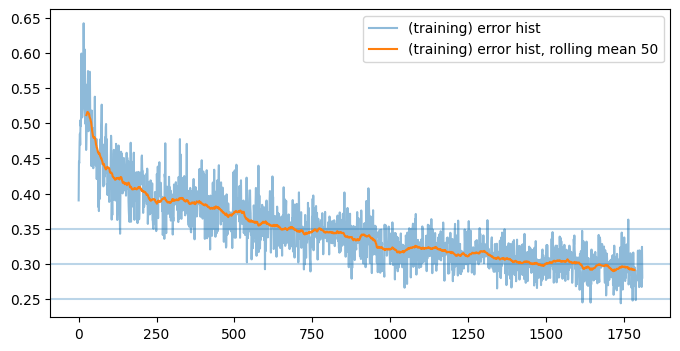

batches:  1811
batches:  1812
batches:  1813
batches:  1814
batches:  1815
batches:  1816
batches:  1817
batches:  1818
batches:  1819
batches:  1820


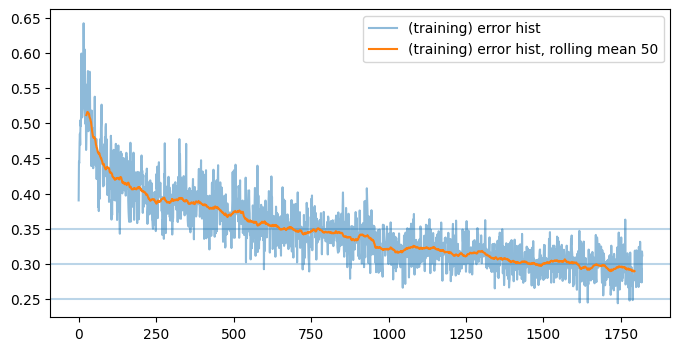

batches:  1821
batches:  1822
batches:  1823
batches:  1824
batches:  1825
batches:  1826
batches:  1827
batches:  1828
batches:  1829
batches:  1830


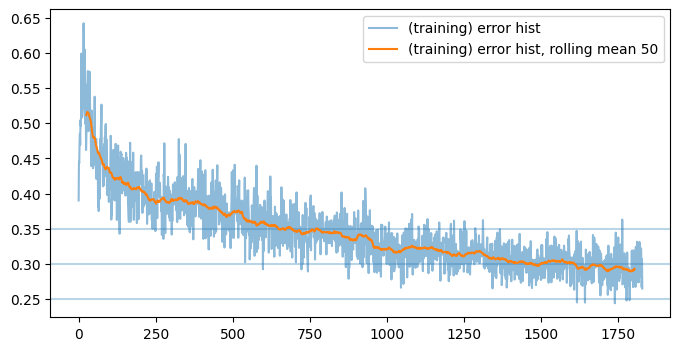

batches:  1831
batches:  1832
batches:  1833
batches:  1834
batches:  1835
batches:  1836
batches:  1837
batches:  1838
batches:  1839
batches:  1840


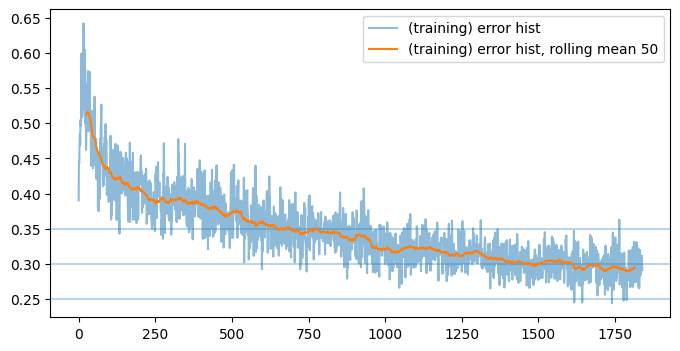

batches:  1841
batches:  1842
batches:  1843
batches:  1844
batches:  1845
batches:  1846
batches:  1847
batches:  1848
batches:  1849
batches:  1850


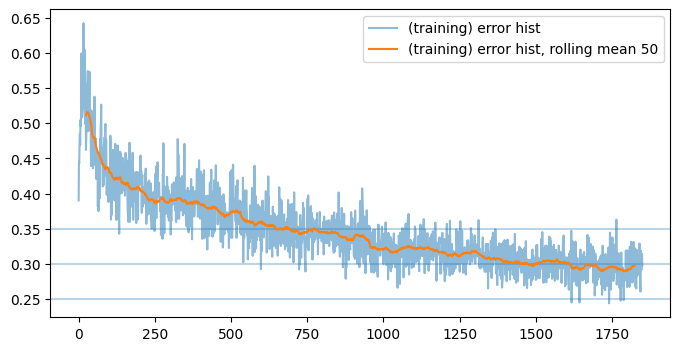

batches:  1851
batches:  1852
batches:  1853
batches:  1854
batches:  1855
batches:  1856
batches:  1857
batches:  1858
batches:  1859
batches:  1860


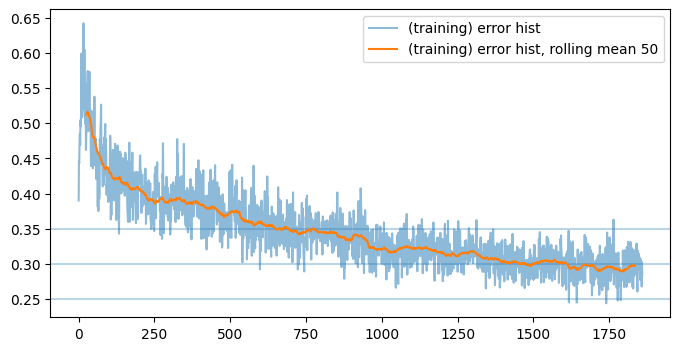

batches:  1861
batches:  1862
batches:  1863
batches:  1864
batches:  1865
batches:  1866
batches:  1867
batches:  1868
batches:  1869
batches:  1870


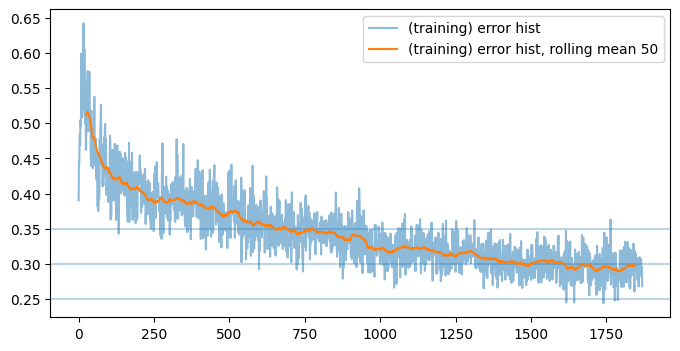

batches:  1871
batches:  1872
batches:  1873
batches:  1874
batches:  1875
batches:  1876
batches:  1877
batches:  1878
batches:  1879
batches:  1880


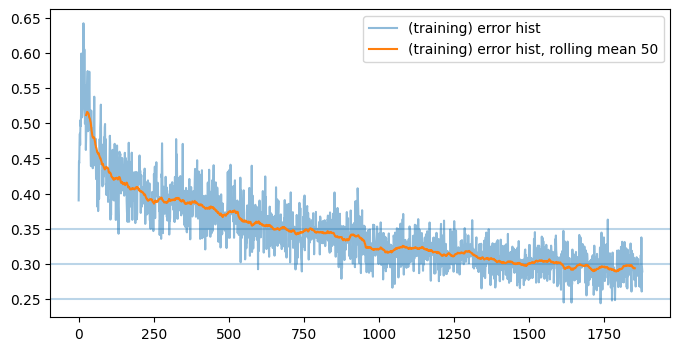

batches:  1881
batches:  1882
batches:  1883
batches:  1884
batches:  1885
batches:  1886
batches:  1887
batches:  1888
batches:  1889
batches:  1890


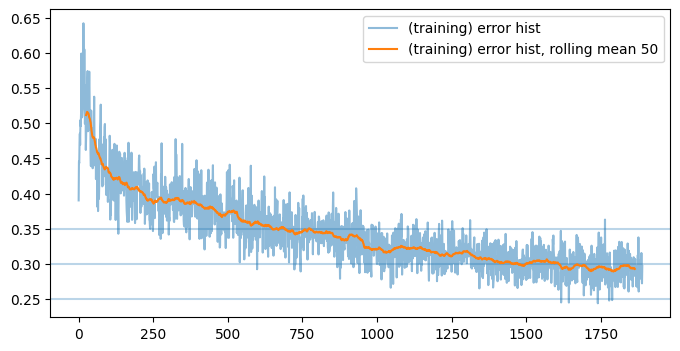

batches:  1891
batches:  1892
batches:  1893
batches:  1894
batches:  1895
batches:  1896
batches:  1897
batches:  1898
batches:  1899
batches:  1900


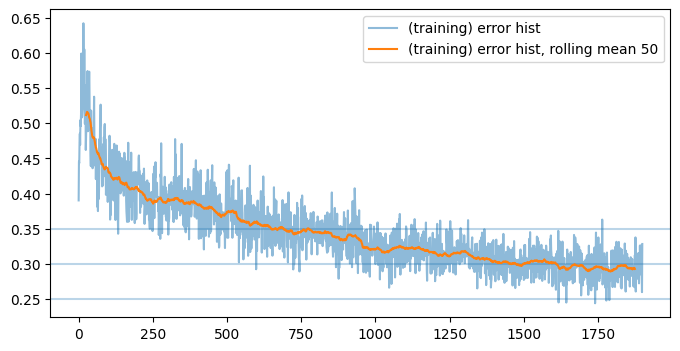

batches:  1901
batches:  1902
batches:  1903
batches:  1904
batches:  1905
batches:  1906
batches:  1907
batches:  1908
batches:  1909
batches:  1910


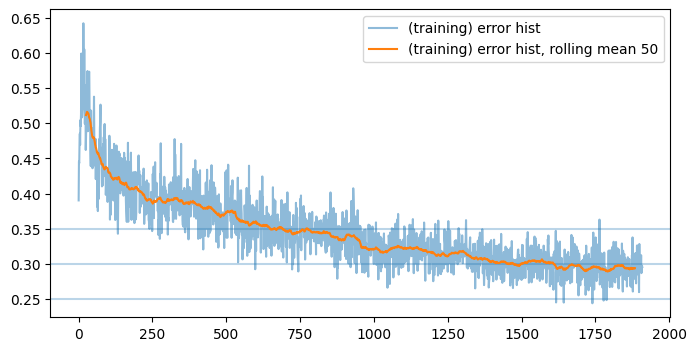

batches:  1911
batches:  1912
batches:  1913
batches:  1914
batches:  1915
batches:  1916
batches:  1917
batches:  1918
batches:  1919
batches:  1920


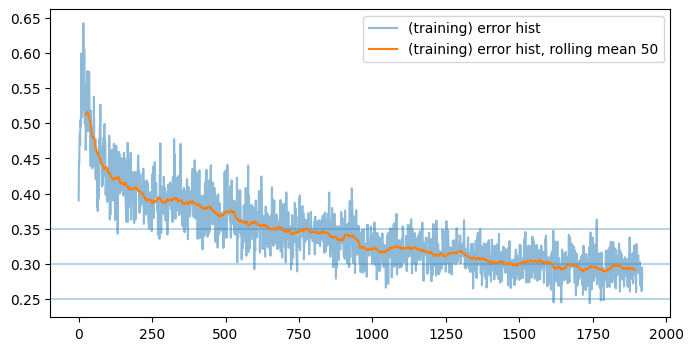

batches:  1921
batches:  1922
batches:  1923
batches:  1924
batches:  1925
batches:  1926
batches:  1927
batches:  1928
batches:  1929
batches:  1930


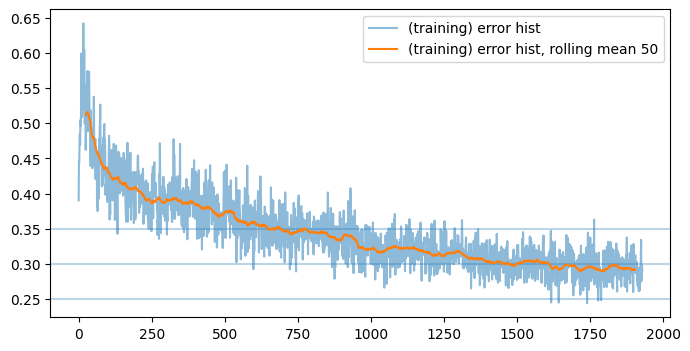

batches:  1931
batches:  1932
batches:  1933
batches:  1934
batches:  1935
batches:  1936
batches:  1937
batches:  1938
batches:  1939
batches:  1940


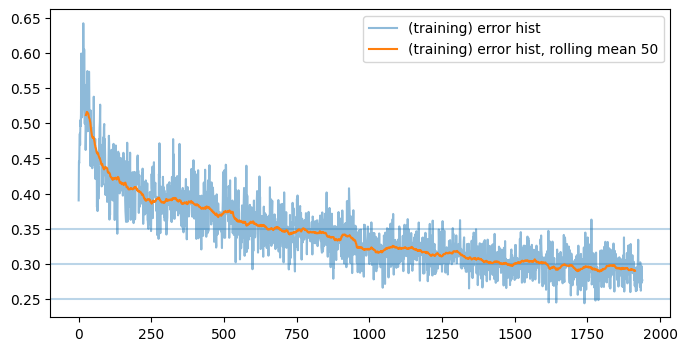

batches:  1941
batches:  1942
batches:  1943
batches:  1944
batches:  1945
batches:  1946
batches:  1947
batches:  1948
batches:  1949
batches:  1950


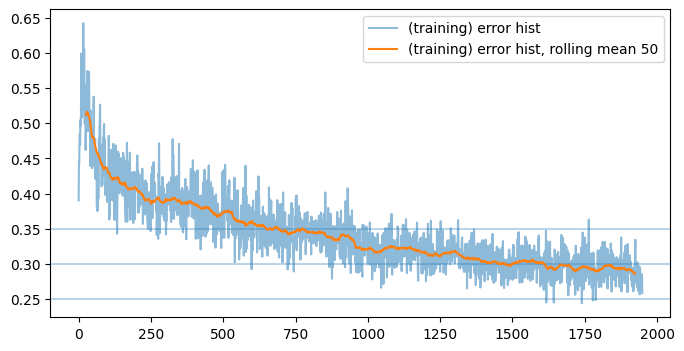

batches:  1951
batches:  1952
batches:  1953
batches:  1954
batches:  1955
batches:  1956
batches:  1957
batches:  1958
batches:  1959
batches:  1960


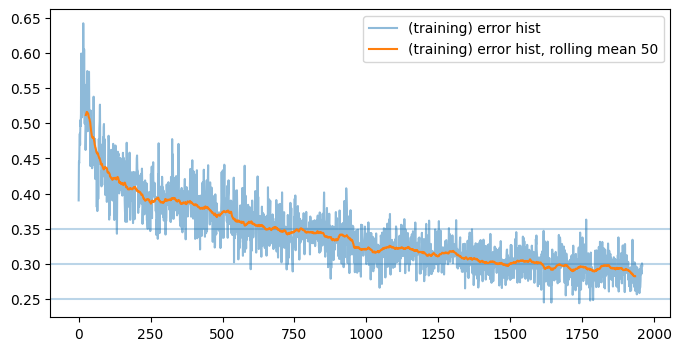

batches:  1961
batches:  1962
batches:  1963
batches:  1964
batches:  1965
batches:  1966
batches:  1967
batches:  1968
batches:  1969
batches:  1970


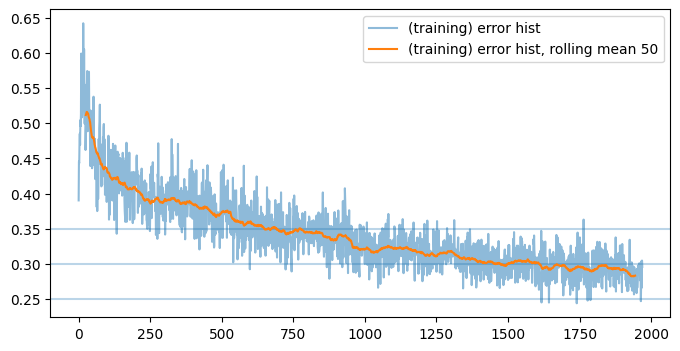

batches:  1971
batches:  1972
batches:  1973
batches:  1974
batches:  1975
batches:  1976
batches:  1977
batches:  1978
batches:  1979
batches:  1980


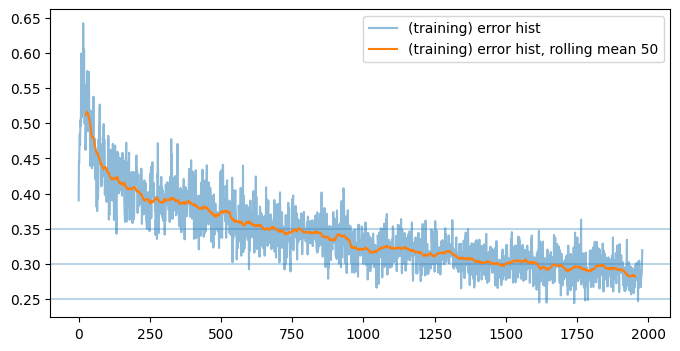

batches:  1981
batches:  1982
batches:  1983
batches:  1984
batches:  1985
batches:  1986
batches:  1987
batches:  1988
batches:  1989
batches:  1990


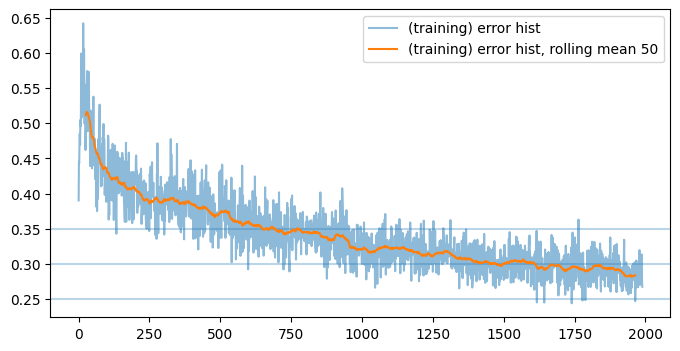

batches:  1991
batches:  1992
batches:  1993
batches:  1994
batches:  1995
batches:  1996
batches:  1997
batches:  1998
batches:  1999
batches:  2000


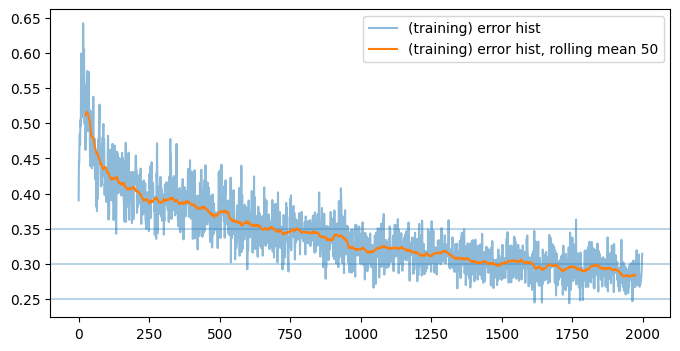

batches:  2001
batches:  2002
batches:  2003
batches:  2004
batches:  2005
batches:  2006
batches:  2007
batches:  2008
batches:  2009
batches:  2010


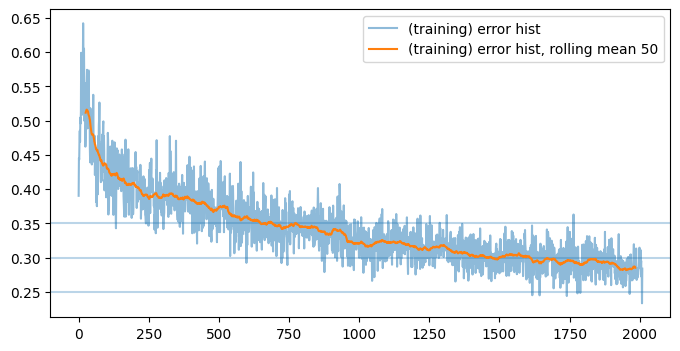

batches:  2011
batches:  2012
batches:  2013
batches:  2014
batches:  2015
batches:  2016
batches:  2017
batches:  2018
batches:  2019
batches:  2020


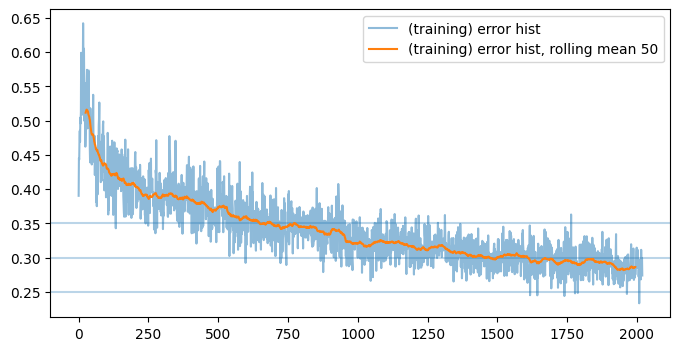

batches:  2021
batches:  2022
batches:  2023
batches:  2024
batches:  2025
batches:  2026
batches:  2027
batches:  2028
batches:  2029
batches:  2030


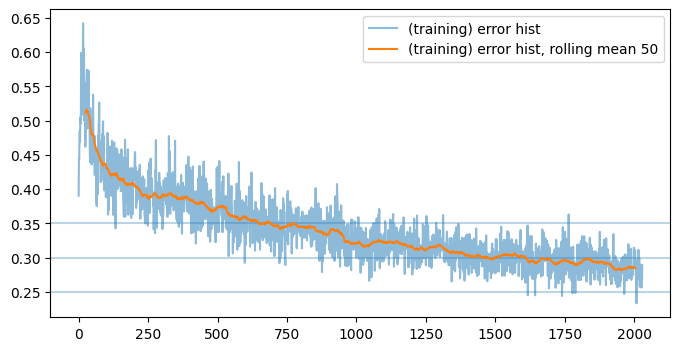

batches:  2031
batches:  2032
batches:  2033
batches:  2034
batches:  2035
batches:  2036
batches:  2037
batches:  2038
batches:  2039
batches:  2040


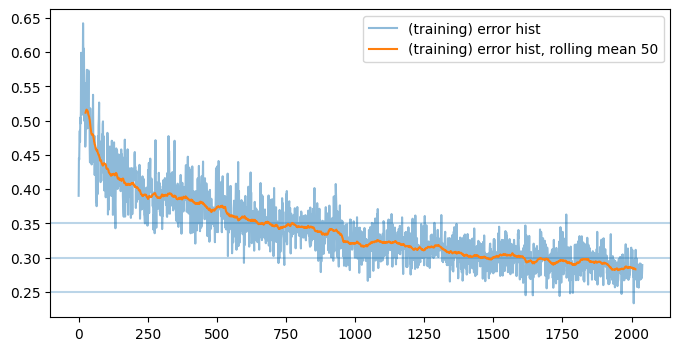

batches:  2041
batches:  2042
batches:  2043
batches:  2044
batches:  2045
batches:  2046
batches:  2047
batches:  2048
batches:  2049
batches:  2050


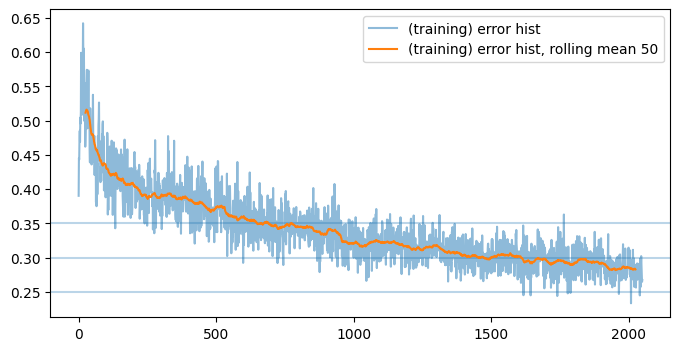

batches:  2051
batches:  2052
batches:  2053
batches:  2054
batches:  2055
batches:  2056
batches:  2057
batches:  2058
batches:  2059
batches:  2060


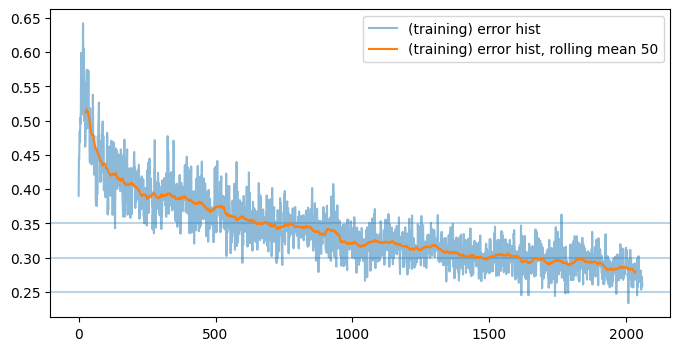

batches:  2061
batches:  2062
batches:  2063
batches:  2064
batches:  2065
batches:  2066
batches:  2067
batches:  2068
batches:  2069
batches:  2070


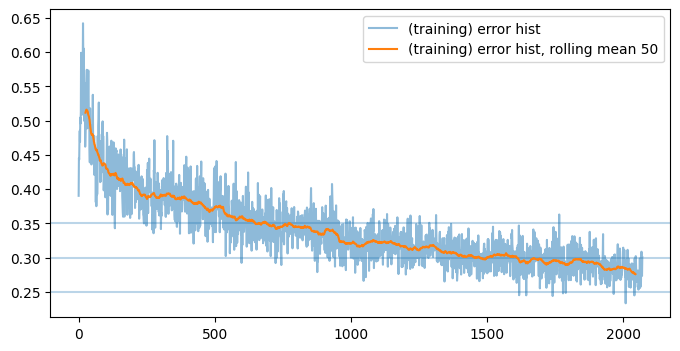

batches:  2071
batches:  2072
batches:  2073
batches:  2074
batches:  2075
batches:  2076
batches:  2077
batches:  2078
batches:  2079
batches:  2080


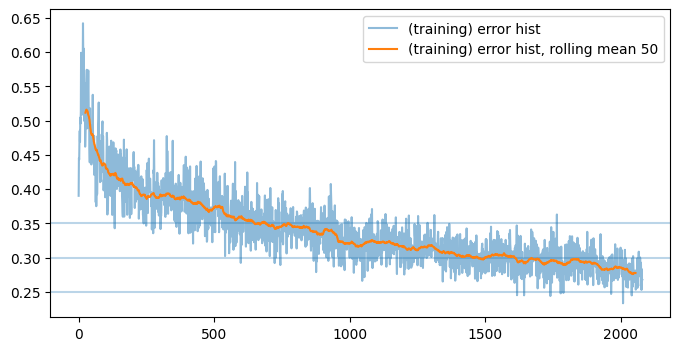

batches:  2081
batches:  2082
batches:  2083
batches:  2084
batches:  2085
batches:  2086
batches:  2087
batches:  2088
batches:  2089
batches:  2090


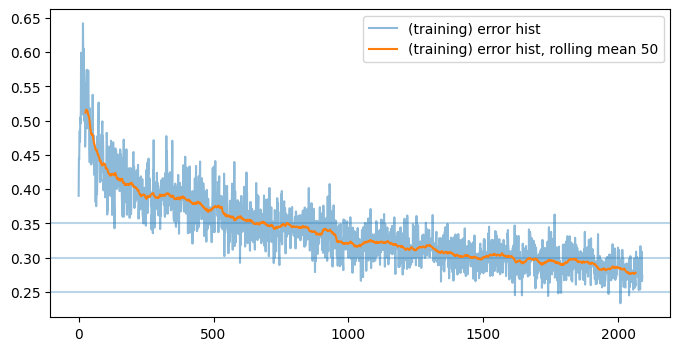

batches:  2091
batches:  2092
batches:  2093
batches:  2094
batches:  2095
batches:  2096
batches:  2097
batches:  2098
batches:  2099
batches:  2100


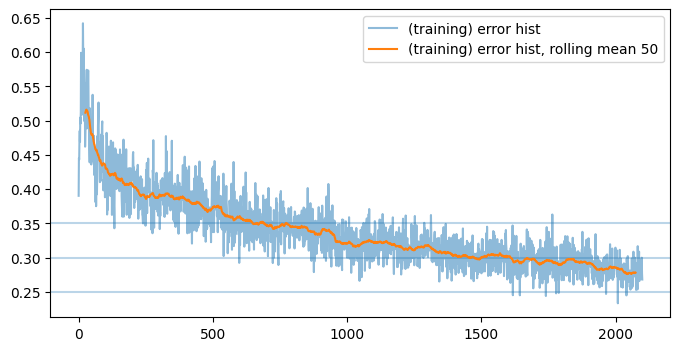

batches:  2101
batches:  2102
batches:  2103
batches:  2104
batches:  2105
batches:  2106
batches:  2107
batches:  2108
batches:  2109
batches:  2110


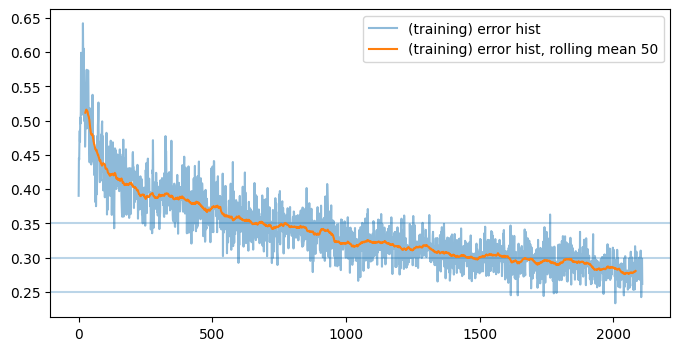

batches:  2111
batches:  2112
batches:  2113
batches:  2114
batches:  2115
batches:  2116
batches:  2117
batches:  2118
batches:  2119
batches:  2120


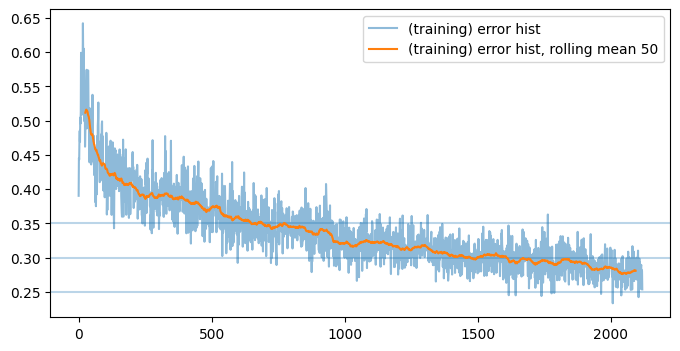

batches:  2121
batches:  2122
batches:  2123
batches:  2124
batches:  2125
batches:  2126
batches:  2127
batches:  2128
batches:  2129
batches:  2130


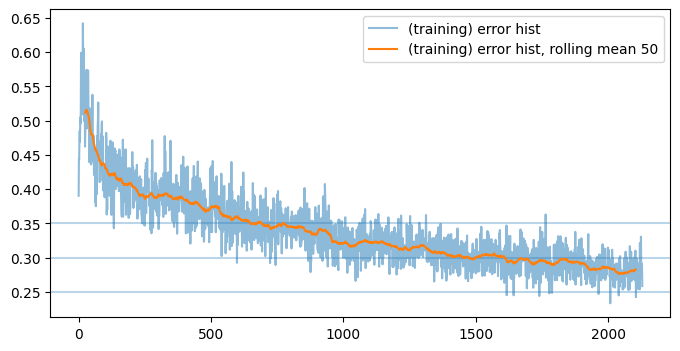

batches:  2131
batches:  2132
batches:  2133
batches:  2134
batches:  2135
batches:  2136
batches:  2137
batches:  2138
batches:  2139
batches:  2140


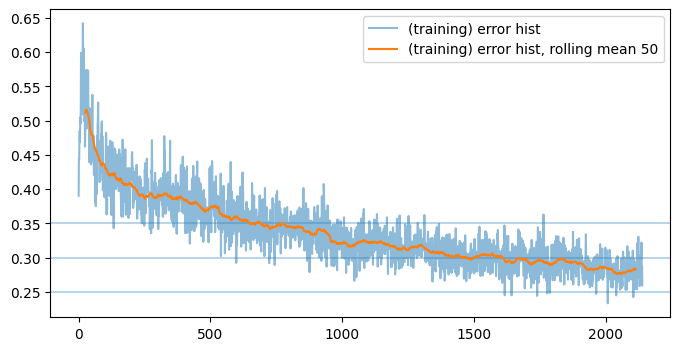

batches:  2141
batches:  2142
batches:  2143
batches:  2144
batches:  2145
batches:  2146
batches:  2147
batches:  2148
batches:  2149
batches:  2150


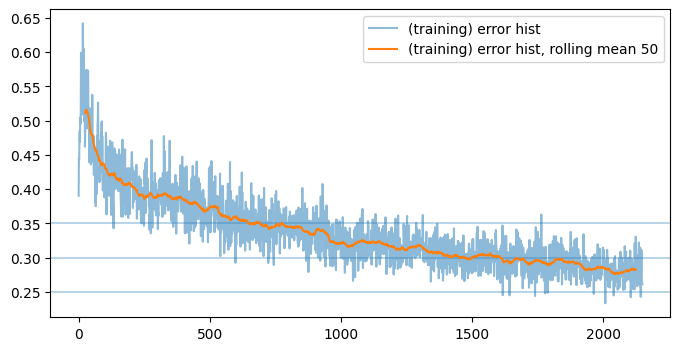

batches:  2151
batches:  2152
batches:  2153
batches:  2154
batches:  2155
batches:  2156
batches:  2157
batches:  2158
batches:  2159
batches:  2160


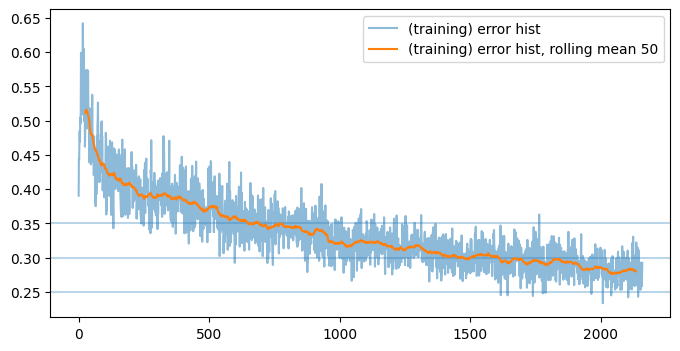

batches:  2161
batches:  2162
batches:  2163
batches:  2164
batches:  2165
batches:  2166
batches:  2167
batches:  2168
batches:  2169
batches:  2170


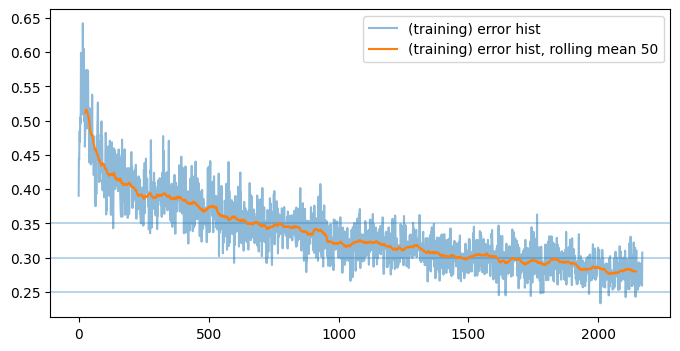

batches:  2171
batches:  2172
batches:  2173
batches:  2174
batches:  2175
batches:  2176
batches:  2177
batches:  2178
batches:  2179
batches:  2180


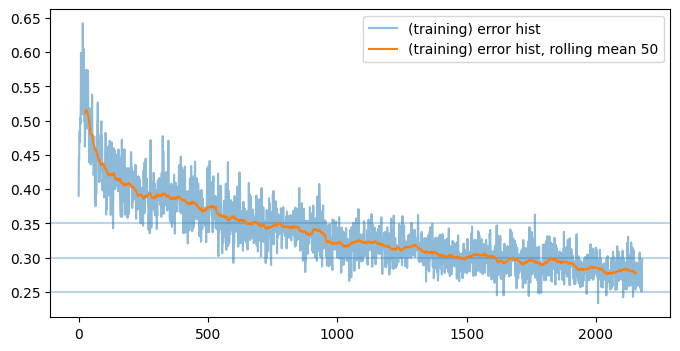

batches:  2181
batches:  2182
batches:  2183
batches:  2184
batches:  2185
batches:  2186
batches:  2187
batches:  2188
batches:  2189
batches:  2190


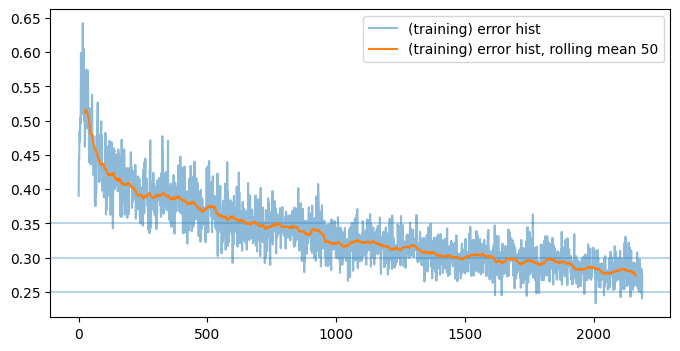

batches:  2191
batches:  2192
batches:  2193
batches:  2194
batches:  2195
batches:  2196
batches:  2197
batches:  2198
batches:  2199
batches:  2200


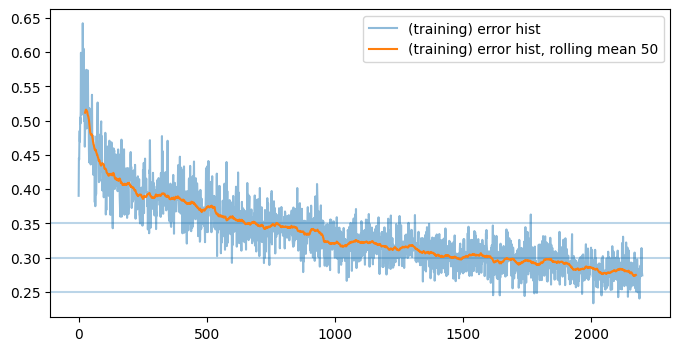

batches:  2201
batches:  2202
batches:  2203
batches:  2204
batches:  2205
batches:  2206
batches:  2207
batches:  2208
batches:  2209
batches:  2210


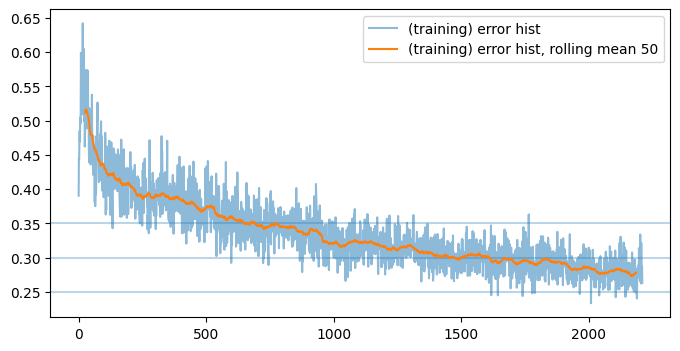

batches:  2211
batches:  2212
batches:  2213
batches:  2214
batches:  2215
batches:  2216
batches:  2217
batches:  2218
batches:  2219
batches:  2220


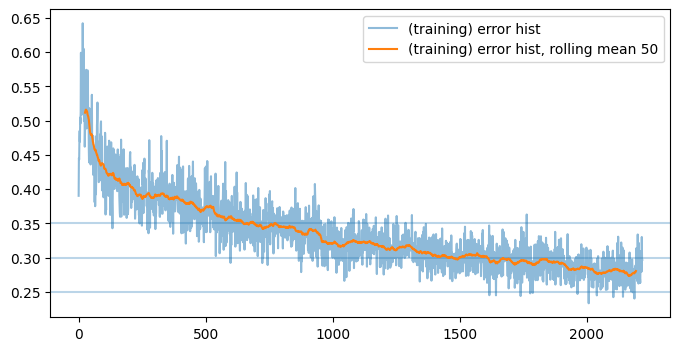

batches:  2221
batches:  2222
batches:  2223
batches:  2224
batches:  2225
batches:  2226
batches:  2227
batches:  2228
batches:  2229
batches:  2230


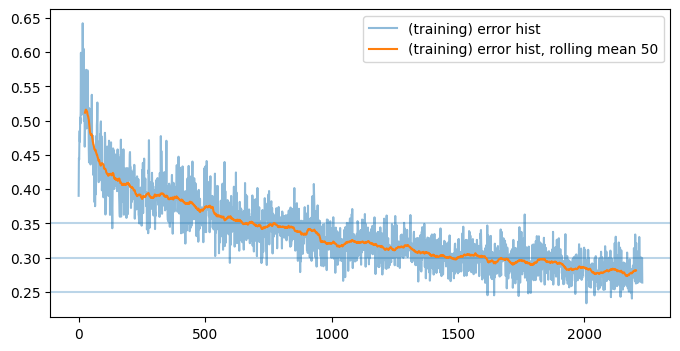

batches:  2231
batches:  2232
batches:  2233
batches:  2234
batches:  2235
batches:  2236
batches:  2237
batches:  2238
batches:  2239
batches:  2240


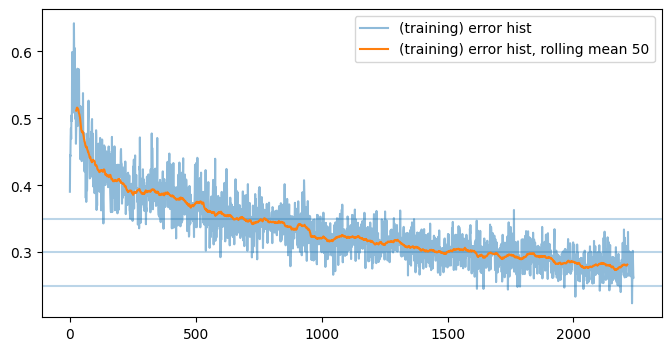

batches:  2241
batches:  2242
batches:  2243
batches:  2244
batches:  2245
batches:  2246
batches:  2247
batches:  2248
batches:  2249
batches:  2250


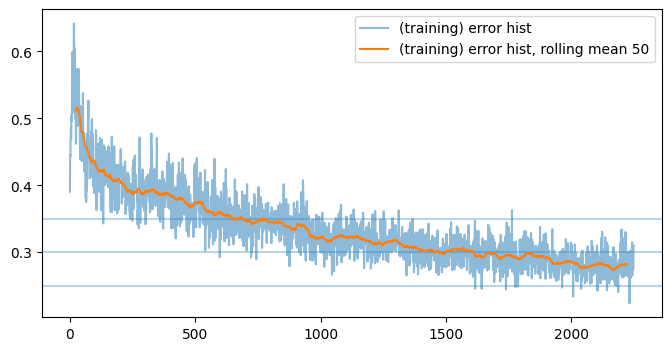

batches:  2251
batches:  2252
batches:  2253
batches:  2254
batches:  2255
batches:  2256
batches:  2257
batches:  2258
batches:  2259
batches:  2260


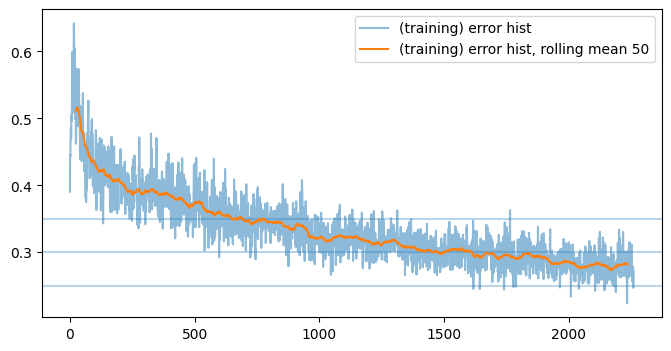

batches:  2261
batches:  2262
batches:  2263
batches:  2264
batches:  2265
batches:  2266
batches:  2267
batches:  2268
batches:  2269
batches:  2270


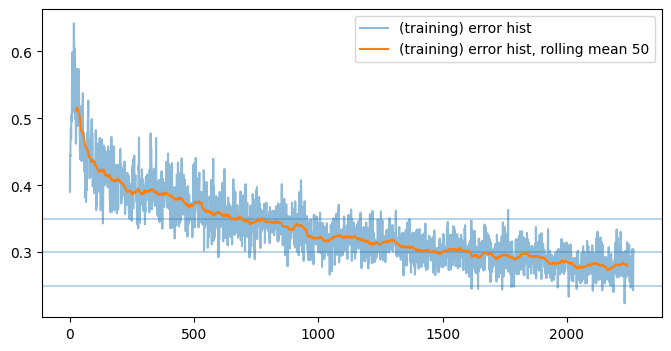

batches:  2271
batches:  2272
batches:  2273
batches:  2274
batches:  2275
batches:  2276
batches:  2277
batches:  2278
batches:  2279
batches:  2280


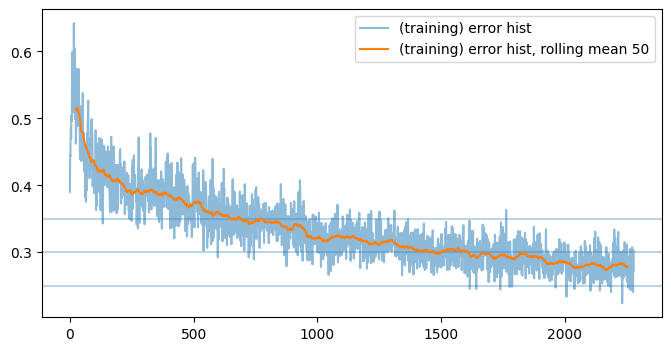

batches:  2281
batches:  2282
batches:  2283
batches:  2284
batches:  2285
batches:  2286
batches:  2287
batches:  2288
batches:  2289
batches:  2290


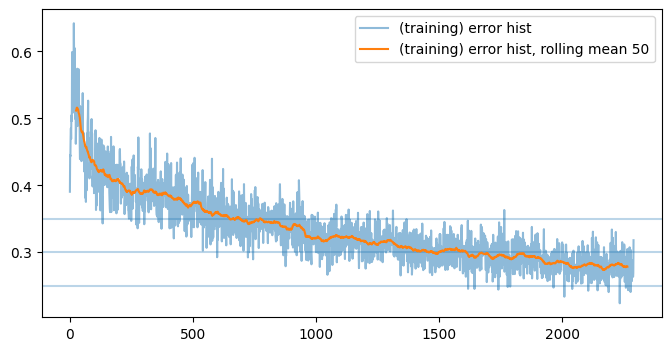

batches:  2291
batches:  2292
batches:  2293
batches:  2294
batches:  2295
batches:  2296
batches:  2297
batches:  2298
batches:  2299
batches:  2300


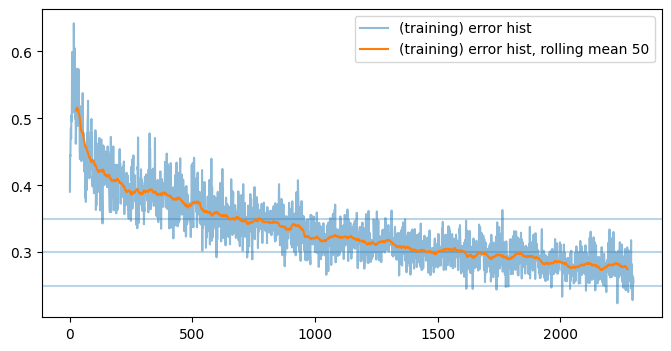

batches:  2301
batches:  2302
batches:  2303
batches:  2304
batches:  2305
batches:  2306
batches:  2307
batches:  2308
batches:  2309
batches:  2310


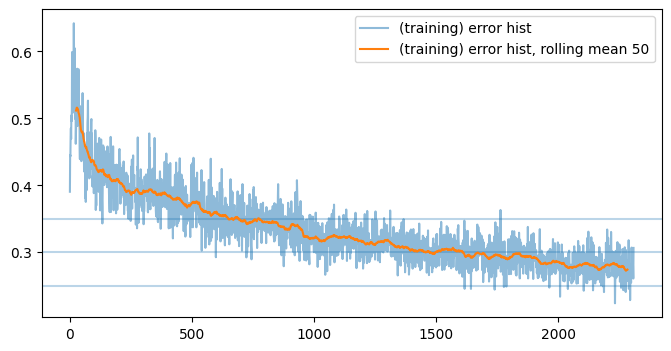

batches:  2311
batches:  2312
batches:  2313
batches:  2314
batches:  2315
batches:  2316
batches:  2317
batches:  2318
batches:  2319
batches:  2320


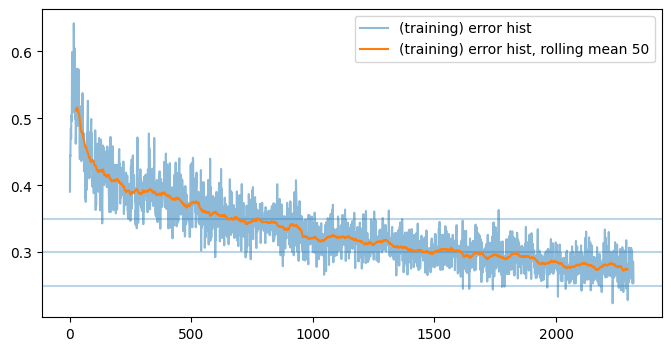

batches:  2321
batches:  2322
batches:  2323
batches:  2324
batches:  2325
batches:  2326
batches:  2327
batches:  2328
batches:  2329
batches:  2330


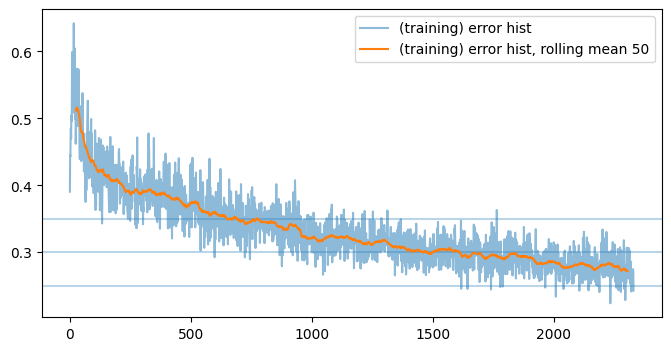

batches:  2331
batches:  2332
batches:  2333
batches:  2334
batches:  2335
batches:  2336
batches:  2337
batches:  2338
batches:  2339
batches:  2340


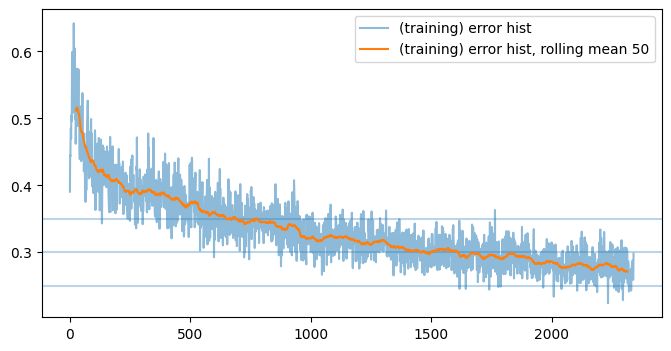

batches:  2341
batches:  2342
batches:  2343
batches:  2344
batches:  2345
batches:  2346
batches:  2347
batches:  2348
batches:  2349
batches:  2350


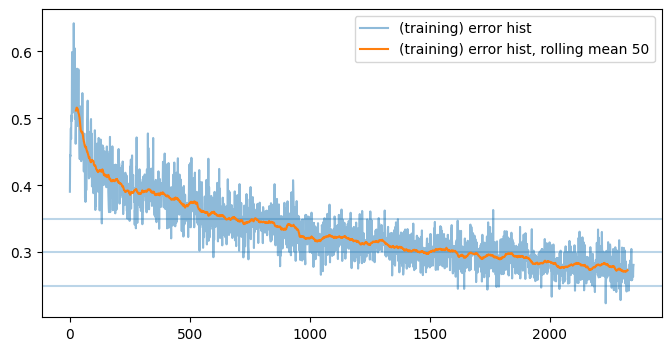

batches:  2351
batches:  2352
batches:  2353
batches:  2354
batches:  2355
batches:  2356
batches:  2357
batches:  2358
batches:  2359
batches:  2360


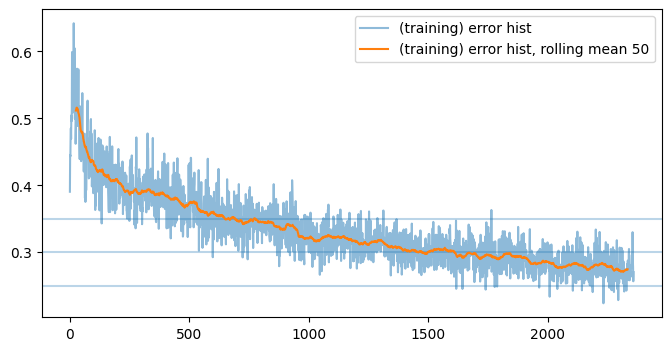

batches:  2361
batches:  2362
batches:  2363
batches:  2364
batches:  2365
batches:  2366
batches:  2367
batches:  2368
batches:  2369
batches:  2370


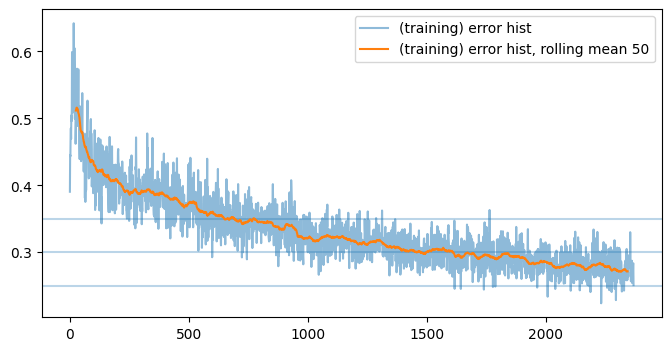

batches:  2371
batches:  2372
batches:  2373
batches:  2374
batches:  2375
batches:  2376
batches:  2377
batches:  2378
batches:  2379
batches:  2380


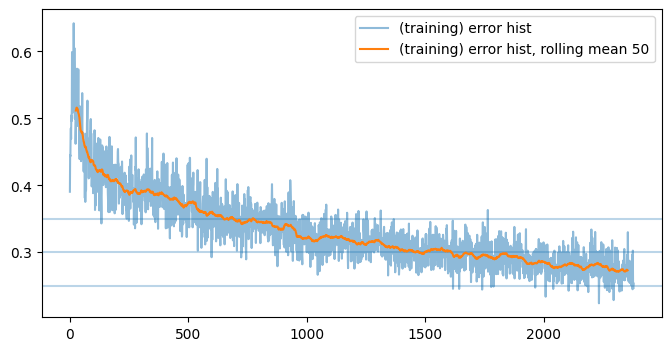

batches:  2381
batches:  2382
batches:  2383
batches:  2384
batches:  2385
batches:  2386
batches:  2387
batches:  2388
batches:  2389
batches:  2390


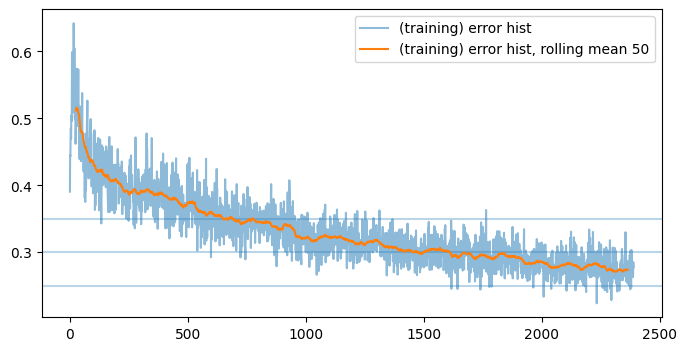

batches:  2391
batches:  2392
batches:  2393
batches:  2394
batches:  2395
batches:  2396
batches:  2397
batches:  2398
batches:  2399
batches:  2400


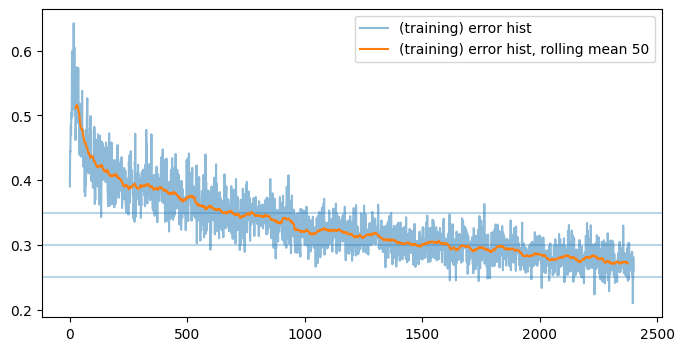

batches:  2401
batches:  2402
batches:  2403
batches:  2404
batches:  2405
batches:  2406
batches:  2407
batches:  2408
batches:  2409
batches:  2410


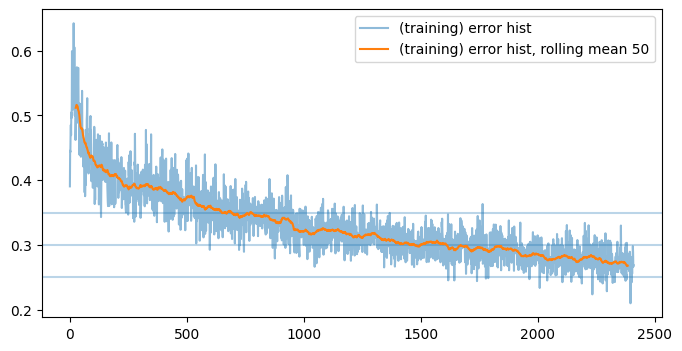

batches:  2411
batches:  2412
batches:  2413
batches:  2414
batches:  2415
batches:  2416
batches:  2417
batches:  2418
batches:  2419
batches:  2420


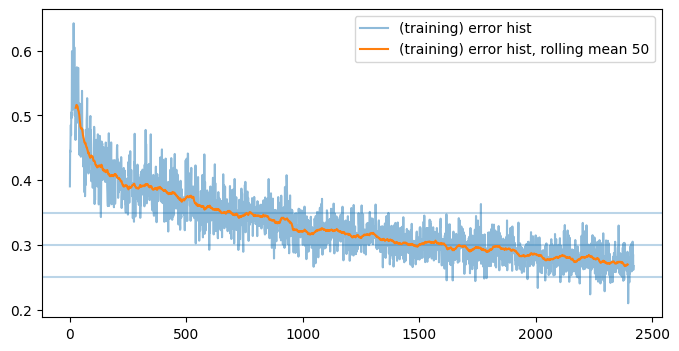

batches:  2421
batches:  2422
batches:  2423
batches:  2424
batches:  2425
batches:  2426
batches:  2427
batches:  2428
batches:  2429
batches:  2430


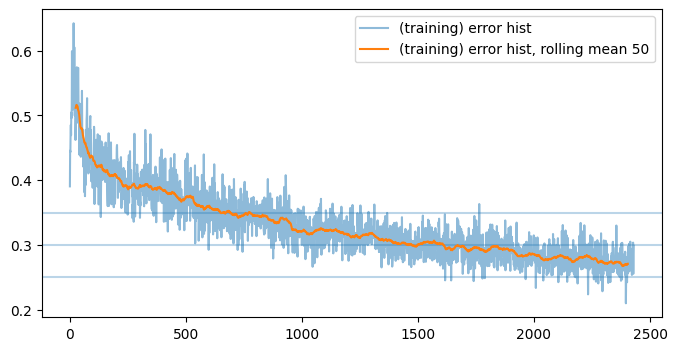

batches:  2431
batches:  2432
batches:  2433
batches:  2434
batches:  2435
batches:  2436
batches:  2437
batches:  2438
batches:  2439
batches:  2440


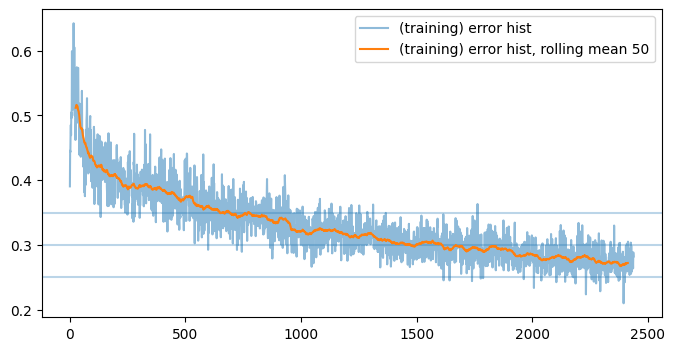

batches:  2441
batches:  2442
batches:  2443
batches:  2444
batches:  2445
batches:  2446
batches:  2447
batches:  2448
batches:  2449
batches:  2450


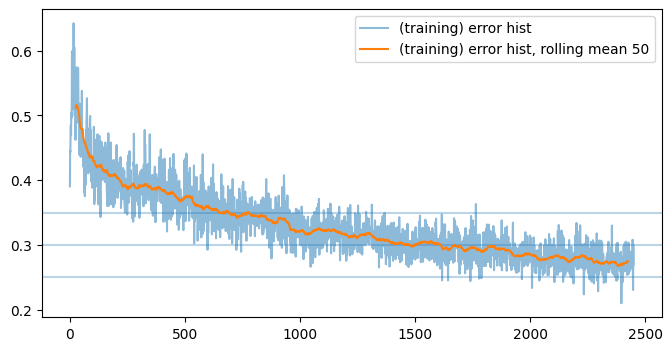

batches:  2451
batches:  2452
batches:  2453
batches:  2454
batches:  2455
batches:  2456
batches:  2457
batches:  2458
batches:  2459
batches:  2460


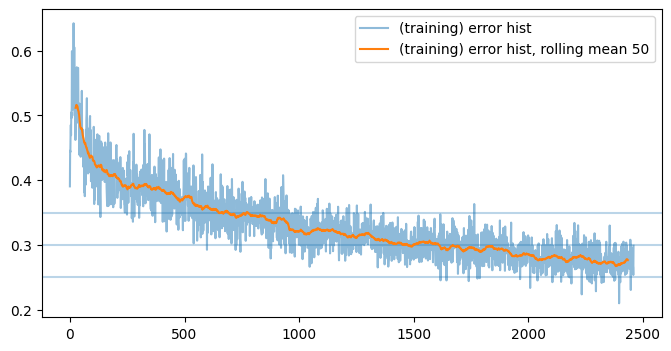

batches:  2461
batches:  2462
batches:  2463
batches:  2464
batches:  2465
batches:  2466
batches:  2467
batches:  2468
batches:  2469
batches:  2470


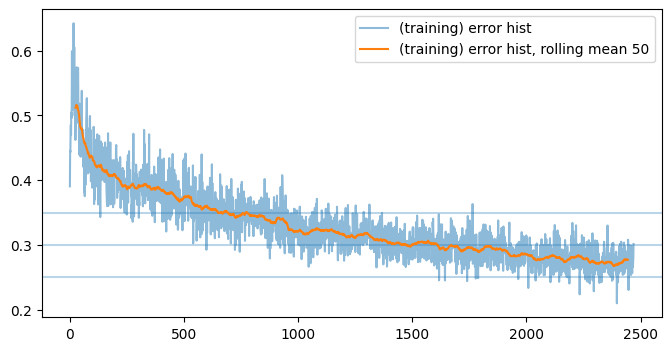

batches:  2471
batches:  2472
batches:  2473
batches:  2474
batches:  2475
batches:  2476
batches:  2477
batches:  2478
batches:  2479
batches:  2480


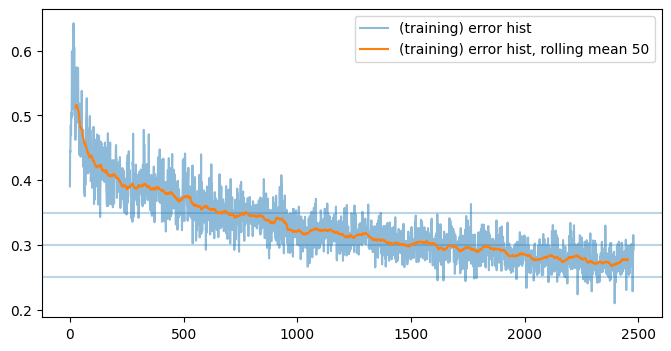

batches:  2481
batches:  2482
batches:  2483
batches:  2484
batches:  2485
batches:  2486
batches:  2487
batches:  2488
batches:  2489
batches:  2490


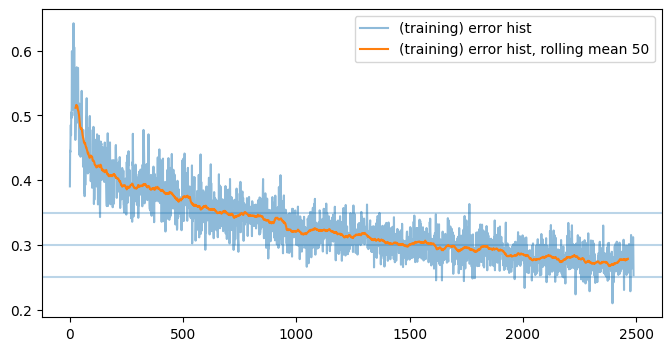

batches:  2491
batches:  2492
batches:  2493
batches:  2494
batches:  2495
batches:  2496
batches:  2497
batches:  2498
batches:  2499
batches:  2500


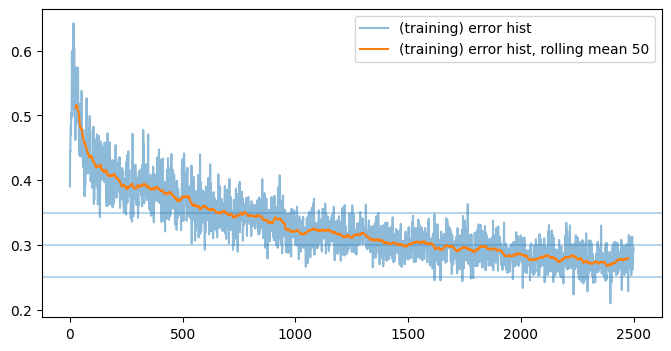

batches:  2501
batches:  2502
batches:  2503
batches:  2504
batches:  2505
batches:  2506
batches:  2507
batches:  2508
batches:  2509
batches:  2510


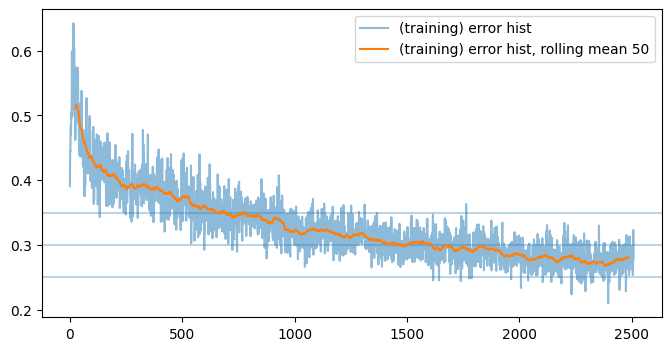

batches:  2511
batches:  2512
batches:  2513
batches:  2514
batches:  2515
batches:  2516
batches:  2517
batches:  2518
batches:  2519
batches:  2520


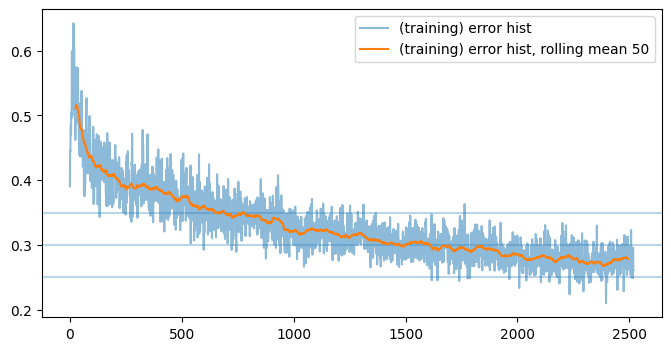

batches:  2521
batches:  2522
batches:  2523
batches:  2524
batches:  2525
batches:  2526
batches:  2527
batches:  2528
batches:  2529
batches:  2530


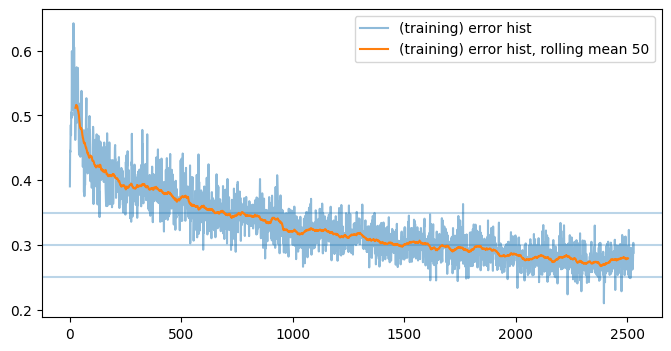

batches:  2531
batches:  2532
batches:  2533
batches:  2534
batches:  2535
batches:  2536
batches:  2537
batches:  2538
batches:  2539
batches:  2540


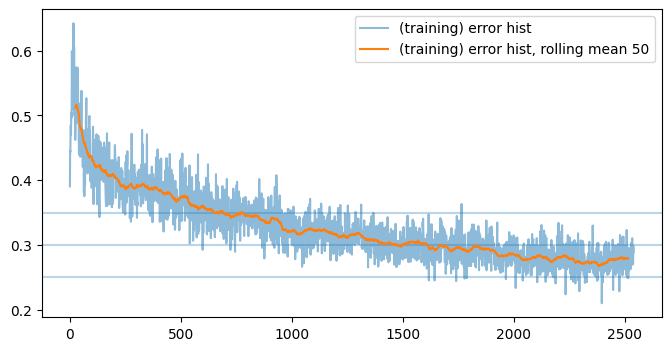

batches:  2541
batches:  2542
batches:  2543
batches:  2544
batches:  2545
batches:  2546
batches:  2547
batches:  2548
batches:  2549
batches:  2550


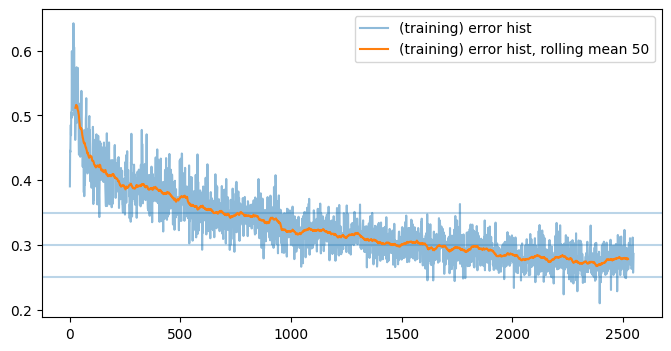

batches:  2551
batches:  2552
batches:  2553
batches:  2554
batches:  2555
batches:  2556
batches:  2557
batches:  2558
batches:  2559
batches:  2560


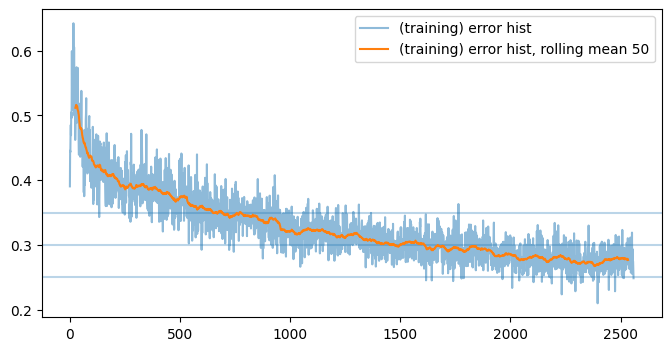

batches:  2561
batches:  2562
batches:  2563
batches:  2564
batches:  2565
batches:  2566
batches:  2567
batches:  2568
batches:  2569
batches:  2570


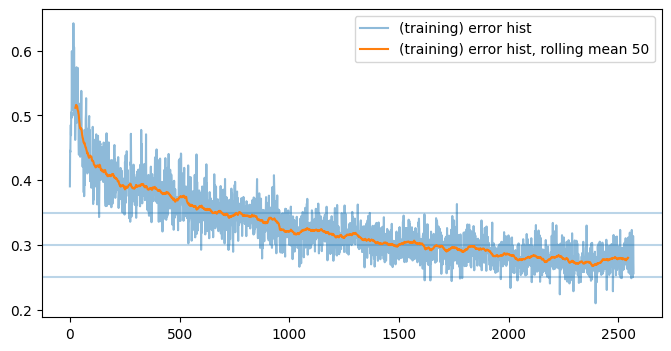

batches:  2571
batches:  2572
batches:  2573
batches:  2574
batches:  2575
batches:  2576
batches:  2577
batches:  2578
batches:  2579
batches:  2580


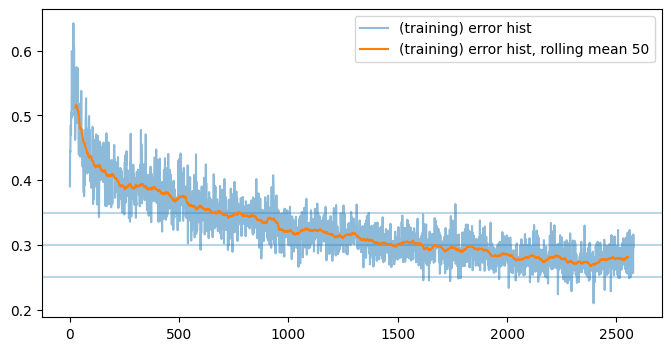

batches:  2581
batches:  2582
batches:  2583
batches:  2584
batches:  2585
batches:  2586
batches:  2587
batches:  2588
batches:  2589
batches:  2590


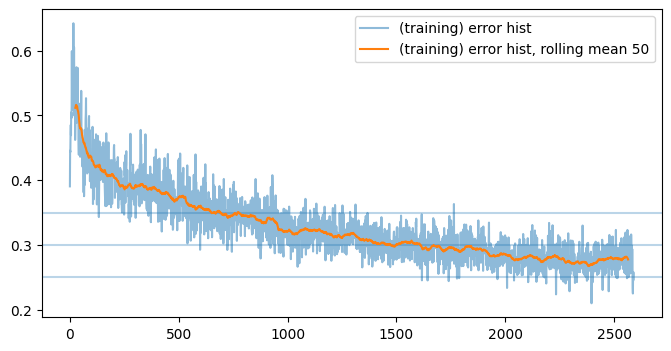

batches:  2591
batches:  2592
batches:  2593
batches:  2594
batches:  2595
batches:  2596
batches:  2597
batches:  2598
batches:  2599
batches:  2600


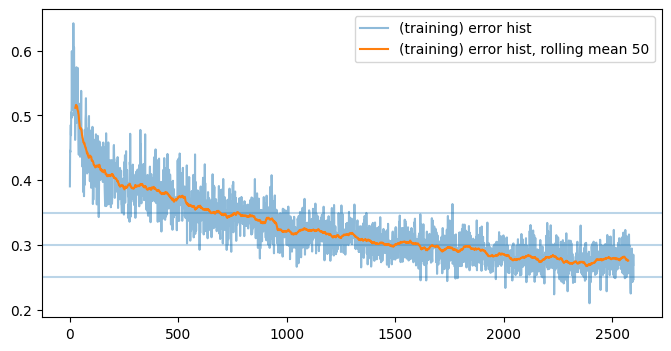

batches:  2601
batches:  2602
batches:  2603
batches:  2604
batches:  2605
batches:  2606
batches:  2607
batches:  2608
batches:  2609
batches:  2610


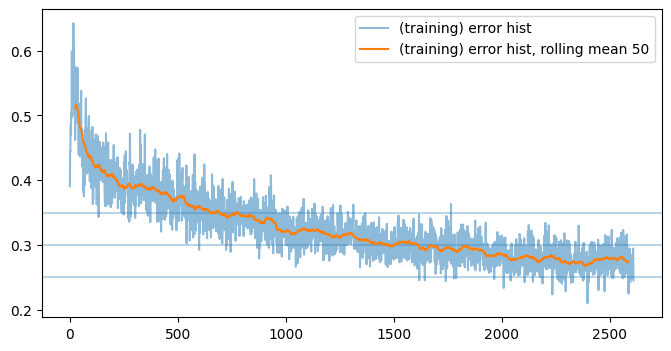

batches:  2611
batches:  2612
batches:  2613
batches:  2614
batches:  2615
batches:  2616
batches:  2617
batches:  2618
batches:  2619
batches:  2620


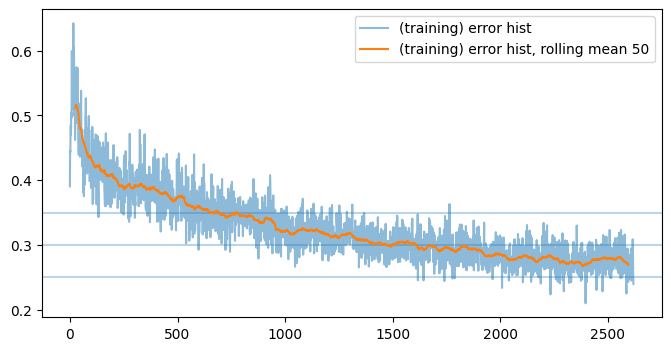

batches:  2621
batches:  2622
batches:  2623
batches:  2624
batches:  2625
batches:  2626
batches:  2627
batches:  2628
batches:  2629
batches:  2630


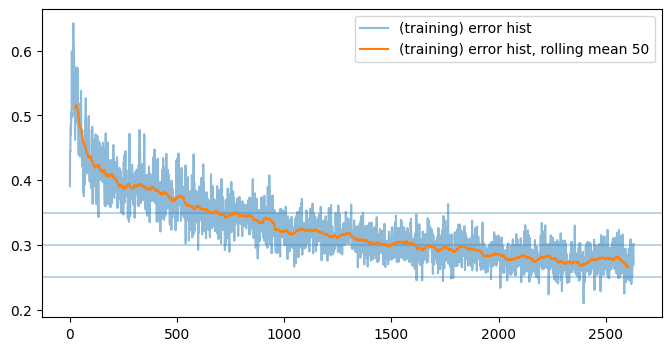

batches:  2631
batches:  2632
batches:  2633
batches:  2634
batches:  2635
batches:  2636
batches:  2637
batches:  2638
batches:  2639
batches:  2640


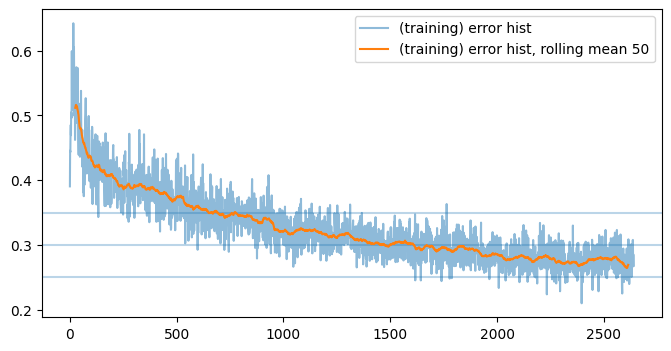

batches:  2641
batches:  2642
batches:  2643
batches:  2644
batches:  2645
batches:  2646
batches:  2647
batches:  2648
batches:  2649
batches:  2650


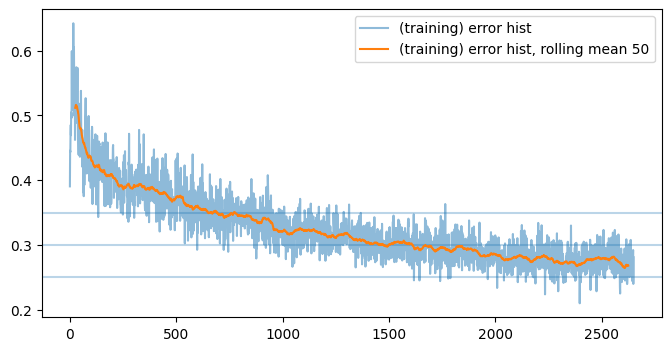

batches:  2651
batches:  2652
batches:  2653
batches:  2654
batches:  2655
batches:  2656
batches:  2657
batches:  2658
batches:  2659
batches:  2660


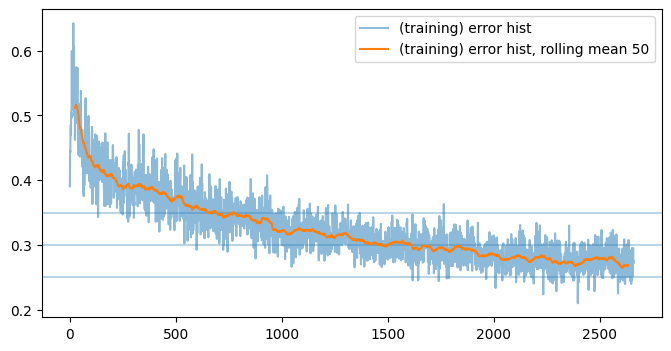

batches:  2661
batches:  2662
batches:  2663
batches:  2664
batches:  2665
batches:  2666
batches:  2667
batches:  2668
batches:  2669
batches:  2670


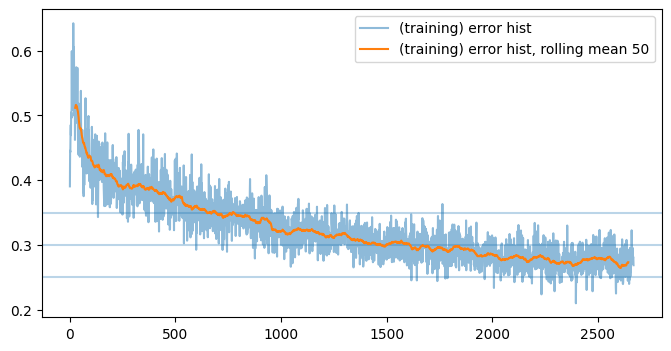

batches:  2671
batches:  2672
batches:  2673
batches:  2674
batches:  2675
batches:  2676
batches:  2677
batches:  2678
batches:  2679
batches:  2680


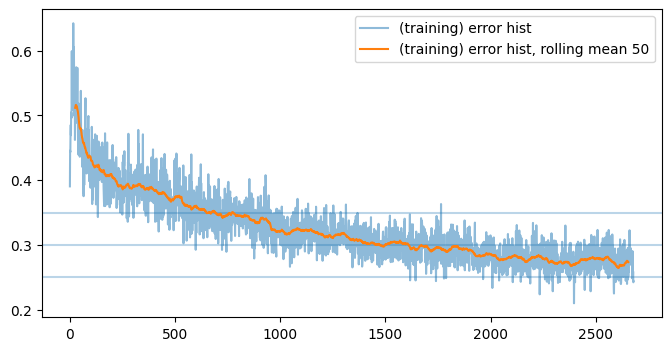

batches:  2681
batches:  2682
batches:  2683
batches:  2684
batches:  2685
batches:  2686
batches:  2687
batches:  2688
batches:  2689
batches:  2690


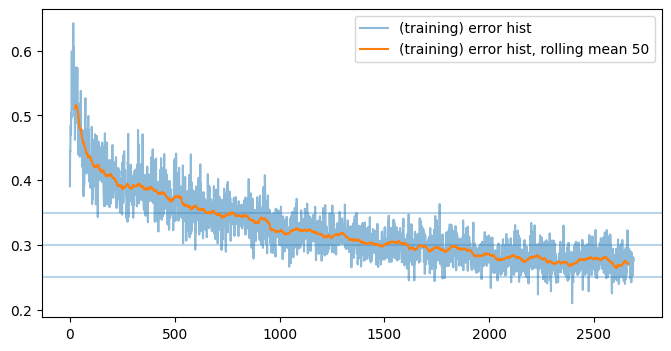

batches:  2691
batches:  2692
batches:  2693
batches:  2694
batches:  2695
batches:  2696
batches:  2697
batches:  2698
batches:  2699
batches:  2700


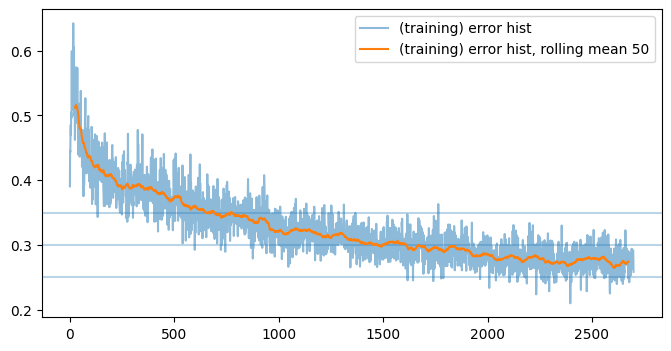

batches:  2701
batches:  2702
batches:  2703
batches:  2704
batches:  2705
batches:  2706
batches:  2707
batches:  2708
batches:  2709
batches:  2710


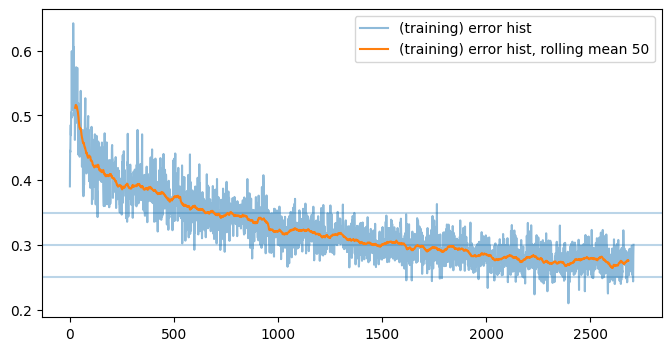

batches:  2711
batches:  2712
batches:  2713
batches:  2714
batches:  2715
batches:  2716
batches:  2717
batches:  2718
batches:  2719
batches:  2720


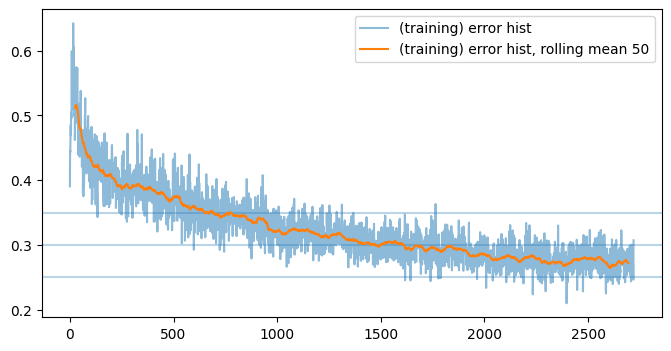

batches:  2721
batches:  2722
batches:  2723
batches:  2724
batches:  2725
batches:  2726
batches:  2727
batches:  2728
batches:  2729
batches:  2730


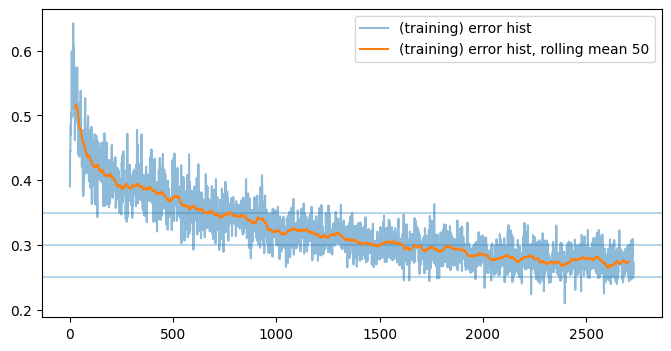

batches:  2731
batches:  2732
batches:  2733
batches:  2734
batches:  2735
batches:  2736
batches:  2737
batches:  2738
batches:  2739
batches:  2740


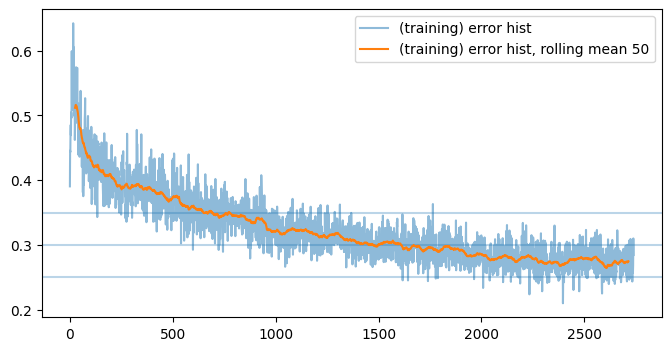

batches:  2741
batches:  2742
batches:  2743
batches:  2744
batches:  2745
batches:  2746
batches:  2747
batches:  2748
batches:  2749
batches:  2750


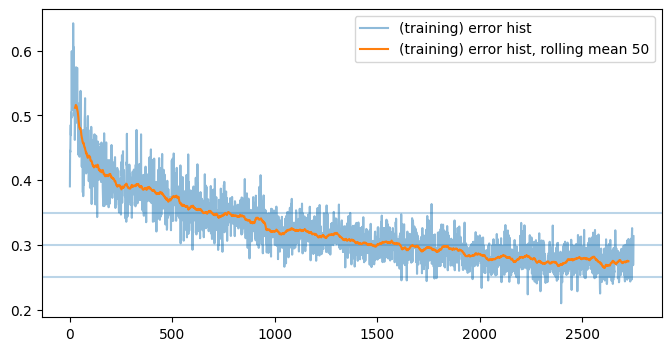

batches:  2751
batches:  2752
batches:  2753
batches:  2754
batches:  2755
batches:  2756
batches:  2757
batches:  2758
batches:  2759
batches:  2760


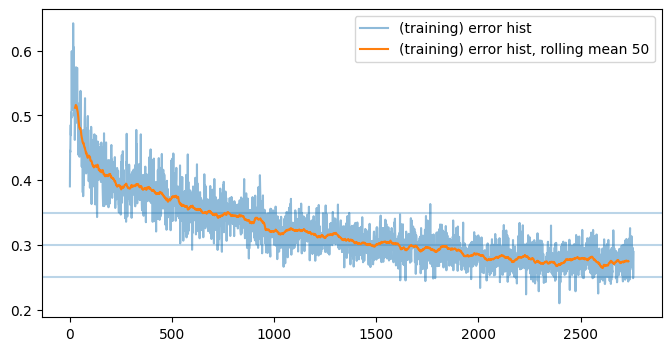

batches:  2761
batches:  2762
batches:  2763
batches:  2764
batches:  2765
batches:  2766
batches:  2767
batches:  2768
batches:  2769
batches:  2770


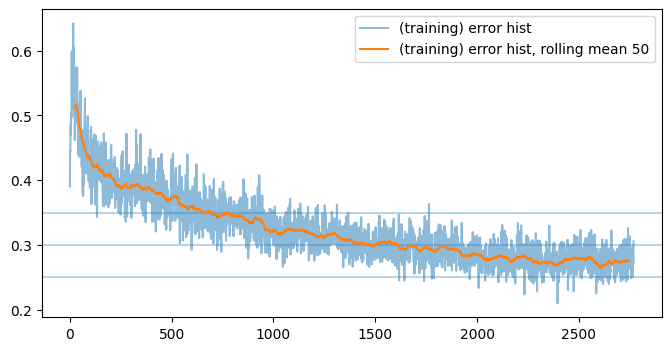

batches:  2771
batches:  2772
batches:  2773
batches:  2774
batches:  2775
batches:  2776
batches:  2777
batches:  2778
batches:  2779
batches:  2780


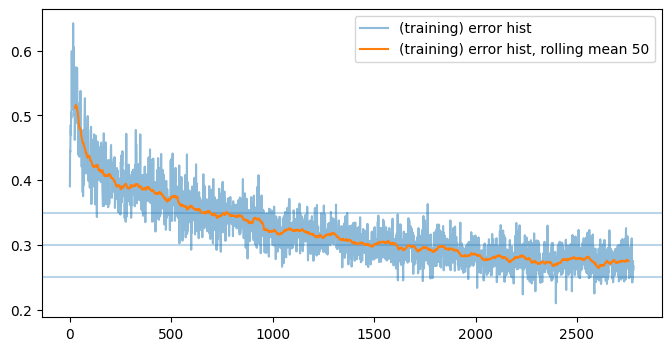

batches:  2781
batches:  2782
batches:  2783
batches:  2784
batches:  2785
batches:  2786
batches:  2787
batches:  2788
batches:  2789
batches:  2790


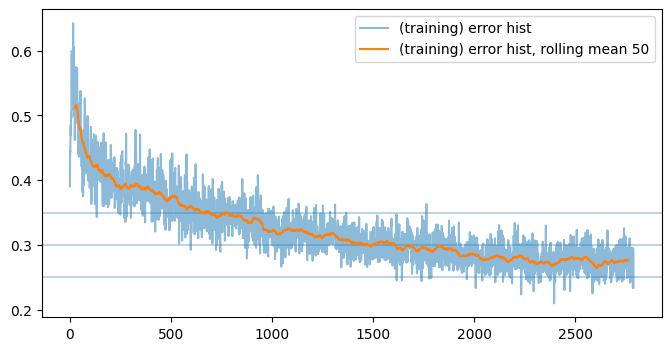

batches:  2791
batches:  2792
batches:  2793
batches:  2794
batches:  2795
batches:  2796
batches:  2797
batches:  2798
batches:  2799
batches:  2800


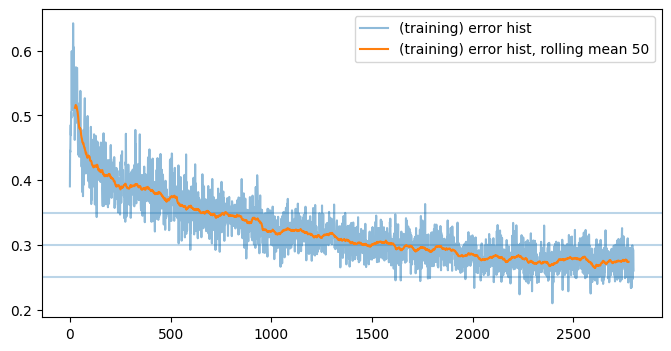

batches:  2801
batches:  2802
batches:  2803
batches:  2804
batches:  2805
batches:  2806
batches:  2807
batches:  2808
batches:  2809
batches:  2810


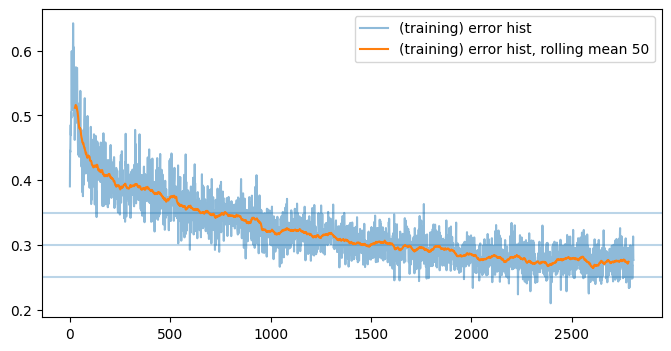

batches:  2811
batches:  2812
batches:  2813
batches:  2814
batches:  2815
batches:  2816
batches:  2817
batches:  2818
batches:  2819
batches:  2820


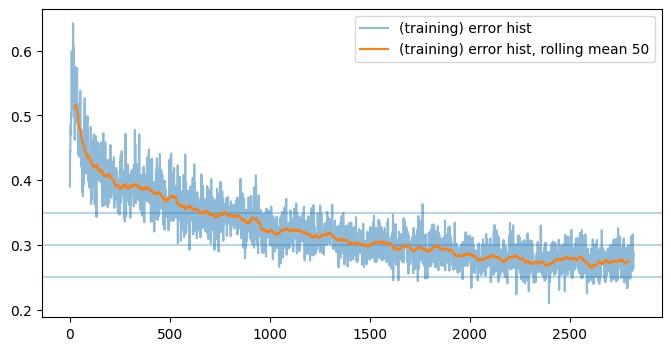

batches:  2821
batches:  2822
batches:  2823
batches:  2824
batches:  2825
batches:  2826
batches:  2827
batches:  2828
batches:  2829
batches:  2830


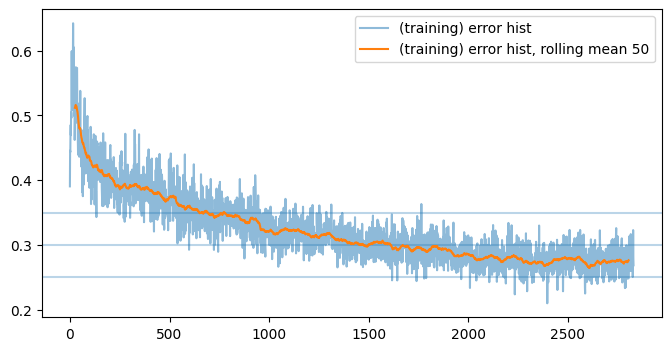

batches:  2831
batches:  2832
batches:  2833
batches:  2834
batches:  2835
batches:  2836
batches:  2837
batches:  2838
batches:  2839
batches:  2840


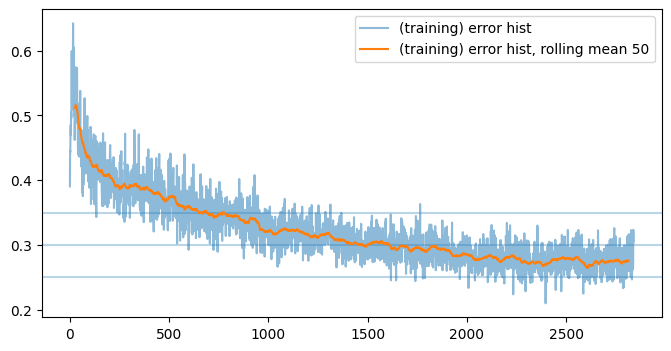

batches:  2841
batches:  2842
batches:  2843
batches:  2844
batches:  2845
batches:  2846
batches:  2847
batches:  2848
batches:  2849
batches:  2850


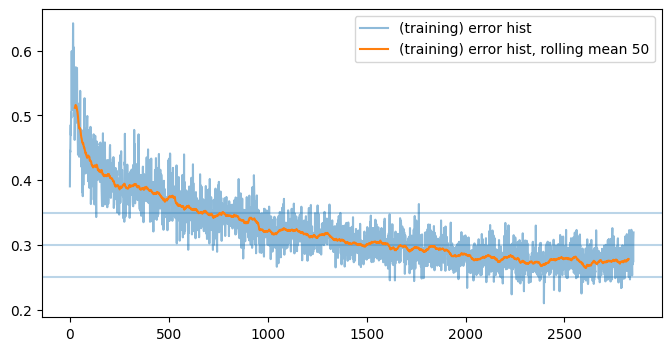

batches:  2851
batches:  2852
batches:  2853
batches:  2854
batches:  2855
batches:  2856
batches:  2857
batches:  2858
batches:  2859
batches:  2860


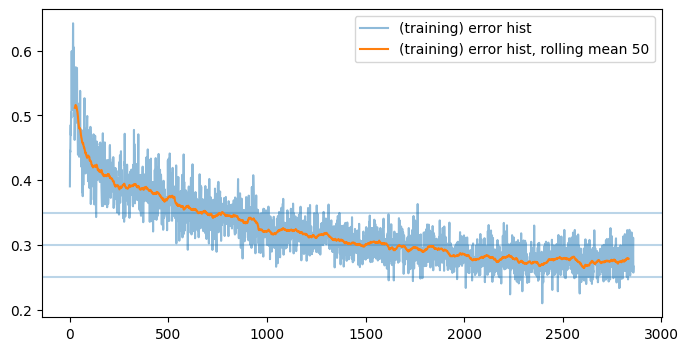

batches:  2861
batches:  2862
batches:  2863
batches:  2864
batches:  2865
batches:  2866
batches:  2867
batches:  2868
batches:  2869
batches:  2870


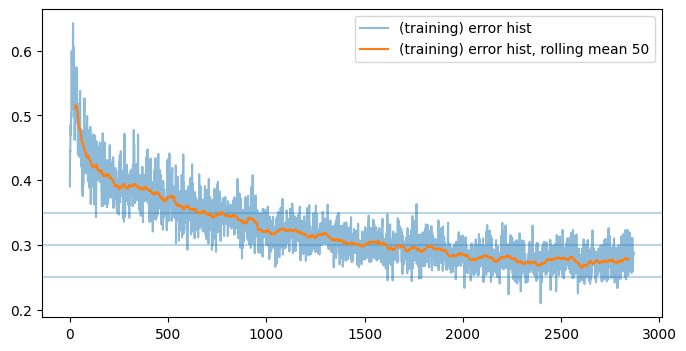

batches:  2871
batches:  2872
batches:  2873
batches:  2874
batches:  2875
batches:  2876
batches:  2877
batches:  2878
batches:  2879
batches:  2880


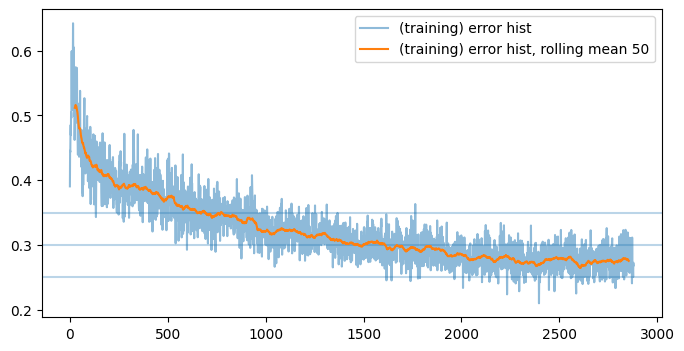

batches:  2881
batches:  2882
batches:  2883
batches:  2884
batches:  2885
batches:  2886
batches:  2887
batches:  2888
batches:  2889
batches:  2890


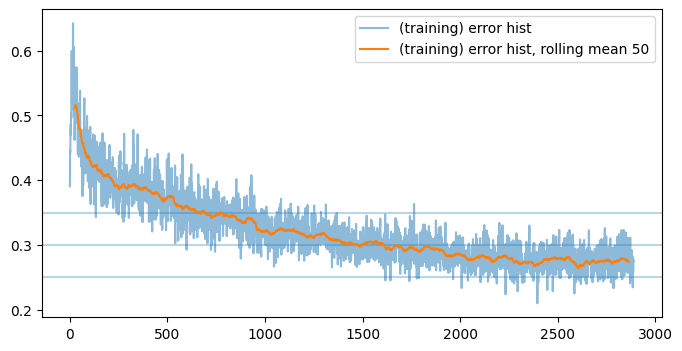

batches:  2891
batches:  2892
batches:  2893
batches:  2894
batches:  2895
batches:  2896
batches:  2897
batches:  2898
batches:  2899
batches:  2900


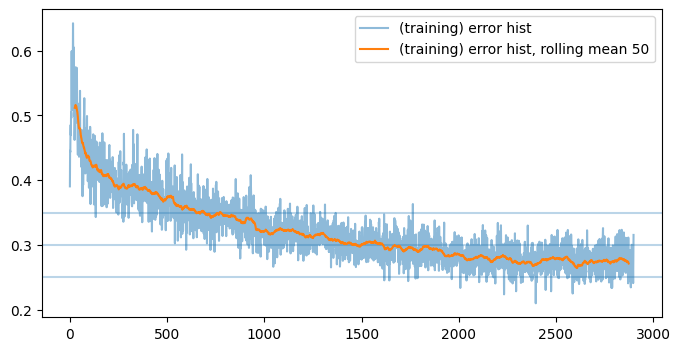

batches:  2901
batches:  2902
batches:  2903
batches:  2904
batches:  2905
batches:  2906
batches:  2907
batches:  2908
batches:  2909
batches:  2910


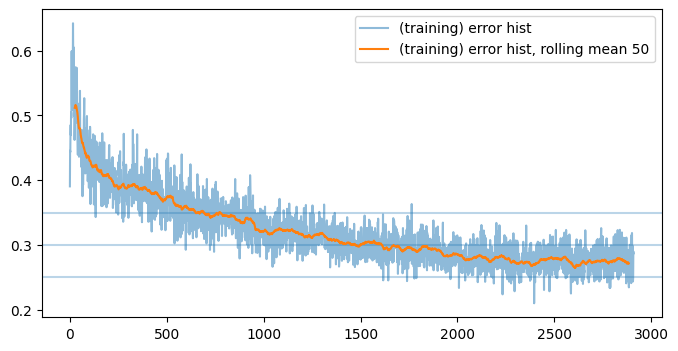

batches:  2911
batches:  2912
batches:  2913
batches:  2914
batches:  2915
batches:  2916
batches:  2917
batches:  2918
batches:  2919
batches:  2920


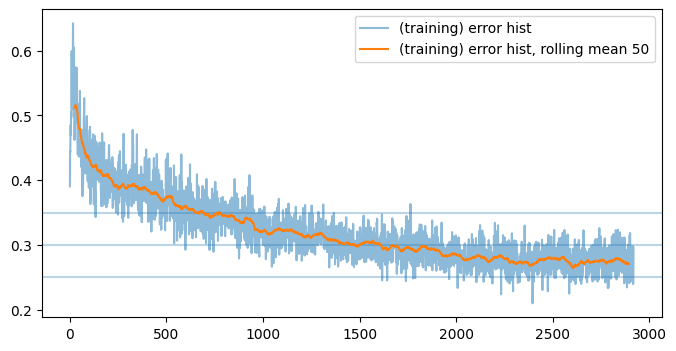

batches:  2921
batches:  2922
batches:  2923
batches:  2924
batches:  2925
batches:  2926
batches:  2927
batches:  2928
batches:  2929
batches:  2930


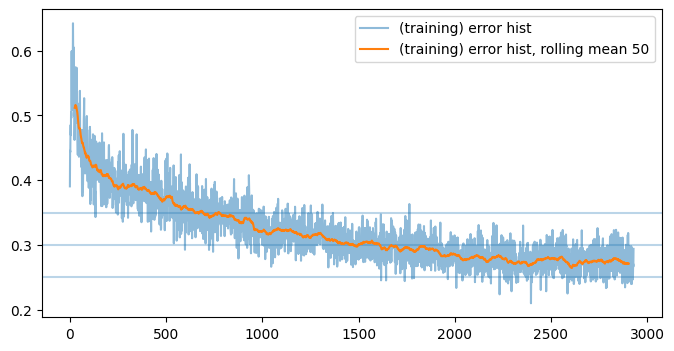

batches:  2931
batches:  2932
batches:  2933
batches:  2934
batches:  2935
batches:  2936
batches:  2937
batches:  2938
batches:  2939
batches:  2940


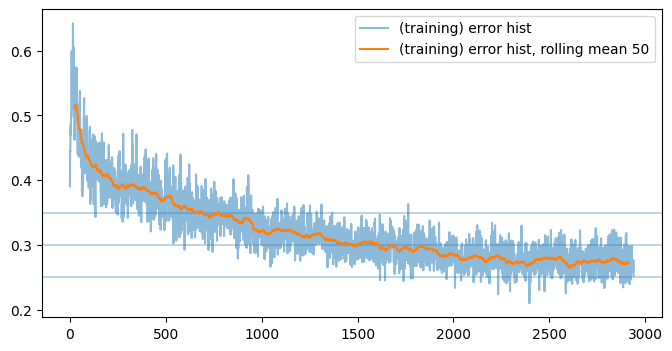

batches:  2941
batches:  2942
batches:  2943
batches:  2944
batches:  2945
batches:  2946
batches:  2947
batches:  2948
batches:  2949
batches:  2950


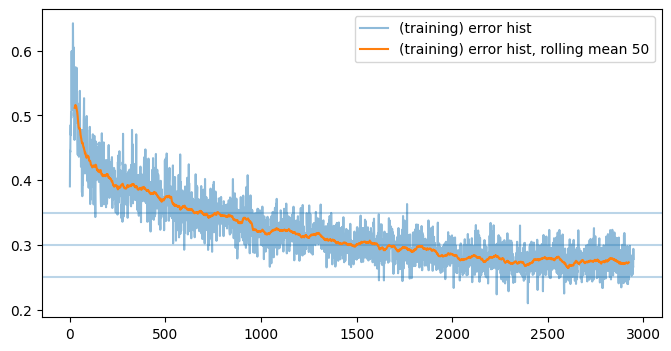

batches:  2951
batches:  2952
batches:  2953
batches:  2954
batches:  2955
batches:  2956
batches:  2957
batches:  2958
batches:  2959
batches:  2960


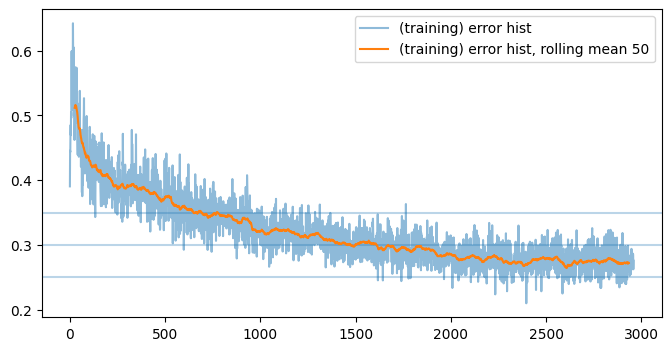

batches:  2961
batches:  2962
batches:  2963
batches:  2964
batches:  2965
batches:  2966
batches:  2967
batches:  2968
batches:  2969
batches:  2970


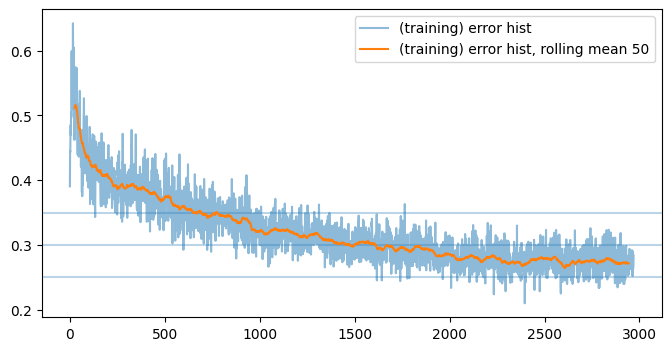

batches:  2971
batches:  2972
batches:  2973
batches:  2974
batches:  2975
batches:  2976
batches:  2977
batches:  2978
batches:  2979
batches:  2980


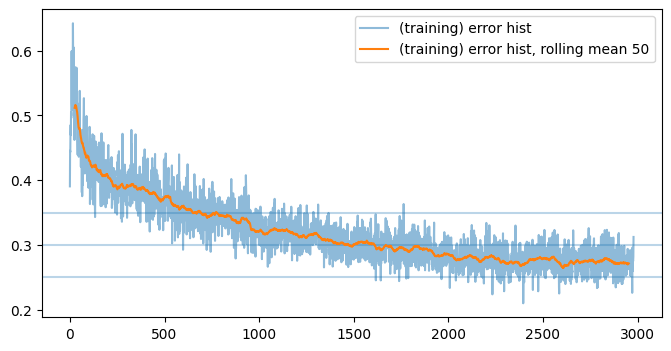

batches:  2981
batches:  2982
batches:  2983
batches:  2984
batches:  2985
batches:  2986
batches:  2987
batches:  2988
batches:  2989
batches:  2990


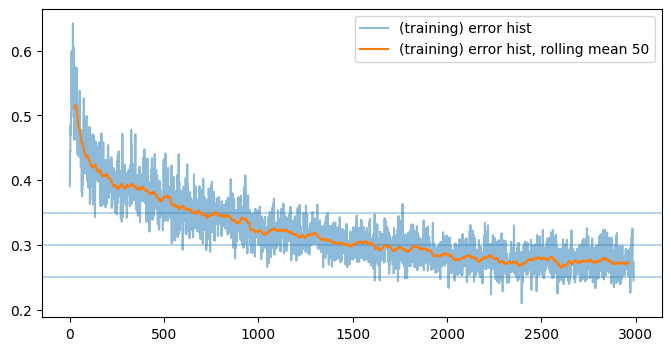

batches:  2991
batches:  2992
batches:  2993
batches:  2994
batches:  2995
batches:  2996
batches:  2997
batches:  2998
batches:  2999
batches:  3000


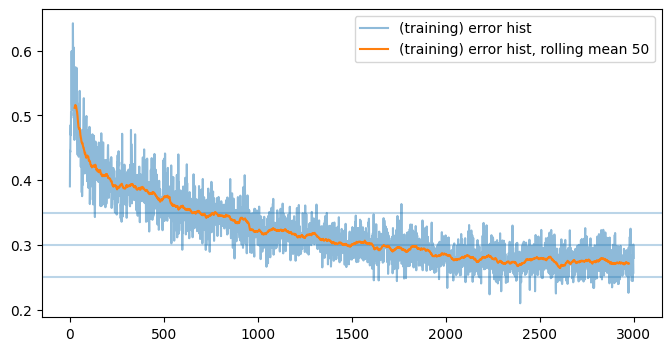

batches:  3001
batches:  3002
batches:  3003
batches:  3004
batches:  3005
batches:  3006
batches:  3007
batches:  3008
batches:  3009
batches:  3010


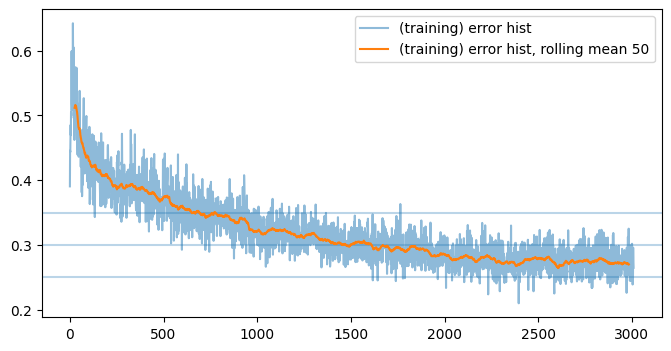

batches:  3011
batches:  3012
batches:  3013
batches:  3014
batches:  3015
batches:  3016
batches:  3017
batches:  3018
batches:  3019
batches:  3020


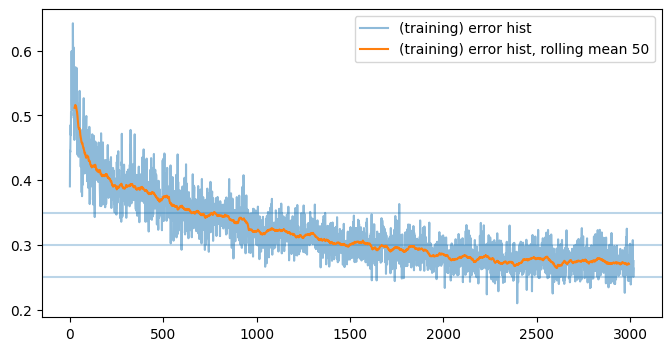

batches:  3021
batches:  3022
batches:  3023
batches:  3024
batches:  3025
batches:  3026
batches:  3027
batches:  3028
batches:  3029
batches:  3030


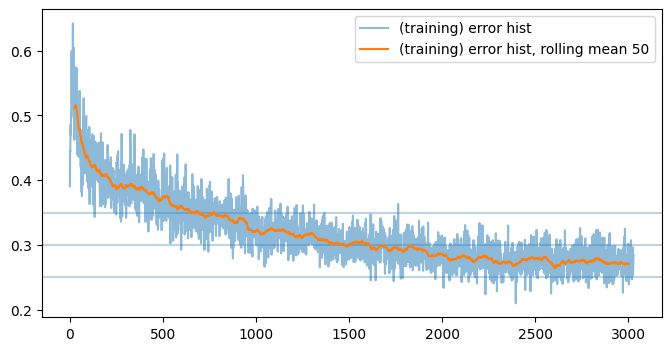

batches:  3031
batches:  3032
batches:  3033
batches:  3034
batches:  3035
batches:  3036
batches:  3037
batches:  3038
batches:  3039
batches:  3040


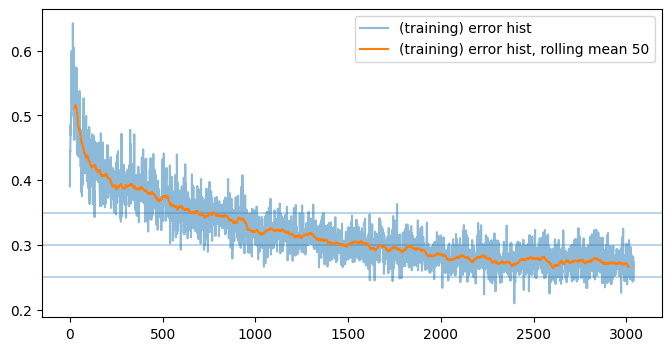

batches:  3041
batches:  3042
batches:  3043
batches:  3044
batches:  3045
batches:  3046
batches:  3047
batches:  3048
batches:  3049
batches:  3050


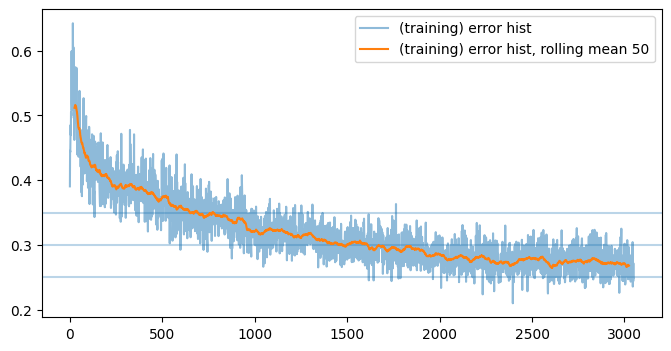

batches:  3051
batches:  3052
batches:  3053
batches:  3054
batches:  3055
batches:  3056
batches:  3057
batches:  3058
batches:  3059
batches:  3060


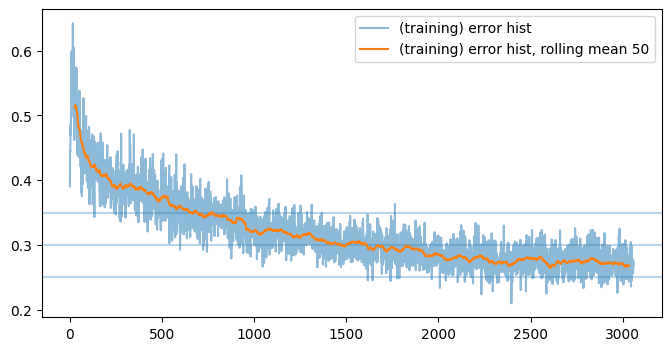

KeyboardInterrupt: 

In [12]:
lr0 = 1.5e-3
# a = 100 # for 1/n decay
b = - np.log(0.5) / 500 # for exp decap (half lr every ... episodes)
n_batches = 1002
n_replay = 10
weight_decay = 1e-7

av_window = 50 # window of averaging for error visual

while True:

    # wait for new data
    while True:
        try:
            with open('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27_2/stats', 'rb') as f:
                stats = torch.load(f)
        except:
            time.sleep(0.05)
            continue
        if stats[0] - 1 > latest_batch_index:
            newest_batch = stats[0] - 1
            break
        else:
            time.sleep(0.05)

    newest_batch = latest_batch_index + 1

    # load all new data
    inputs = []
    labels = []
    for index in range(latest_batch_index + 1, latest_batch_index + 2):
        inputs.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27_2/inputs_{}'.format(index)))
        labels.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27_2/labels_{}'.format(index)))

    inputs_tens = torch.cat(inputs).float() # bool -> float
    labels_tens = torch.cat(labels)

    # get error of new data (without backprop)
    out = model(inputs_tens)
    out = out.view(out.shape[0])
    loss = criterion(out, labels_tens)
    error_hist.append(loss.item())

    # load additional older data to replay
    if latest_batch_index > 5:
        # samples from exp distribution, more recent -> more likely
        decay_rate = 0.02
        prob =  np.exp(-decay_rate * np.arange(latest_batch_index)) 
        prob = prob/sum(prob)
        num_samples = n_replay
        samples = np.random.choice(np.arange(latest_batch_index, 0, -1), size=num_samples, p=prob)
        for index in samples:
            inputs.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27_2/inputs_{}'.format(index)))
            labels.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27_2/labels_{}'.format(index)))

    inputs_tens = torch.cat(inputs).float() # bool -> float
    labels_tens = torch.cat(labels)

    # print('training batch ', newest_batch)
    t0 = time.time()

    # training step
    model.train()
    # optimizer = optim.Adam(model.parameters(), lr=lr0 * a / (a + newest_batch), weight_decay=weight_decay)
    optimizer = optim.Adam(model.parameters(), lr=lr0 * np.exp(-b * newest_batch), weight_decay=weight_decay)

    # shuffle data and make mini batches
    indices = torch.randperm(len(inputs_tens))
    inputs_tens = inputs_tens[indices]
    labels_tens = labels_tens[indices]

    batch_size = len(inputs_tens) // n_batches

    inputs_loader = inputs_tens.split(batch_size)
    labels_loader = labels_tens.split(batch_size)

    for inputs, labels in zip(inputs_loader, labels_loader):

        out = model(inputs)
        out = out.view(out.shape[0])
        loss = criterion(out, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # print('training done ({}s)'.format(time.time() - t0))

    if newest_batch % 1 == 0 and newest_batch > 0:

        print('batches: ', newest_batch)
    
    torch.save(error_hist, './error_hist MC v27_2')

    if newest_batch % 10 == 0 and newest_batch > 0:
        plt.figure(figsize=(8, 4))

        plt.axhline(0.35, xmin=0, xmax=1000, alpha=0.3)
        plt.axhline(0.30, xmin=0, xmax=1000, alpha=0.3)
        plt.axhline(0.25, xmin=0, xmax=1000, alpha=0.3)

        plt.plot(error_hist, label='(training) error hist', alpha=0.5)
        plt.plot(range(av_window//2, len(error_hist) - av_window//2), [np.mean(error_hist[i:(i+av_window)]) for i in range(len(error_hist) - av_window)], label='(training) error hist, rolling mean '+str(av_window))
        plt.legend()

        plt.show()

    if newest_batch % 2 == 0 and newest_batch > 0:
        torch.save(model.state_dict(), './Model Saves MC v27_2/model_{}_batches'.format(newest_batch))

    latest_batch_index = newest_batch